In [1]:
import pandas as pd
import geopandas as gpd
import numpy as np
import seaborn as sns
import scipy.stats as stats
import operator
from scipy.stats import fligner, bartlett, levene, sem, t

import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import matplotlib.ticker as mticker
from cafo_iowa.utils.utils import save_geojson_with_lists

from functools import reduce
from shapely import wkt

import cafo_iowa.db.session as s
from cafo_iowa.estimate.estimate import load_and_process_facilities
import statsmodels.formula.api as smf
from cafo_iowa.utils.visualize import plot_facility_example

from mpl_toolkits.axes_grid1.inset_locator import inset_axes, mark_inset

import os 
os.chdir('..') if os.path.basename(os.getcwd()) == 'notebooks' else None


pd.set_option("display.max_columns", None)

sns.set_theme(style="white", palette="Set1")

au_plot_limit = 2500
uncertainty = True

In [2]:
facilities = load_and_process_facilities()

# Select all facilities that have swine
facilities_swine = facilities[
    (facilities.reported_swine_animal_units > 0)
    & (facilities.swine_cat_combined.isin(["swine_wean", "swine_grow"]))
].copy()

/Users/eacook/eacook/cafo-iowa-public/.env


2026-08-03 18:08:26,495 - INFO - Number of facilities loaded: 9785



Facility Summary:
Total facilities: 9785
Empty facilities: 154
Facilities with barns: 9631


In [3]:
facilities_swine[['reported_ch4_total', 'estimated_ch4_total']]

,reported_ch4_total,estimated_ch4_total
0,60118.432331,53753.061676
1,15029.608083,15728.814692
2,22544.412124,24746.921211
4,75148.040413,67681.910263
5,50098.693609,45459.095233
...,...,...
9779,29401.670812,92862.481514
9781,30059.216165,28461.573789
9782,15029.608083,13835.728660
9783,20039.477444,20206.311347


In [4]:
print("Facilities: ", len(facilities))
print("Barns in facilities: ", facilities["barn_ids"].explode().nunique())
print("Facilities with swine (wean and grow): ", len(facilities_swine))
print(
    "Barns in facilities with swine: ",
    facilities_swine["barn_ids"].explode().nunique(),
)
print("Facilities with no barns: ", np.sum(facilities.barn_count == 0))
print("Swine facilities with no barns: ", np.sum(facilities_swine.barn_count == 0))
print("Mean barns per facility: ", round(facilities["barn_count"].mean(), 2))
print(
    f"N permits in swine facilities: {facilities_swine.permit_ids.explode().nunique()}"
)
print(
    f"N parcels in swine facilities: {facilities_swine.parcel_ids.explode().nunique()}"
)
print(f"N barns in swine facilities: {facilities_swine.barn_ids.explode().nunique()}")
print(
    f"Mean barns per swine facility: {round(facilities_swine['barn_count'].mean(), 2)}"
)
print(
    f"Mean SQM per swine facility: {round(facilities_swine['barn_area_sqm'].mean(), 2)}"
)
print(
    f"Mean reported animal units per swine facility: {round(facilities_swine['reported_animal_units'].mean(), 2)}"
)
print(
    f"Mean estimated animal units per swine facility: {round(facilities_swine['estimated_animal_units'].mean(), 2)}"
)
print(f"N permits in dataset: {facilities_swine.permit_ids.explode().nunique()}")

Facilities:  9785
Barns in facilities:  26243
Facilities with swine (wean and grow):  6556
Barns in facilities with swine:  13935
Facilities with no barns:  154
Swine facilities with no barns:  31
Mean barns per facility:  2.68
N permits in swine facilities: 6766
N parcels in swine facilities: 8249
N barns in swine facilities: 13935
Mean barns per swine facility: 2.13
Mean SQM per swine facility: 2817.2
Mean reported animal units per swine facility: 1299.75
Mean estimated animal units per swine facility: 1276.55
N permits in dataset: 6766


In [5]:
# Swine facilities with between 400 and 500 reported animal units and 200 or less (but not 0) estimated animal units:  25
print(
    "Swine facilities with between 400 and 500 reported animal units and 200 or less (but not 0) estimated animal units: ",
    len(
        facilities_swine[
            (facilities_swine["reported_animal_units"].between(400, 500))
            & (facilities_swine["estimated_animal_units"] <= 200)
            & (facilities_swine["estimated_animal_units"] > 0)
            & (facilities_swine["animal_cat_combined"] == "swine")
        ]
    ),
)
# Swine facilities with between 400 and 500 reported animal units and 1000 or more estimated animal units:  78
print(
    "Swine facilities with between 400 and 500 reported animal units and 1000 or more estimated animal units: ",
    len(
        facilities_swine[
            (facilities_swine["reported_animal_units"].between(400, 500))
            & (facilities_swine["estimated_animal_units"] >= 1000)
            & (facilities_swine["animal_cat_combined"] == "swine")
        ]
    ),
)

# Swine facilities with between 960 and 1000 reported animal units and 500 or less (but not 0) estimated animal units:  77
print(
    "Swine facilities with between 960 and 1000 reported animal units and 500 or less (but not 0) estimated animal units: ",
    len(
        facilities_swine[
            (facilities_swine["reported_animal_units"].between(960, 1000))
            & (facilities_swine["estimated_animal_units"] <= 500)
            & (facilities_swine["estimated_animal_units"] > 0)
            & (facilities_swine["animal_cat_combined"] == "swine")
        ]
    ),
)

# Swine facilities with between 960 and 1000 reported animal units and 1500 or more estimated animal units:  127
print(
    "Swine facilities with between 960 and 1000 reported animal units and 1500 or more estimated animal units: ",
    len(
        facilities_swine[
            (facilities_swine["reported_animal_units"].between(960, 1000))
            & (facilities_swine["estimated_animal_units"] >= 1500)
            & (facilities_swine["animal_cat_combined"] == "swine")
        ]
    ),
)

Swine facilities with between 400 and 500 reported animal units and 200 or less (but not 0) estimated animal units:  0
Swine facilities with between 400 and 500 reported animal units and 1000 or more estimated animal units:  27
Swine facilities with between 960 and 1000 reported animal units and 500 or less (but not 0) estimated animal units:  4
Swine facilities with between 960 and 1000 reported animal units and 1500 or more estimated animal units:  64


In [6]:
# Drop facilities with other animals
nrows_before = facilities_swine.shape[0]
facilities_swine = facilities_swine[
    facilities_swine.swine_cat_combined != "swine_and_other_animal"
].copy()

print(
    f"Dropped {(nrows_before - facilities_swine.shape[0]) * 100 / nrows_before:.1f}% ({nrows_before - facilities_swine.shape[0]})  facilities that house swine and other animals"
)

# Drop all swine types other than wean and grow
# nrows_before = facilities_swine.shape[0]
# facilities_swine = facilities_swine[
#     facilities_swine.swine_cat_combined.isin(["swine_wean", "swine_grow"])
# ].copy()
# print(
#     f"Dropped {(nrows_before - facilities_swine.shape[0]) * 100 / nrows_before:.1f}% ({nrows_before - facilities_swine.shape[0]}) facilities that house not grow or wean swine"
# )

# remove facilities with 0 reported animal units
nrows_before = facilities_swine.shape[0]
facilities_swine = facilities_swine[facilities_swine.reported_animal_units > 0]
print(
    f"Dropped {(nrows_before - facilities_swine.shape[0]) * 100 / nrows_before:.1f}% ({nrows_before - facilities_swine.shape[0]}) facilities with 0 reported animal units"
)

# remove facilities with 0 estimated animal units
nrows_before = facilities_swine.shape[0]
facilities_swine = facilities_swine[facilities_swine.estimated_animal_units > 0]
print(
    f"Dropped {(nrows_before - facilities_swine.shape[0]) * 100 / nrows_before:.1f}% ({nrows_before - facilities_swine.shape[0]}) facilities with 0 estimated animal units"
)

Dropped 0.0% (0)  facilities that house swine and other animals
Dropped 0.0% (0) facilities with 0 reported animal units
Dropped 0.5% (31) facilities with 0 estimated animal units


In [7]:
# Find duplicated permit IDs
duplicated_permits = facilities_swine[
    facilities_swine.permit_ids.duplicated(keep=False)
]
if len(duplicated_permits) > 0:
    print(f"There are {len(duplicated_permits)} duplicated permit IDs")
    print(duplicated_permits)

In [8]:
permits = gpd.read_postgis(
    "SELECT * from processed.permits WHERE swine_animal_units > 0",
    s.get_engine(),
    geom_col="geometry",
)

In [9]:
# change reported animal units exactly at threshold to x - 1, to account for rounding (e.g. 999.6 becomes 1000)
thresholds = {
    # 500: ("Medium CAFO threshold (MMP required)", "firebrick"),
    # 1000: ("Large CAFO threshold (Construction permit & MMP required)", "darkred"),
    500: ("MMP required", "#D40000"),
    1000: ("Construction permit \n & MMP required", "#8B0000"),
    # 2000: "Between-facility separation distance increases",
}
adjusted_values = [t-1 for t in thresholds]
columns_to_update = ["reported_animal_units", "reported_swine_animal_units"]

for col in columns_to_update:
    for threshold, adjusted in zip(thresholds, adjusted_values):
        facilities_swine.loc[facilities_swine[col] == threshold, col] = adjusted

columns_to_update = ["animal_units"]

for col in columns_to_update:
    for threshold, adjusted in zip(thresholds, adjusted_values):
        permits.loc[permits[col] == threshold, col] = adjusted

In [10]:
# value counts of top reported animal units, as share of total
top_values = facilities_swine.reported_animal_units.value_counts(normalize=True).head(
    10
)
print(top_values)

reported_animal_units
960     0.160307
996     0.082299
480     0.057471
999     0.054253
1920    0.051954
2000    0.042759
1600    0.042605
992     0.038314
998     0.038314
800     0.029732
Name: proportion, dtype: float64


In [11]:
print(permits.animal_units.value_counts(normalize=True).head(10))

# Calculate share of permits with animal units between 960 and 999
mask_960_999 = (permits.animal_units >= 960) & (permits.animal_units <= 999)
share_960_999 = mask_960_999.mean()
print(f"\nShare of permits with animal units between 960-999: {share_960_999:.1%}")

# Get total count
count_960_999 = mask_960_999.sum()
total_permits = len(permits)
print(
    f"Count of permits with animal units between 960-999: {count_960_999:,} out of {total_permits:,} total permits"
)

animal_units
960     0.137331
996     0.066606
480     0.062028
999     0.048295
1920    0.044518
1600    0.035935
2000    0.035477
992     0.034905
998     0.032044
800     0.027810
Name: proportion, dtype: float64

Share of permits with animal units between 960-999: 33.5%
Count of permits with animal units between 960-999: 2,927 out of 8,738 total permits


In [12]:
# add variables
facilities_swine["swine_cat_combined_label"] = (
    facilities_swine.swine_cat_combined.replace(
        {
            "swine_wean": "Wean-to-Finish",
            "swine_grow": "Grow-to-Finish",
            "swine_nurs": "Nursery",
            "swine_gilt": "Gilt",
            "swine_sow": "Sow",
            "swine_gest": "Gestation",
            "two_or_more_swine_types": "Multiple types",
        }
    )
)
facilities_swine["animal_difference"] = (
    facilities_swine["reported_animal_units"]
    - facilities_swine["estimated_animal_units"]
)

facilities_swine["animal_difference_pct"] = (
    facilities_swine["animal_difference"] / facilities_swine["reported_animal_units"]
)

# Define bin edges:
bins = [0, 299] + list(range(300, 2500, 100)) + [np.inf]

# Define bin labels:
bin_labels = ["0-299"] + [f"{i}-{i+99}" for i in range(300, 2500, 100)] + ["2500+"]

# Bin the reported animal units using pd.cut.
facilities_swine["reported_animal_units_bin"] = pd.cut(
    facilities_swine["reported_animal_units"],
    bins=bins,
    labels=bin_labels,
    include_lowest=True,
    ordered=True,
)

# Figure: Satellite images of facilities

In [13]:
facility_ids = [
    "007311f37ac40e8363ca4184fddfe408",
    "018bb2175be398abd4adde555b96b714",
    "0a800a751bd0a57bb20248a28552a069",
    "e19b5216ff6c2d195bce9b94e645f751",
]


facility_ids

['007311f37ac40e8363ca4184fddfe408',
 '018bb2175be398abd4adde555b96b714',
 '0a800a751bd0a57bb20248a28552a069',
 'e19b5216ff6c2d195bce9b94e645f751']

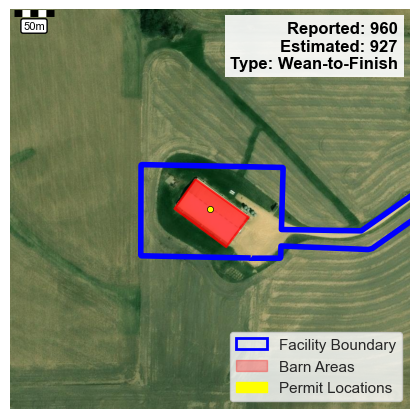

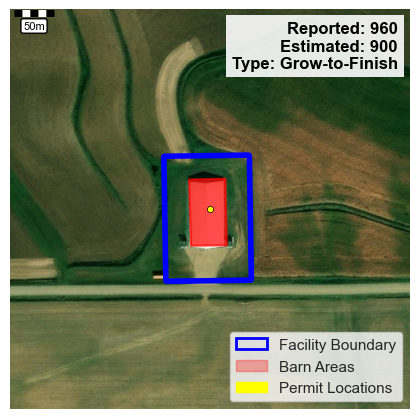

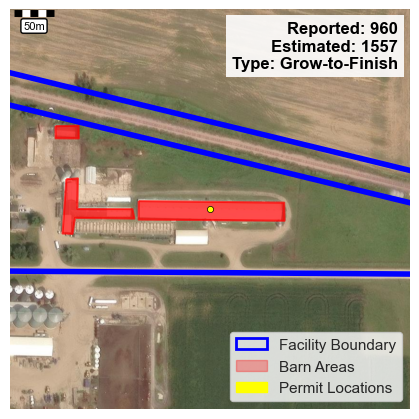

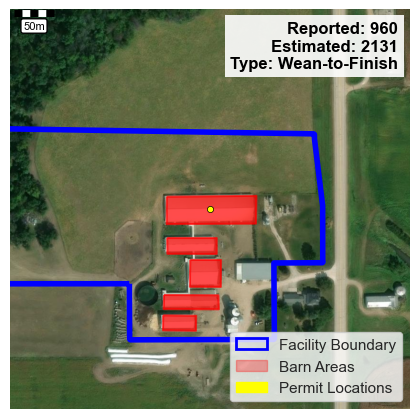

In [14]:
# Combine selections (should be 4 facilities total)
selected_facilities = facilities_swine[facilities_swine.facility_id.isin(facility_ids)]

# plot each facility
for i, row in selected_facilities.iterrows():
    facility_id = row["facility_id"]
    plot_facility_example(
        row,
        show_facility=True,
        show_barns=True,
        show_permits=True,
        show_text=True,
        show_legend=True,
        show_scale=True,
        buffer=500,
        figsize=(4, 4),
        zoom=2,
        save_path = f"./output/plots/satellite_facility_{facility_id}.png",
    )

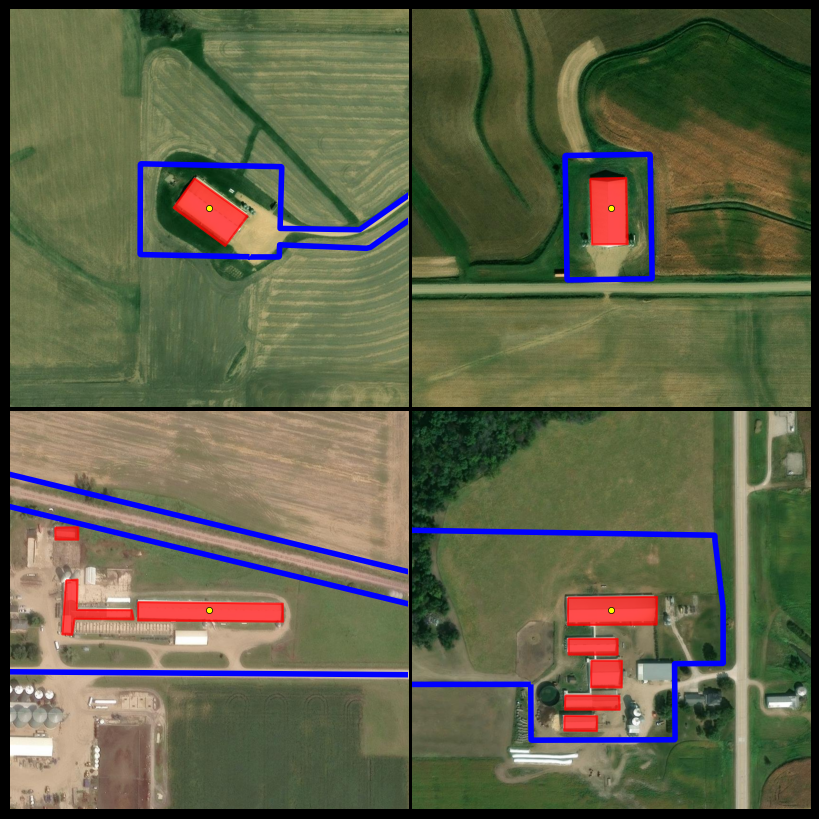

In [15]:
# 2x2 grid of facility examples — images flush with black separator lines
separator = 0.01  # black line width between panels (fraction of axis size; try 0–0.02)

fig, axes = plt.subplots(2, 2, figsize=(8, 8))
fig.patch.set_facecolor('black')

for ax, (_, row) in zip(axes.flat, selected_facilities.iterrows()):
    plot_facility_example(
        row,
        ax=ax,
        show_facility=True,
        show_barns=True,
        show_permits=True,
        show_text=False,
        show_legend=False,
        show_scale=False,
        buffer=500,
        zoom=2,
    )

plt.subplots_adjust(left=0, right=1, top=1, bottom=0, wspace=separator, hspace=separator)
plt.savefig('./output/plots/satellite_facilities_grid.png', dpi=300, bbox_inches='tight')
plt.show()


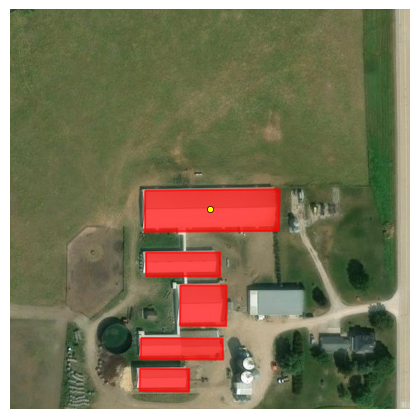

(<Figure size 400x400 with 1 Axes>, <Axes: >)

In [16]:
# Standalone 4th facility at 1.5x zoom
_fourth = selected_facilities[selected_facilities.facility_id == "e19b5216ff6c2d195bce9b94e645f751"].iloc[0]
plot_facility_example(
    _fourth,
    show_facility=False, show_barns=True, show_permits=True,
    show_text=False, show_legend=False, show_scale=False,
    buffer=500, zoom=3,
    figsize=(4, 4),
    save_path='./output/plots/satellite_facility_4th_zoom15.png',
)

# Figure 2: Histogram of reported animal units

/var/folders/1z/l8m7f26x0s97l0n9jzw29yhh0000gn/T/ipykernel_39023/4279654422.py:75: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


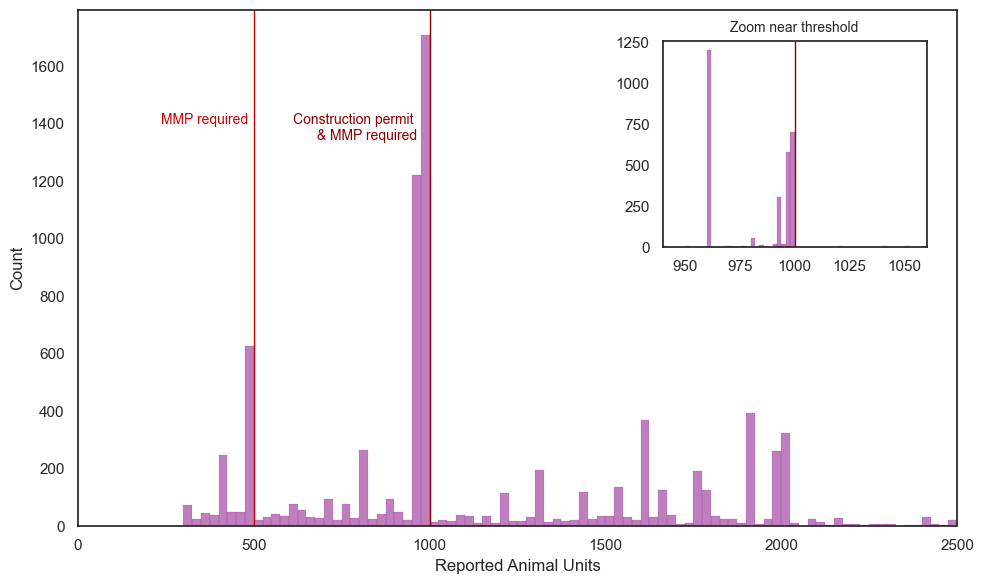

In [17]:
# Define your threshold and zoom range
focus_threshold = 1000
zoom_width = 60
zoom_range = (focus_threshold - zoom_width, focus_threshold + zoom_width)

# Main histogram
fig, ax = plt.subplots(figsize=(10, 6))
sns.histplot(
    data=permits,
    x="animal_units",
    binwidth=25,
    ax=ax,
    zorder=1,
    edgecolor="purple",
    color="purple",
    alpha=0.5,
)

# Add threshold lines and labels
for i, (threshold, (label, color)) in enumerate(thresholds.items()):
    ax.axvline(
        threshold,
        color=color,
        # linestyle="--",
        lw=1,
        zorder=2,
        label=f"{label} ({threshold} AUs)",
    )
    ax.text(
        # threshold - (10+40*i),
        threshold - (15+20*i),
        ax.get_ylim()[1] * 0.8,
        label,
        color=color,
        fontsize=10,
        horizontalalignment="right",
        verticalalignment='top',
        rotation=0,
        # fontweight='bold',
    )

# Main plot labels
ax.set_xlabel("Reported Animal Units")
ax.set_ylabel("Count")
ax.set_xlim(0, au_plot_limit)

# === Inset Axes ===
axins = inset_axes(ax, width="30%", height="40%", loc="upper right", borderpad=2)
sns.histplot(
    data=permits[
        (permits["animal_units"] >= zoom_range[0])
        & (permits["animal_units"] <= zoom_range[1])
    ],
    x="animal_units",
    binwidth=2,
    ax=axins,
    edgecolor="purple",
    color="purple",
    alpha=0.5,
    lw=0.1,
)

# Inset plot styling
axins.set_xlabel("")
axins.set_ylabel("")
axins.axvline(focus_threshold, color="darkred", lw=1)
axins.set_xlim(*zoom_range)
axins.set_title("Zoom near threshold", fontsize=10)
# axins.set_yticklabels([])


# === Connect inset to main plot ===
mark_inset(ax, axins, loc1=2, loc2=4, fc="none", ec="none")

plt.tight_layout()
plt.savefig("output/plots/hist_reported_swine_aus.png", dpi=300)
plt.show()

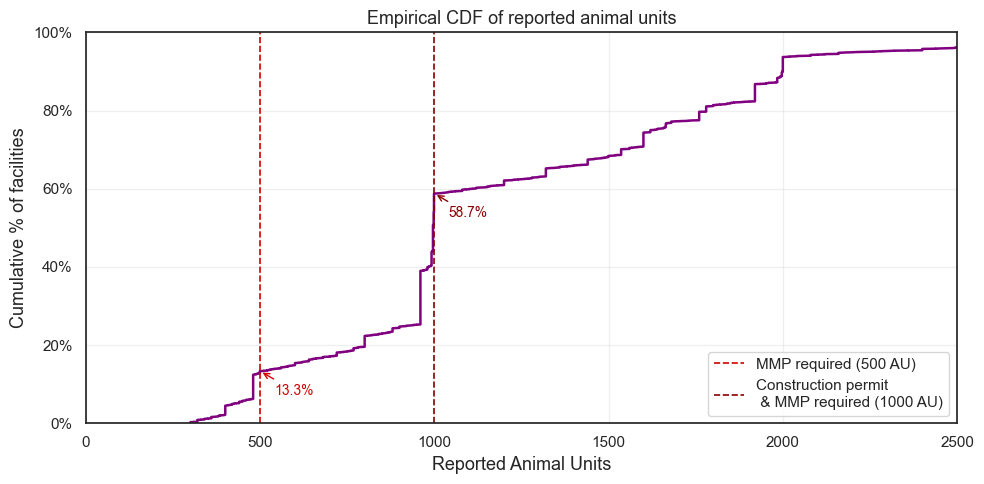

In [18]:
# Empirical CDF of reported animal units
# y = proportion of facilities reporting <= x AU (starts at 0, rises to 1)
_cdf_x = np.sort(permits['animal_units'].dropna().values)
_cdf_y = np.arange(1, len(_cdf_x) + 1) / len(_cdf_x)

fig, ax = plt.subplots(figsize=(10, 5))
ax.plot(_cdf_x, _cdf_y * 100, color='purple', lw=1.8)

for threshold, (label, color) in thresholds.items():
    ax.axvline(threshold, color=color, lw=1.2, linestyle='--',
               label=f'{label} ({threshold} AU)')
    # annotate the CDF value at each threshold
    _pct_at = float(np.mean(_cdf_x <= threshold)) * 100
    ax.annotate(f'{_pct_at:.1f}%',
                xy=(threshold, _pct_at),
                xytext=(threshold + 40, _pct_at - 6),
                fontsize=10, color=color,
                arrowprops=dict(arrowstyle='->', color=color, lw=1))

ax.set_xlabel('Reported Animal Units', fontsize=13)
ax.set_ylabel('Cumulative % of facilities', fontsize=13)
ax.set_title('Empirical CDF of reported animal units', fontsize=13)
ax.set_xlim(0, au_plot_limit)
ax.set_ylim(0, 100)
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda v, _: f'{v:.0f}%'))
ax.legend(fontsize=11, frameon=True)
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('output/plots/cdf_reported_aus.png', dpi=300, bbox_inches='tight')
plt.show()


In [19]:
# NaN breakdown for reported_animal_units
_n_total = len(facilities_swine)
_n_nan   = facilities_swine['reported_animal_units'].isna().sum()
_n_valid = _n_total - _n_nan
print(f"facilities_swine total rows:         {_n_total}")
print(f"  reported_animal_units non-null:    {_n_valid}  ({100*_n_valid/_n_total:.1f}%)")
print(f"  reported_animal_units NaN:         {_n_nan}  ({100*_n_nan/_n_total:.1f}%)")
print()
# seaborn histplot/kdeplot silently skips NaN rows
print("Note: cell 17 histogram drops the same NaN rows — seaborn skips NaN automatically.")

facilities_swine total rows:         6525
  reported_animal_units non-null:    6525  (100.0%)
  reported_animal_units NaN:         0  (0.0%)

Note: cell 17 histogram drops the same NaN rows — seaborn skips NaN automatically.


In [20]:
# McCrary density discontinuity test (Cattaneo, Jansson, Ma)
# Install once if needed: pip install rddensity
from rddensity import rddensity

# --- tweak these ---
_cutoffs = [500, 1000]
_h       = []            # bandwidth: [] = MSE-optimal auto-select; or e.g. 50 (in AU)
_kernel  = 'triangular'  # 'triangular' (default), 'uniform', 'epanechnikov'
_p       = 1             # polynomial order: 1 = local linear (default), 2 = quadratic
# -------------------

# Use facility-level reported AUs: one observation per operator reporting decision.
# (permits table may have multiple rows per facility; facilities_swine is facility-level.)
import numpy as np
# Explicit float cast + np.isfinite guard fix ValueError inside rddensity
_X = facilities_swine['reported_animal_units'].dropna().astype(float).values
_X = _X[np.isfinite(_X)]

for _c in _cutoffs:
    print(f"\n{'='*52}")
    print(f"  McCrary test — cutoff = {_c} AU")
    print('='*52)
    _rdd = rddensity(_X, c=_c, h=_h, kernel=_kernel, p=_p)
    _rdd.__repr__()


  McCrary test — cutoff = 500 AU
Manipulation testing using local polynomial density estimation
Number of obs:                              6525
Model:                              unrestricted
Kernel:                               triangular
BW method:                             estimated
VCE:                                   jackknife

c = 500                             Left of c             Right of c
Number of obs:                            674                   5851
Eff. number of obs:                       660                     90
Order est. (p):                             1                      1
Order bias. (q):                            2                      2
BW est.                                 180.0                  180.0

Method:                                     T                P > |T|
Robust                               -14.5601                    0.0

P-values of binomial tests (H0: p =  [0.5] ).

Window Length/2                           < c           

/Users/eacook/eacook/cafo-iowa-public/.venv/lib/python3.12/site-packages/rddensity/rddensity.py:544: UserWarning: There are repeated observations. Point estimates and standard errors have been adjusted. Use option massPoints=FALSE to suppress this feature.


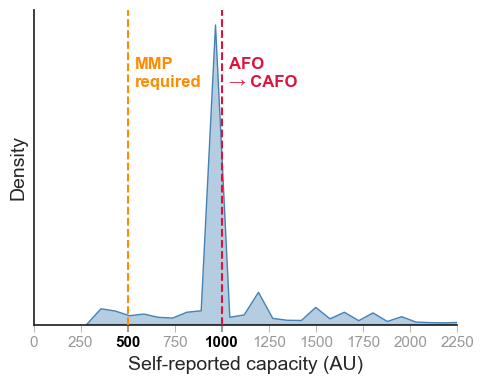

In [21]:
# Simplified density histogram for splash figure
# --- tweak these ---
threshold_colors = {500: 'darkorange', 1000: 'crimson'}
threshold_labels = {500: 'MMP\nrequired', 1000: 'AFO \n→ CAFO'}
label_height = 0.85   # 0–1: fraction of y-axis height where labels sit
bw_adjust = 0.05     # KDE smoothness; lower = more peak detail
tick_length = 5       # x-axis tick mark length in points
_figsize = (5, 4)
x_max = 2250         # right edge of the x-axis
# -------------------

fig, ax = plt.subplots(figsize=_figsize)

sns.kdeplot(
    data=permits, x='animal_units', ax=ax,
    fill=True, color='steelblue', alpha=0.4, bw_adjust=bw_adjust
)

ax.set_xlim(0, x_max)

# X-axis ticks every 250: seaborn 'white' style disables ticks by default, re-enable first
all_ticks = list(range(0, x_max + 1, 250))
ax.set_xticks(all_ticks)
ax.tick_params(axis='x', which='major', bottom=True, length=tick_length, width=1, colors='#999999')

# Override color and weight for threshold ticks and their labels
tick_colors = ['black' if t in threshold_colors else '#999999' for t in all_ticks]
for tick, color in zip(ax.xaxis.get_major_ticks(), tick_colors):
    tick.tick1line.set_color(color)
    tick.tick1line.set_markeredgewidth(1.5 if color == 'black' else 0.5)
    tick.label1.set_color(color)
    tick.label1.set_fontweight('bold' if color == 'black' else 'normal')

ax.set_xlabel('Self-reported capacity (AU)', fontsize=14)
ax.set_ylabel('Density', fontsize=14)
ax.set_yticks([])

# Threshold lines + in-graph labels (to the right of the line)
for threshold, color in threshold_colors.items():
    ax.axvline(threshold, color=color, linestyle='dashed', linewidth=1.5, zorder=3)
    ax.text(
        threshold + 40, label_height,
        threshold_labels[threshold],
        transform=ax.get_xaxis_transform(),
        ha='left', va='top', color=color, fontweight='bold', fontsize=12,
    )

ax.spines[['top', 'right']].set_visible(False)

plt.tight_layout()
plt.savefig('output/plots/hist_reported_aus_simplified.png', dpi=300, bbox_inches='tight')
plt.show()


# Figure: Reported vs. Estimated, histogram

In [22]:
# select facility types to include
included_types = ["Wean-to-Finish", "Grow-to-Finish"]
facilities_swine = facilities_swine[
    facilities_swine.swine_cat_combined_label.isin(included_types)
]

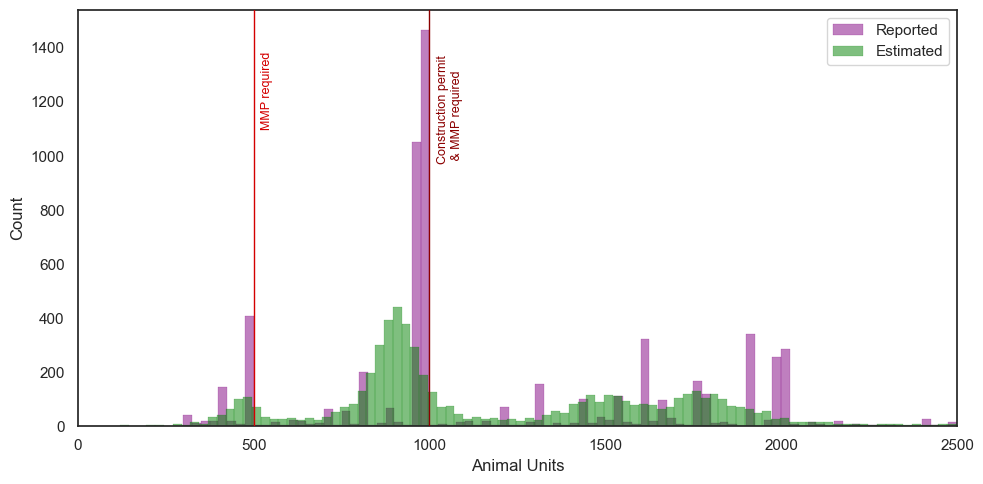

In [23]:
# Create single plot
fig, ax = plt.subplots(figsize=(10, 5))

# Plot reported AUs histogram
sns.histplot(
    data=facilities_swine[
        facilities_swine.swine_cat_combined_label.isin(included_types)
    ],
    x="reported_animal_units",
    binwidth=25,
    ax=ax,
    edgecolor="purple",
    color="purple",
    alpha=0.5,
    label="Reported",
    zorder=1,
)

# Plot estimated AUs histogram
sns.histplot(
    data=facilities_swine[
        facilities_swine.swine_cat_combined_label.isin(included_types)
    ],
    x="estimated_animal_units",
    binwidth=25,
    ax=ax,
    zorder=2,
    edgecolor="green",
    color="green",
    alpha=0.5,
    label="Estimated",
)

# Add vertical lines with labels for thresholds
for threshold, (label, color) in thresholds.items():
    ax.axvline(
        threshold,
        color=color,
        # linestyle="--",
        lw=1,
        zorder=3,
    )
    ax.text(
        threshold + 20,
        ax.get_ylim()[1] * 0.9,
        label,
        color=color,
        fontsize=9,
        verticalalignment="top",
        rotation=90,
    )

ax.set_xlabel("Animal Units")
ax.set_ylabel("Count")
ax.set_xlim(0, au_plot_limit)
ax.legend()

plt.tight_layout()

# Save and show
plt.savefig("output/plots/hist_reported_vs_estimated_aus.png", dpi=300)
plt.show()

# Numbers for paper

In [24]:
def summarize_near_threshold(df, lower, upper, threshold):
    subset = df[df.reported_animal_units.between(lower, upper)]
    n_total = len(subset)
    n_above = (subset.estimated_animal_units >= threshold).sum()
    n_25_higher = (subset.estimated_animal_units >= threshold * 1.25).sum()
    n_50_higher = (subset.estimated_animal_units >= threshold * 1.5).sum()

    print(f"\nNumber of facilities near threshold ({lower}-{upper}): {n_total}")
    print(f"  Estimated ≥ {threshold}: {n_above} ({n_above / n_total:.1%} of total)")
    if n_above > 0:
        print(
            f"    Estimated ≥ {threshold * 1.25:.0f} (25% higher): {n_25_higher} "
            f"({n_25_higher / n_total:.1%} of total, {n_25_higher / n_above:.1%} of above-threshold)"
        )
        print(
            f"    Estimated ≥ {threshold * 1.5:.0f} (50% higher): {n_50_higher} "
            f"({n_50_higher / n_total:.1%} of total, {n_50_higher / n_above:.1%} of above-threshold)"
        )

    return subset, n_total, n_above, n_25_higher, n_50_higher


def estimate_threshold_uncertainty(fac_df, threshold, n_total, n_above):
    above, above_25, above_50 = [], [], []

    n_samples = len(fac_df.estimated_animal_units_samples.iloc[0])

    for i in range(n_samples):
        sample_i = fac_df.estimated_animal_units_samples.apply(lambda x: x[i])
        above_i = sample_i >= threshold
        above.append(above_i.sum())
        above_25.append((sample_i >= threshold * 1.25).sum())
        above_50.append((sample_i >= threshold * 1.5).sum())

    def get_bounds(arr, denom):
        lo, hi = np.percentile(arr, [2.5, 97.5])
        return lo, hi, lo / denom * 100, hi / denom * 100

    return {
        "n_total": n_total,
        "n_above": n_above,
        "above": get_bounds(above, n_total),
        "above_25": {
            "total": get_bounds(above_25, n_total),
            "conditional": get_bounds(above_25, n_above) if n_above > 0 else None,
        },
        "above_50": {
            "total": get_bounds(above_50, n_total),
            "conditional": get_bounds(above_50, n_above) if n_above > 0 else None,
        },
    }


def combine_bounds(arr_a, arr_b, denom_total, denom_above):
    lo = arr_a[0] + arr_b[0]
    hi = arr_a[1] + arr_b[1]
    pct_lo_total = lo / denom_total * 100
    pct_hi_total = hi / denom_total * 100
    pct_lo_cond = lo / denom_above * 100
    pct_hi_cond = hi / denom_above * 100
    return {
        "total": (lo, hi, pct_lo_total, pct_hi_total),
        "conditional": (lo, hi, pct_lo_cond, pct_hi_cond),
    }


def combine_cis(ci_a, ci_b):
    total = ci_a["n_total"] + ci_b["n_total"]
    above = ci_a["n_above"] + ci_b["n_above"]
    return {
        "n_total": total,
        "n_above": above,
        "above": combine_bounds(ci_a["above"], ci_b["above"], total, above)["total"],
        "above_25": combine_bounds(
            ci_a["above_25"]["total"], ci_b["above_25"]["total"], total, above
        ),
        "above_50": combine_bounds(
            ci_a["above_50"]["total"], ci_b["above_50"]["total"], total, above
        ),
    }


def print_ci(label, bounds):
    lo, hi, pct_lo_total, pct_hi_total = bounds["total"]
    print(
        f"  {label}: {lo:.0f} – {hi:.0f} facilities ({pct_lo_total:.1f}% – {pct_hi_total:.1f}% of total)"
    )
    if bounds["conditional"]:
        lo, hi, pct_lo_cond, pct_hi_cond = bounds["conditional"]
        print(f"     ({pct_lo_cond:.1f}% – {pct_hi_cond:.1f}% of above-threshold)")


# --- Summarize near-threshold facilities ---
fac_near_500, n_500, n_500_above, n_500_25, n_500_50 = summarize_near_threshold(
    facilities_swine, 460, 499, 500
)
fac_near_1000, n_1000, n_1000_above, n_1000_25, n_1000_50 = summarize_near_threshold(
    facilities_swine, 960, 999, 1000
)

# --- Combined totals ---
n_total = n_500 + n_1000
n_total_above = n_500_above + n_1000_above
n_total_25 = n_500_25 + n_1000_25
n_total_50 = n_500_50 + n_1000_50

print(f"\nTotal near-threshold facilities: {n_total}")
print(
    f"  Estimated ≥ threshold: {n_total_above} ({n_total_above / n_total:.1%} of total)"
)
print(
    f"    ≥ 20% over: {n_total_25} ({n_total_25 / n_total:.1%} of total, {n_total_25 / n_total_above:.1%} of above-threshold)"
)
print(
    f"    ≥ 50% over: {n_total_50} ({n_total_50 / n_total:.1%} of total, {n_total_50 / n_total_above:.1%} of above-threshold)"
)

# --- Uncertainty estimation ---
ci_500 = estimate_threshold_uncertainty(fac_near_500, 500, n_500, n_500_above)
ci_1000 = estimate_threshold_uncertainty(fac_near_1000, 1000, n_1000, n_1000_above)

# --- Combine CIs ---
ci_total = combine_cis(ci_500, ci_1000)

# --- Print uncertainty intervals ---
print("\nUncertainty intervals (95%) for facilities above threshold:")
print("Threshold: 500 AU")
print_ci("  ≥ 500", {"total": ci_500["above"], "conditional": None})
print_ci("  ≥ 600 (25% over)", ci_500["above_25"])
print_ci("  ≥ 750 (50% over)", ci_500["above_50"])

print("\nThreshold: 1000 AU")
print_ci("  ≥ 1000", {"total": ci_1000["above"], "conditional": None})
print_ci("  ≥ 1200 (25% over)", ci_1000["above_25"])
print_ci("  ≥ 1500 (50% over)", ci_1000["above_50"])

print("\nCombined (460–499 and 960–999):")
print_ci("  ≥ threshold", {"total": ci_total["above"], "conditional": None})
print_ci("  ≥ 25% over", ci_total["above_25"])
print_ci("  ≥ 50% over", ci_total["above_50"])


Number of facilities near threshold (460-499): 415
  Estimated ≥ 500: 190 (45.8% of total)
    Estimated ≥ 625 (25% higher): 99 (23.9% of total, 52.1% of above-threshold)
    Estimated ≥ 750 (50% higher): 69 (16.6% of total, 36.3% of above-threshold)

Number of facilities near threshold (960-999): 2519
  Estimated ≥ 1000: 415 (16.5% of total)
    Estimated ≥ 1250 (25% higher): 130 (5.2% of total, 31.3% of above-threshold)
    Estimated ≥ 1500 (50% higher): 64 (2.5% of total, 15.4% of above-threshold)

Total near-threshold facilities: 2934
  Estimated ≥ threshold: 605 (20.6% of total)
    ≥ 20% over: 229 (7.8% of total, 37.9% of above-threshold)
    ≥ 50% over: 133 (4.5% of total, 22.0% of above-threshold)

Uncertainty intervals (95%) for facilities above threshold:
Threshold: 500 AU
    ≥ 500: 121 – 336 facilities (29.2% – 81.0% of total)
    ≥ 600 (25% over): 81 – 116 facilities (19.5% – 28.0% of total)
     (42.6% – 61.1% of above-threshold)
    ≥ 750 (50% over): 53 – 81 facilities 

In [25]:
# calculate total reported and estimated animal units in bunching region (460-499 or 960-999)
bunchin_region = facilities_swine[
    facilities_swine.reported_animal_units.between(460, 499)
    | facilities_swine.reported_animal_units.between(960, 999)
]
total_reported_aus = bunchin_region.reported_animal_units.sum()
total_estimated_aus = bunchin_region.estimated_animal_units.sum()
print(f"Total reported animal units in bunching region: {total_reported_aus:.2f}")
print(f"Total estimated animal units in bunching region: {total_estimated_aus:.2f}")
print(
    f"Ratio of total estimated to reported animal units in bunching region: {total_estimated_aus/total_reported_aus:.2f}"
)

Total reported animal units in bunching region: 2670234.00
Total estimated animal units in bunching region: 2662522.02
Ratio of total estimated to reported animal units in bunching region: 1.00


# Figure: Reported vs Estimated, scatter


/Users/eacook/eacook/cafo-iowa-public/.venv/lib/python3.12/site-packages/seaborn/axisgrid.py:123: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


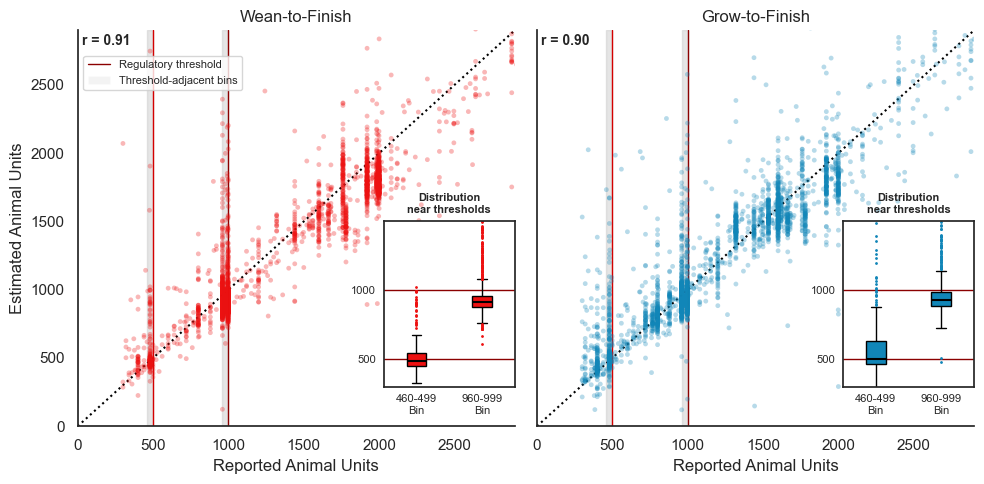

In [26]:
au_plot_limit = 2900
uncertainty = False

# Extract hue -> color mapping from the plot
hue_order = included_types
# palette = sns.color_palette(n_colors=len(hue_order))
palette = ["#ED1111", "#1186b8"]  # red, blue
hue_color_map = dict(zip(hue_order, palette))


# Base faceted scatter plot
g = sns.lmplot(
    data=facilities_swine[
        facilities_swine.swine_cat_combined_label.isin(included_types)
    ],
    x="reported_animal_units",
    y="estimated_animal_units",
    col="swine_cat_combined_label",
    hue="swine_cat_combined_label",
    palette=palette,
    col_wrap=2,
    height=5,
    scatter_kws={"alpha": 0.3, "s": 12, "edgecolor": "none", "zorder": 2},
    fit_reg=False,
)


# Add vertical error bars if uncertainty is enabled
if uncertainty:
    for ax, name in zip(g.axes.flat, included_types):
        facet_data = facilities_swine[facilities_swine.swine_cat_combined_label == name]

        # Calculate symmetric vertical error bars
        yerr = np.array(
            [
                facet_data["estimated_animal_units"]
                - facet_data["estimated_animal_units_lower"],
                facet_data["estimated_animal_units_upper"]
                - facet_data["estimated_animal_units"],
            ]
        )

        ax.errorbar(
            x=facet_data["reported_animal_units"],
            y=facet_data["estimated_animal_units"],
            yerr=yerr,
            fmt="none",
            ecolor=hue_color_map[name],  # match color to facet/hue
            alpha=0.2,
            elinewidth=0.8,
            zorder=1,
        )

# Add correlation coefficients per facet
for ax, name in zip(g.axes.flat, included_types):
    facet_data = facilities_swine[facilities_swine.swine_cat_combined_label == name]
    corr = facet_data["reported_animal_units"].corr(
        facet_data["estimated_animal_units"]
    )
    ax.text(
        0.01,
        0.99,
        f"r = {corr:.2f}",
        transform=ax.transAxes,
        fontsize=10,
        fontweight="bold",
        verticalalignment="top",
        zorder=3,
    )

# Add identity (x=y) line
for ax in g.axes.flat:
    ax.plot(
        [0, au_plot_limit],
        [0, au_plot_limit],
        color="black",
        linestyle="dotted",
        zorder=0,
    )

# Highlight zoomed-in region in main plot
# Highlight zoomed-in regions in main plot
# for ax, name in zip(g.axes.flat, included_types):
# ax.axvspan(460, 499, color="lightgray", alpha=0.8, zorder=0)
# ax.axvspan(960, 999, color="lightgray", alpha=0.8, zorder=0)

# Axis limits
for ax in g.axes.flat:
    ax.set_xlim(0, au_plot_limit)
    ax.set_ylim(0, au_plot_limit)


# Add vertical regulatory thresholds
for ax in g.axes.flat:
    for threshold, (label, color) in thresholds.items():
        ax.axvline(
            threshold,
            color=color,
            # linestyle="--",
            lw=1,
            label=f"{label} ({threshold} AUs)",
            zorder=0,
        )
        # ax.axhline(threshold, color="lightgray", linewidth=1, zorder=1)


# Add grouped violin plot inset to each facet
for ax, name in zip(g.axes.flat, included_types):
    facet_data = facilities_swine[facilities_swine.swine_cat_combined_label == name]

    # Create group label for AUs just below each threshold
    zoom_data = facet_data[
        (
            (facet_data["reported_animal_units"] >= 460)
            & (facet_data["reported_animal_units"] <= 499)
        )
        | (
            (facet_data["reported_animal_units"] >= 960)
            & (facet_data["reported_animal_units"] <= 999)
        )
    ].copy()

    zoom_data["au_band"] = np.where(
        zoom_data["reported_animal_units"] < 500, "460-499\nBin", "960-999\nBin"
    )

    # Create inset axes in lower right corner
    axins = inset_axes(
        ax,
        width="30%",
        height="41.74%",
        loc="lower right",
        bbox_to_anchor=(0, 0.1, 1, 1),  # shift upward
        bbox_transform=ax.transAxes,
        borderpad=0,
    )
    # axins.set_facecolor("lightgray")

    # Overlay boxplot
    sns.boxplot(
        y="estimated_animal_units",
        x="au_band",
        data=zoom_data,
        order=["460-499\nBin", "960-999\nBin"],  # ensure consistent order
        ax=axins,
        width=0.3,
        showcaps=True,
        boxprops={
            "facecolor": hue_color_map[name],
            "linewidth": 1,
            "edgecolor": "black",
        },
        whiskerprops={"linewidth": 1, "color": "black"},
        capprops={"linewidth": 1, "color": "black"},
        medianprops={"color": "black", "linewidth": 1.5},
        flierprops={
            "markerfacecolor": hue_color_map[name],
            "markeredgecolor": hue_color_map[name],
            "markersize": 1,
        },
    )

    threshold_bin_color = "lightgray"
    for ax in g.axes.flat:
        ax.axvspan(460, 499, color=threshold_bin_color, alpha=0.35, zorder=-2)
        ax.axvspan(960, 999, color=threshold_bin_color, alpha=0.35, zorder=-2)

    # Threshold lines
    axins.axhline(1000, color="darkred", linewidth=1, zorder=1)
    axins.axhline(500, color="darkred", linewidth=1, zorder=1)

    # Format inset
    axins.set_title("Distribution\nnear thresholds", fontsize=8, fontweight="bold")
    axins.set_xlabel("")
    axins.set_ylabel("")
    axins.set_yticks([500, 1000])
    axins.tick_params(axis="x", labelsize=8, pad=-0.5)
    axins.tick_params(axis="y", labelsize=8, pad=-0.5)
    axins.set_ylim(300, 1500)


from matplotlib.patches import Patch
from matplotlib.lines import Line2D

legend_handles = [
    Line2D(
        [0], [0],
        color="darkred",
        lw=1,
        label="Regulatory threshold",
    ),
    Patch(
        facecolor=threshold_bin_color,
        alpha=0.25,
        label="Threshold-adjacent bins",
    ),
]

g.axes.flat[0].legend(
    handles=legend_handles,
    loc="upper left",
    bbox_to_anchor=(0, 0.95),
    frameon=True,
    fontsize=8,
)


# Final formatting
g.set_titles(col_template="{col_name}")
g.set_axis_labels("Reported Animal Units", "Estimated Animal Units")
g.tight_layout()

plt.savefig(f"output/plots/reported_vs_estimated_uncertainty{uncertainty}.png", dpi=300)
# plt.xlim(900,1000)
# plt.ylim(900,1000)
plt.show()

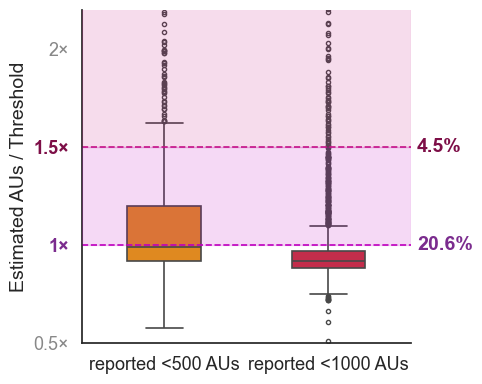

In [27]:
# --- tweak these ---
_figsize = (5, 4)
_ymin, _ymax = 0.5, 2.2
_threshold_colors = {500: 'darkorange', 1000: 'crimson'}
_color_1x = 'm'          # shading + dashed line at 1x
_color_1_5x = 'mediumvioletred'     # shading + dashed line at 1.5x
_annot_color_1x = '#7b2c8e'         # bolder purple for 20.6% text
_annot_color_1_5x = '#7d0e47'       # bolder magenta for 4.5% text
# -------------------

_threshold_ranges = {500: (460, 500), 1000: (960, 1000)}

_rows = []
for _threshold, (_lo, _hi) in _threshold_ranges.items():
    _mask = (
        facilities_swine['reported_animal_units'].between(_lo, _hi) &
        facilities_swine['swine_cat_combined_label'].isin(included_types)
    )
    _sub = facilities_swine[_mask].copy()
    _sub['ratio'] = _sub['estimated_animal_units'] / _threshold
    _sub['threshold'] = _threshold
    _rows.append(_sub)
_plot_df = pd.concat(_rows, ignore_index=True)

_label_order = sorted(_threshold_colors.keys())
_label_strings = {t: f'reported <{t} AUs' for t in _label_order}
_plot_df['threshold_label'] = _plot_df['threshold'].map(_label_strings)
_palette = {_label_strings[t]: c for t, c in sorted(_threshold_colors.items())}
_label_str_order = [_label_strings[t] for t in _label_order]

fig, ax = plt.subplots(figsize=_figsize)

sns.boxplot(
    data=_plot_df, x='threshold_label', y='ratio',
    order=_label_str_order, palette=_palette,
    width=0.45, linewidth=1.2, fliersize=3,
    ax=ax,
)

_ymax_shade = max(_plot_df['ratio'].max(), _ymax) + 0.05
ax.axhspan(1.0, 1.5, alpha=0.15, color=_color_1x, zorder=5)
ax.axhspan(1.5, _ymax_shade, alpha=0.15, color=_color_1_5x, zorder=5)
ax.axhline(1.0, color=_color_1x, linestyle='--', linewidth=1.2, zorder=2)
ax.axhline(1.5, color=_color_1_5x, linestyle='--', linewidth=1.2, zorder=2)

ax.text(1.02, 1.0, '20.6%', transform=ax.get_yaxis_transform(),
        ha='left', va='center', color=_annot_color_1x, fontweight='bold', fontsize=14, clip_on=False)
ax.text(1.02, 1.5, '4.5%', transform=ax.get_yaxis_transform(),
        ha='left', va='center', color=_annot_color_1_5x, fontweight='bold', fontsize=14, clip_on=False)

ax.tick_params(axis='both', labelsize=13)
ax.set_ylim(_ymin, _ymax)
ax.set_xlabel('')
ax.set_ylabel('Estimated AUs / Threshold', fontsize=14)

# Y-axis: add × suffix, bold + color 1× and 1.5×
_yticks = [round(v * 2) / 2 for v in [_ymin] + [0.5 * i for i in range(int(_ymin * 2), int(_ymax * 2) + 1)] if _ymin <= 0.5 * i <= _ymax]
_yticks = sorted(set(_yticks))
ax.set_yticks(_yticks)
ax.set_yticklabels([f'{t:g}×' for t in _yticks])
for tick in ax.yaxis.get_major_ticks():
    val = float(tick.label1.get_text().replace('×', ''))
    if val == 1.0:
        tick.label1.set_fontweight('bold')
        tick.label1.set_color(_annot_color_1x)
    elif val == 1.5:
        tick.label1.set_fontweight('bold')
        tick.label1.set_color(_annot_color_1_5x)
    else:
        tick.label1.set_color('#888888')

ax.spines[['top', 'right']].set_visible(False)

plt.tight_layout()
plt.savefig('output/plots/threshold_ratio_boxplots.png', dpi=300, bbox_inches='tight')
plt.show()


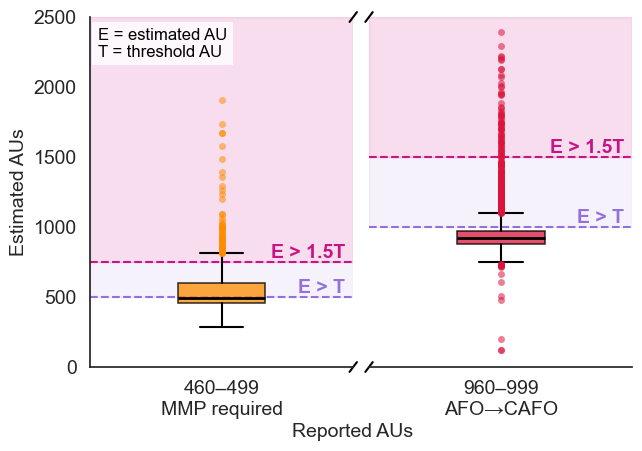

In [28]:
# Diagonal-line version: broken x-axis so boxes appear close together
# --- tweak these ---
_figsize_d = (7, 5)
_box_width_d = 50
_margin_d = 50           # AU of whitespace on each side of each box
_threshold_colors_d = {500: 'darkorange', 1000: 'crimson'}
_color_1x_d = 'mediumpurple'
_color_1_5x_d = 'mediumvioletred'
# -------------------

_threshold_ranges_d = {500: (460, 500), 1000: (960, 1000)}
_data_by_threshold_d = {}
for _t, (_lo, _hi) in _threshold_ranges_d.items():
    _mask_d = (
        facilities_swine['reported_animal_units'].between(_lo, _hi) &
        facilities_swine['swine_cat_combined_label'].isin(included_types)
    )
    _data_by_threshold_d[_t] = facilities_swine.loc[_mask_d, 'estimated_animal_units'].dropna().values

_y_start_d = 0
# _y_end_d = max(v.max() for v in _data_by_threshold_d.values()) * 1.08
_y_end_d = 2500

_half_d = _box_width_d // 2 + _margin_d  # half-width of x window around each box
_x_windows = {t: (t - _half_d, t + _half_d) for t in [500, 1000]}

fig, (ax_l, ax_r) = plt.subplots(
    1, 2, sharey=True, figsize=_figsize_d,
    gridspec_kw={'wspace': 0.06}
)

for ax, _t in zip([ax_l, ax_r], [500, 1000]):
    xs, xe = _x_windows[_t]
    # Horizontal shading at T and 1.5T for this panel
    _T = _t
    ax.axhspan(_T, 1.5 * _T, alpha=0.09, color=_color_1x_d, zorder=0)
    ax.axhspan(1.5 * _T, _y_end_d, alpha=0.14, color=_color_1_5x_d, zorder=0)
    ax.axhline(_T, color=_color_1x_d, linewidth=1.5, linestyle='--', zorder=1)
    ax.axhline(1.5 * _T, color=_color_1_5x_d, linewidth=1.5, linestyle='--', zorder=1)

    # E>T and E>1.5T annotations (both panels)
    ax.text(0.97, _T, 'E > T', transform=ax.get_yaxis_transform(),
            ha='right', va='bottom', color=_color_1x_d, fontweight='bold', fontsize=14, clip_on=True)
    ax.text(0.97, 1.5 * _T, 'E > 1.5T', transform=ax.get_yaxis_transform(),
            ha='right', va='bottom', color=_color_1_5x_d, fontweight='bold', fontsize=14, clip_on=True)

    # Boxplot
    _bp = ax.boxplot(
        [_data_by_threshold_d[_t]],
        positions=[_t],
        widths=_box_width_d,
        patch_artist=True,
        zorder=3,
        whis=1.5,
        flierprops=dict(
            marker='o', markersize=5, alpha=0.55,
            markerfacecolor=_threshold_colors_d[_t],
            markeredgewidth=0,
        ),
        medianprops=dict(color='black', linewidth=2),
        whiskerprops=dict(linewidth=1.5),
        capprops=dict(linewidth=1.5),
        boxprops=dict(linewidth=1.2),
    )
    _bp['boxes'][0].set_facecolor(_threshold_colors_d[_t])
    _bp['boxes'][0].set_alpha(0.75)
    for _flier in _bp['fliers']:
        _flier.set_zorder(5)

    ax.set_xlim(xs, xe)
    ax.set_xticks([_t])

ax_l.set_xticklabels(['460–499\nMMP required'], fontsize=11)
ax_r.set_xticklabels(['960–999\nAFO→CAFO'], fontsize=11)



# Broken-axis spine markers (diagonal cut lines at the break)
_d = 0.014
ax_l.spines['right'].set_visible(False)
ax_l.plot((1 - _d, 1 + _d), (-_d, +_d), transform=ax_l.transAxes, color='k', clip_on=False, lw=1.5)
ax_l.plot((1 - _d, 1 + _d), (1 - _d, 1 + _d), transform=ax_l.transAxes, color='k', clip_on=False, lw=1.5)

ax_r.spines['left'].set_visible(False)
ax_r.tick_params(left=False)
ax_r.plot((-_d, +_d), (-_d, +_d), transform=ax_r.transAxes, color='k', clip_on=False, lw=1.5)
ax_r.plot((-_d, +_d), (1 - _d, 1 + _d), transform=ax_r.transAxes, color='k', clip_on=False, lw=1.5)

ax_l.spines[['top']].set_visible(False)
ax_r.spines[['top', 'right']].set_visible(False)

ax_l.set_ylim(_y_start_d, _y_end_d)
ax_l.set_ylabel('Estimated AUs', fontsize=14)
ax_l.tick_params(axis='both', labelsize=14)
ax_r.tick_params(axis='x', labelsize=14)

ax_l.text(0.03, 0.97, 'E = estimated AU\nT = threshold AU',
    transform=ax_l.transAxes, ha='left', va='top',
    fontsize=12, color='black',
    bbox=dict(facecolor='white', edgecolor='none', alpha=0.8))
# Add bottom margin so 2-line tick labels + x-label don't collide
plt.subplots_adjust(bottom=0.18)
fig.text(0.5, 0.04, 'Reported AUs', ha='center', fontsize=14)

plt.savefig('output/plots/threshold_diagonal_boxplots.png', dpi=300, bbox_inches='tight')
plt.show()


/Users/eacook/eacook/cafo-iowa-public/.venv/lib/python3.12/site-packages/seaborn/axisgrid.py:123: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


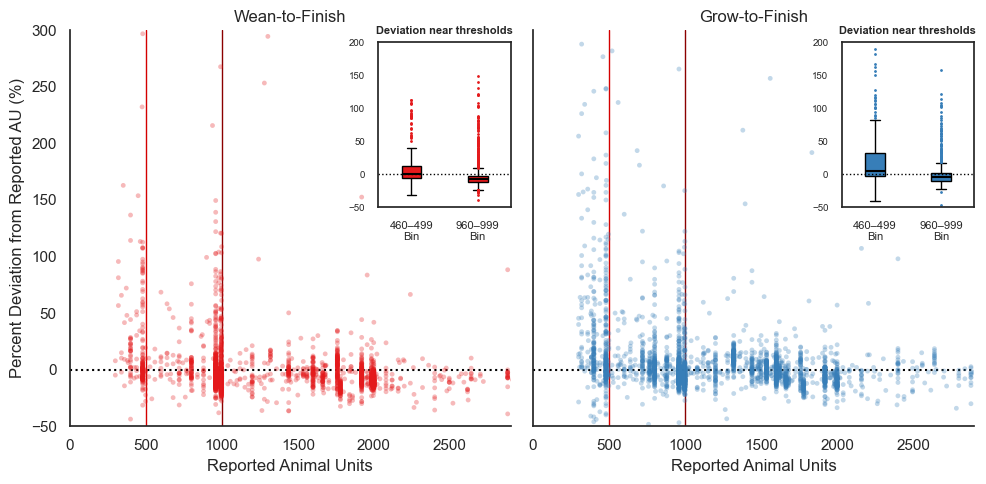

In [29]:
# Create relative deviation variable
facilities_swine["relative_deviation"] = (
    (
        facilities_swine["estimated_animal_units"]
        - facilities_swine["reported_animal_units"]
    )
    / facilities_swine["reported_animal_units"]
) * 100


au_plot_limit = 2900
uncertainty = False

# Extract hue -> color mapping
hue_order = included_types
palette = sns.color_palette(n_colors=len(hue_order))
hue_color_map = dict(zip(hue_order, palette))

# Faceted scatter plot of relative deviation vs reported AUs
g = sns.lmplot(
    data=facilities_swine[
        facilities_swine.swine_cat_combined_label.isin(included_types)
    ],
    x="reported_animal_units",
    y="relative_deviation",
    col="swine_cat_combined_label",
    hue="swine_cat_combined_label",
    col_wrap=2,
    height=5,
    scatter_kws={"alpha": 0.3, "s": 12, "edgecolor": "none", "zorder": 2},
    fit_reg=False,
    palette=palette,
)

# Optional: add vertical error bars for uncertainty (disabled here)
if uncertainty:
    for ax, name in zip(g.axes.flat, included_types):
        facet_data = facilities_swine[facilities_swine.swine_cat_combined_label == name]
        yerr = (
            np.array(
                [
                    facet_data["estimated_animal_units"]
                    - facet_data["estimated_animal_units_lower"],
                    facet_data["estimated_animal_units_upper"]
                    - facet_data["estimated_animal_units"],
                ]
            )
            / facet_data["reported_animal_units"]
        )
        ax.errorbar(
            x=facet_data["reported_animal_units"],
            y=facet_data["relative_deviation"],
            yerr=yerr,
            fmt="none",
            ecolor=hue_color_map[name],
            alpha=0.2,
            elinewidth=0.8,
            zorder=1,
        )

# Add horizontal zero-deviation line
for ax in g.axes.flat:
    ax.axhline(
        y=0,
        color="black",
        linestyle="dotted",
        zorder=0,
    )

# Add vertical regulatory thresholds (on x-axis)
for ax in g.axes.flat:
    for threshold, (label, color) in thresholds.items():
        ax.axvline(
            threshold,
            color=color,
            lw=1,
            label=f"{label} ({threshold} AUs)",
            zorder=0,
        )

# Add zoomed-in inset boxplots per facet
for ax, name in zip(g.axes.flat, included_types):
    facet_data = facilities_swine[facilities_swine.swine_cat_combined_label == name]
    zoom_data = facet_data[
        (
            (facet_data["reported_animal_units"] >= 460)
            & (facet_data["reported_animal_units"] <= 499)
        )
        | (
            (facet_data["reported_animal_units"] >= 960)
            & (facet_data["reported_animal_units"] <= 999)
        )
    ].copy()

    zoom_data["au_band"] = np.where(
        zoom_data["reported_animal_units"] < 500, "460–499\nBin", "960–999\nBin"
    )

    axins = inset_axes(
        ax,
        width="30%",
        height="41.74%",
        loc="upper right",
        bbox_to_anchor=(0, -0.03, 1, 1),
        bbox_transform=ax.transAxes,
        borderpad=0,
    )

    sns.boxplot(
        y="relative_deviation",
        x="au_band",
        data=zoom_data,
        order=["460–499\nBin", "960–999\nBin"],
        ax=axins,
        width=0.3,
        showcaps=True,
        boxprops={
            "facecolor": hue_color_map[name],
            "linewidth": 1,
            "edgecolor": "black",
        },
        whiskerprops={"linewidth": 1, "color": "black"},
        capprops={"linewidth": 1, "color": "black"},
        medianprops={"color": "black", "linewidth": 1.5},
        flierprops={
            "markerfacecolor": hue_color_map[name],
            "markeredgecolor": hue_color_map[name],
            "markersize": 1,
        },
    )

    axins.axhline(0, color="black", linewidth=1, linestyle="dotted")
    axins.set_title("Deviation near thresholds", fontsize=8, fontweight="bold")
    axins.set_xlabel("")
    axins.set_ylabel("")
    axins.tick_params(axis="x", labelsize=8)
    axins.tick_params(axis="y", labelsize=7)
    axins.set_ylim(-50, 200)  # Adjust if needed

# set limits
for ax in g.axes.flat:
    ax.set_ylim(-50, 300)
    ax.set_xlim(0, au_plot_limit)

# Final formatting
g.set_titles(col_template="{col_name}")
g.set_axis_labels("Reported Animal Units", "Percent Deviation from Reported AU (%)")
g.tight_layout()


# Save + show
plt.savefig(
    f"output/plots/relative_deviation_by_category_uncertainty{uncertainty}.png", dpi=300
)
plt.show()

<h2>Permutation Test</h2>

Number of threshold under-reporters is: 141
Number of control under-reporters is: 230
Size of Threshold Set is: 2519
Size of Control Set is: 3591
Expected Null Ratio: 1


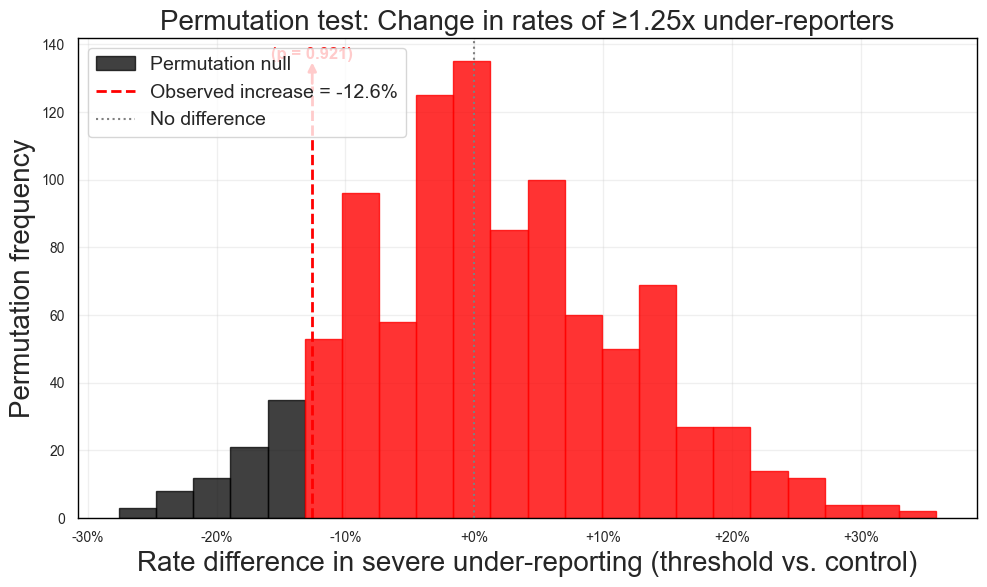

≥1.25x observed ratio: 0.874
≥1.25x observed enrichment: -12.6%
≥1.25x permutation p-value: 0.9211
Number of threshold under-reporters is: 72
Number of control under-reporters is: 119
Size of Threshold Set is: 2519
Size of Control Set is: 3591
Expected Null Ratio: 1


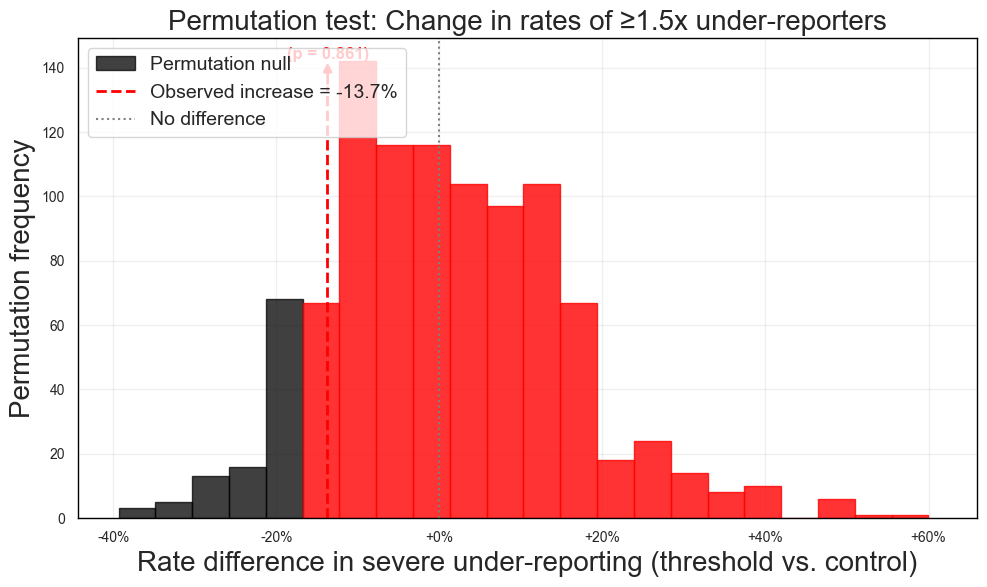

≥1.5x observed ratio: 0.863
≥1.5x observed enrichment: -13.7%
≥1.5x permutation p-value: 0.8611


In [30]:
# Permutation test
sns.set_theme(
    style="whitegrid",
    context="notebook",
    rc={
        "axes.edgecolor": "black",
        "axes.linewidth": 1,
        "grid.alpha": 0.3,
        "axes.axisbelow": True,
        "font.size": 11,
        "axes.titlesize": 12,
        "axes.labelsize": 11,
        "xtick.labelsize": 10,
        "ytick.labelsize": 10,
    },
)

np.random.seed(42)
EXCLUDE_THRESHOLD_FROM_PLACEBO = False  # set True for reviewer robustness check

type_swine = ['Wean-to-Finish', 'Grow-to-Finish']

data = facilities_swine[facilities_swine['swine_cat_combined_label'] == type_swine[0]]
x1 = data['reported_animal_units']
y1 = data['estimated_animal_units']

data2 = facilities_swine[facilities_swine['swine_cat_combined_label'] == type_swine[1]]
x2 = data2['reported_animal_units']
y2 = data2['estimated_animal_units']

x = pd.concat([x1,x2])
y = pd.concat([y1,y2])

percentages = [1.25, 1.5]

threshold_ranges = [(960, 1000)] # threshold set
control_exclude_ranges = [(460, 500), (960,1000)] # sets to exclude from control (separating)

threshold_mask = np.zeros_like(x, dtype=bool)
for lower, upper in threshold_ranges:
    threshold_mask |= (x >= lower) & (x < upper)

control_exclude_mask = np.zeros_like(x, dtype=bool)
for lower, upper in control_exclude_ranges:
    control_exclude_mask |= (x >= lower) & (x < upper)


threshold_set = y[threshold_mask]
threshold_set_reported = x[threshold_mask]

control_mask = ~control_exclude_mask
control_set = y[control_mask]
control_set_reported = x[control_mask]

for j in range(0,2):
    condition = (threshold_set >= percentages[j] * threshold_set_reported)
    threshold_bin = np.sum(condition)
    threshold_set_size = np.size(threshold_set)

    condition2 = (control_set >= percentages[j] * control_set_reported)
    control_set_size = np.size(control_set)
    control_bin = np.sum(condition2)

    print("Number of threshold under-reporters is: " + str(threshold_bin))
    print("Number of control under-reporters is: " + str(control_bin))
    
    print("Size of Threshold Set is: " + str(np.size(threshold_set)))
    print("Size of Control Set is: " + str(np.size(control_set)))

    print('Expected Null Ratio: ' + str(1))

    test_ratio = (threshold_bin / threshold_set_size) / (control_bin / control_set_size)
    observed_statistic = 100 * (test_ratio - 1)

    threshold_pairs = np.column_stack((threshold_set_reported, threshold_set))  # Shape (3, 2)
    control_pairs = np.column_stack((control_set_reported, control_set))
    permutation_test_set = np.concatenate((threshold_pairs, control_pairs))

    test_ratios = np.zeros(1000)

    for i in range(1000):
        if EXCLUDE_THRESHOLD_FROM_PLACEBO:
            # draw placebo only from control rows; threshold rows always land in complement
            pool = np.arange(threshold_set_size, permutation_test_set.shape[0])
            selected_indices = np.random.choice(pool, size=threshold_set_size, replace=False)
        else:
            selected_indices = np.random.choice(
                permutation_test_set.shape[0], size=threshold_set_size, replace=False
            )

        mask = np.zeros(permutation_test_set.shape[0], dtype=bool)
        mask[selected_indices] = True

        new_threshold_set = permutation_test_set[mask]
        new_control_set = permutation_test_set[~mask]

        new_threshold_bin = np.sum(
            new_threshold_set[:, 1] >= percentages[j] * new_threshold_set[:, 0]
        )
        new_control_bin = np.sum(
            new_control_set[:, 1] >= percentages[j] * new_control_set[:, 0]
        )

        new_ratio = (
            (new_threshold_bin / threshold_set_size)
            / (new_control_bin / control_set_size)
        )

        test_ratios[i] = new_ratio

    # Convert null distribution to percent enrichment
    permutation_statistics = 100 * (test_ratios - 1)

    # One-sided p-value: how often null enrichment >= observed enrichment?
    p_value = (1 + np.sum(permutation_statistics >= observed_statistic)) / (len(permutation_statistics) + 1)

    plt.figure(figsize=(10, 6))

    counts, bins, patches = plt.hist(
        permutation_statistics,
        bins=22,
        alpha=0.75,
        color="black",
        edgecolor="black",
        label="Permutation null"
    )

    plt.axvline(
        observed_statistic,
        color="red",
        linestyle="--",
        linewidth=2,
        ymax=0.9,
        label=f"Observed increase = {observed_statistic:+.1f}%"
    )

    # plt.text(
    #     observed_statistic - 6,
    #     plt.ylim()[1] * 0.5,
    #     f"+{observed_statistic:.1f}%",
    #     color="red",
    #     fontweight="bold",
    #     fontsize=16,
    # )

    plt.axvline(
        0,
        color="gray",
        linestyle=":",
        linewidth=1.5,
        label="No difference"
    )

    # Shade right tail
    for patch, bin_left, bin_right in zip(patches, bins[:-1], bins[1:]):
        if bin_right >= observed_statistic:
            patch.set_color("red")
            patch.set_alpha(0.8)

    # p-value annotation: arrow + bold text at top of the observed line
    _x_nudge = 0.03  # shift annotation left (-) or right (+) in data units
    _p_label = "p < 0.001" if p_value < 0.001 else f"p = {p_value:.3f}"
    _ylo, _yhi = plt.gca().get_ylim()
    _line_top = _ylo + 0.87 * (_yhi - _ylo)
    _arrow_tip = _ylo + 0.95 * (_yhi - _ylo)
    plt.gca().annotate(
        "", xy=(observed_statistic + _x_nudge, _arrow_tip), xytext=(observed_statistic + _x_nudge, _line_top),
        arrowprops=dict(arrowstyle="-|>", color="red", lw=2, mutation_scale=12, shrinkA=12.5, shrinkB=-30)
    )
    plt.gca().text(
        observed_statistic + _x_nudge, _arrow_tip, f"({_p_label})",
        ha="center", va="bottom", color="red", fontweight="bold", fontsize=12
    )

    pcts = ["≥1.25x", "≥1.5x"]

    plt.xlabel("Rate difference in severe under-reporting (threshold vs. control)", fontsize=20)
    plt.ylabel("Permutation frequency", fontsize=20)
    plt.title(f"Permutation test: Change in rates of {pcts[j]} under-reporters", fontsize=20)
    plt.legend(frameon=True, fontsize=14, loc='upper left')
    plt.grid(True, alpha=0.3)

    # Percent-formatted x-axis
    from matplotlib.ticker import FuncFormatter
    plt.gca().xaxis.set_major_formatter(FuncFormatter(lambda x, _: f"{x:+.0f}%"))
    _xlo, _xhi = plt.gca().get_xlim()
    _xright_nudge = [0, 1]  # extend right x-limit per plot [j=0, j=1], in data units
    plt.gca().set_xlim(_xlo, _xhi + _xright_nudge[j])


    plt.tight_layout()
    plt.savefig(
        f"permutation_test_0708_{percentages[j]}.png",
        dpi=300,
        bbox_inches="tight"
    )
    plt.show()

    print(f"{pcts[j]} observed ratio: {test_ratio:.3f}")
    print(f"{pcts[j]} observed enrichment: {observed_statistic:+.1f}%")
    print(f"{pcts[j]} permutation p-value: {p_value:.4f}")
    print("="*52)


## Permutation test: contiguous reported-AU window (robustness check)

The test above draws null "threshold sets" as random same-size subsets of all facilities. 
As a robustness check, we repeat the test drawing null sets as **contiguous blocks** in reported-AU space — 
facilities at adjacent positions in the sorted AU distribution, of the same size as the true threshold set. 
This asks whether the true threshold set is unusual relative to other *similarly-located* regions of the AU distribution, 
rather than relative to arbitrary random subsets.

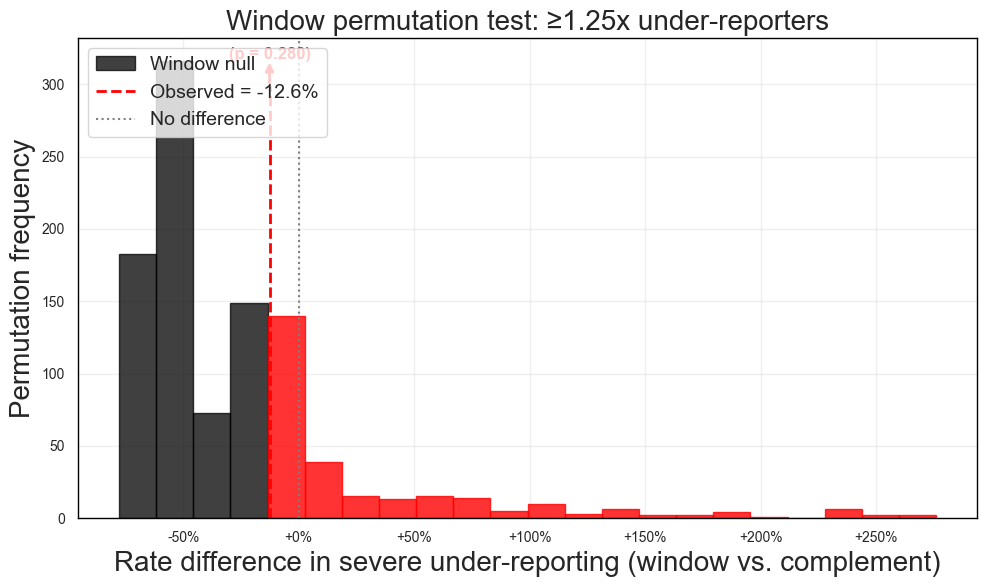

≥1.25x observed enrichment: -12.6%
≥1.25x window p-value: 0.2797 (n_valid=1000)


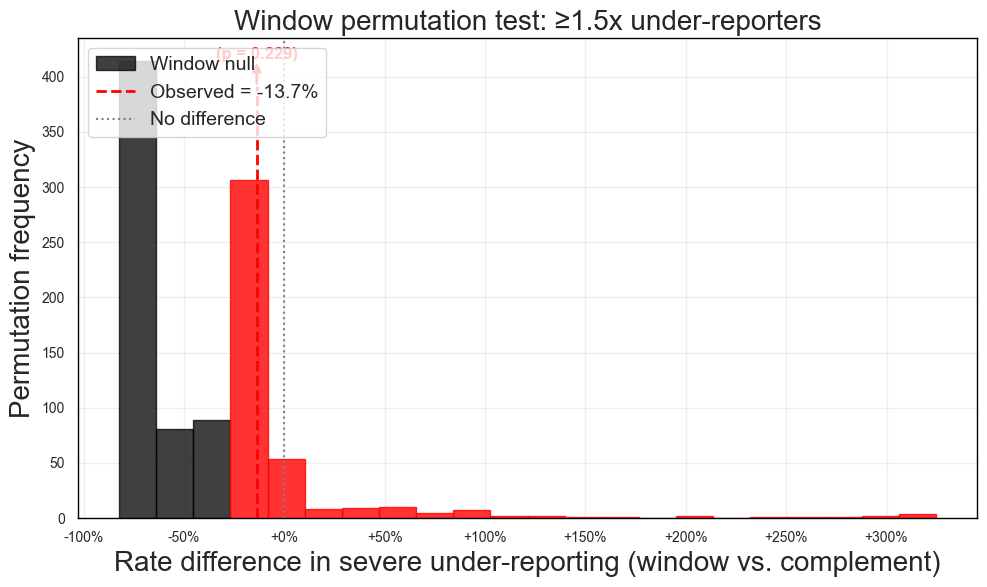

≥1.5x observed enrichment: -13.7%
≥1.5x window p-value: 0.2288 (n_valid=1000)


In [31]:
# Contiguous reported-AU window permutation test
# Robustness check: null T_b = same-size contiguous block in AU-sorted order.
# Observed statistic is identical to the main permutation test above.

EXCLUDE_TRUE_THRESHOLD = False   # if True, reject windows overlapping the real threshold ranges
MAX_ATTEMPTS = 10_000            # max redraws per iteration when exclusion is active
M_WINDOW = 1_000                 # number of Monte Carlo draws

# Sort the full paired dataset by reported AU (column 0)
_sorted_set = permutation_test_set[np.argsort(permutation_test_set[:, 0])]
_n_total     = len(_sorted_set)
_T_size      = threshold_set_size
_threshold_ranges = [(460, 500), (960, 1000)]

def _in_true_threshold(window_reported_aus):
    for lo, hi in _threshold_ranges:
        if np.any((window_reported_aus >= lo) & (window_reported_aus < hi)):
            return True
    return False


for j in range(2):
    # ---------- observed statistic (same as main test) ----------
    cond_t = threshold_set >= percentages[j] * threshold_set_reported
    cond_c = control_set   >= percentages[j] * control_set_reported
    _t_bin = np.sum(cond_t)
    _c_bin = np.sum(cond_c)
    _observed = 100 * ((_t_bin / threshold_set_size) / (_c_bin / control_set_size) - 1)

    # ---------- null distribution ----------
    _window_stats = []
    _skipped = 0

    for _i in range(M_WINDOW):
        for _attempt in range(MAX_ATTEMPTS):
            _start = np.random.randint(0, _n_total - _T_size + 1)
            _window = _sorted_set[_start : _start + _T_size]
            if not EXCLUDE_TRUE_THRESHOLD or not _in_true_threshold(_window[:, 0]):
                break
        else:
            _skipped += 1
            continue  # exhausted attempts — skip draw

        _complement = np.concatenate([_sorted_set[:_start], _sorted_set[_start + _T_size:]])
        _comp_size  = len(_complement)

        _wb = np.sum(_window[:, 1] >= percentages[j] * _window[:, 0])
        _cb = np.sum(_complement[:, 1] >= percentages[j] * _complement[:, 0])

        if _cb == 0:
            continue  # zero-denominator — skip draw

        _window_stats.append(100 * (_wb / _T_size) / (_cb / _comp_size) - 100)

    if _skipped > 0:
        print(f"Warning: {_skipped}/{M_WINDOW} draws skipped (exclusion or zero denominator).")

    _null_arr = np.array(_window_stats)
    _p_window = (1 + np.sum(_null_arr >= _observed)) / (len(_null_arr) + 1)

    # ---------- plot ----------
    fig, ax = plt.subplots(figsize=(10, 6))
    counts, bins, patches = ax.hist(
        _null_arr, bins=22, alpha=0.75, color="black", edgecolor="black",
        label="Window null"
    )
    ax.axvline(_observed, color="red", linestyle="--", linewidth=2, ymax=0.9,
               label=f"Observed = {_observed:+.1f}%")
    ax.axvline(0, color="gray", linestyle=":", linewidth=1.5, label="No difference")

    for patch, bl, br in zip(patches, bins[:-1], bins[1:]):
        if br >= _observed:
            patch.set_color("red")
            patch.set_alpha(0.8)

    _p_label = "p < 0.001" if _p_window < 0.001 else f"p = {_p_window:.3f}"
    _ylo, _yhi = ax.get_ylim()
    ax.annotate("",
        xy=(_observed, _ylo + 0.95 * (_yhi - _ylo)),
        xytext=(_observed, _ylo + 0.87 * (_yhi - _ylo)),
        arrowprops=dict(arrowstyle="-|>", color="red", lw=2, mutation_scale=12,
                        shrinkA=12.5, shrinkB=-30))
    ax.text(_observed, _ylo + 0.95 * (_yhi - _ylo), f"({_p_label})",
            ha="center", va="bottom", color="red", fontweight="bold", fontsize=12)

    from matplotlib.ticker import FuncFormatter
    ax.xaxis.set_major_formatter(FuncFormatter(lambda v, _: f"{v:+.0f}%"))
    ax.set_xlabel("Rate difference in severe under-reporting (window vs. complement)", fontsize=20)
    ax.set_ylabel("Permutation frequency", fontsize=20)
    ax.set_title(f"Window permutation test: {pcts[j]} under-reporters", fontsize=20)
    ax.legend(frameon=True, fontsize=14, loc="upper left")
    ax.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.savefig(f"window_permutation_test_{percentages[j]}.png", dpi=300, bbox_inches="tight")
    plt.show()

    print(f"{pcts[j]} observed enrichment: {_observed:+.1f}%")
    print(f"{pcts[j]} window p-value: {_p_window:.4f} (n_valid={len(_null_arr)})")


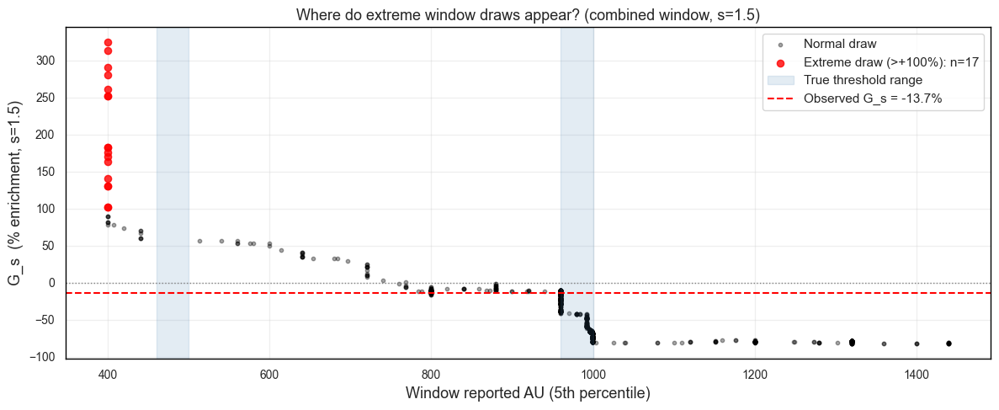

Extreme draws (>+100%): 17
  Median AU range: [400, 400]
  G_s range:       [102.1%, 324.7%]


In [32]:
# Diagnostic: which AU windows produce extreme G_s values?
# Rerun window sampling for s=1.5, recording each window's median reported AU.
np.random.seed(42)
_j_diag = 1  # s=1.5

_diag_midpoints, _diag_stats = [], []

window_percentile = 5

for _ in range(1_000):
    _start = np.random.randint(0, _n_total - _T_size + 1)
    _w    = _sorted_set[_start : _start + _T_size]
    _comp = np.concatenate([_sorted_set[:_start], _sorted_set[_start + _T_size:]])
    _wb   = np.sum(_w[:, 1] >= percentages[_j_diag] * _w[:, 0])
    _cb   = np.sum(_comp[:, 1] >= percentages[_j_diag] * _comp[:, 0])
    if _cb == 0:
        continue
    _diag_midpoints.append(np.percentile(_w[:, 0], window_percentile))
    _diag_stats.append(100 * (_wb / _T_size) / (_cb / len(_comp)) - 100)

_diag_midpoints = np.array(_diag_midpoints)
_diag_stats     = np.array(_diag_stats)

# Recompute observed enrichment for s=1.5
_cond_t = threshold_set >= percentages[_j_diag] * threshold_set_reported
_cond_c = control_set   >= percentages[_j_diag] * control_set_reported
_obs_diag = 100 * (np.sum(_cond_t) / threshold_set_size) / (np.sum(_cond_c) / control_set_size) - 100

fig, ax = plt.subplots(figsize=(12, 5))
_extreme = _diag_stats > 100
ax.scatter(_diag_midpoints[~_extreme], _diag_stats[~_extreme],
           alpha=0.35, s=10, color='black', label='Normal draw')
ax.scatter(_diag_midpoints[_extreme], _diag_stats[_extreme],
           alpha=0.8, s=35, color='red', label=f'Extreme draw (>+100%): n={_extreme.sum()}')
for _lo, _hi in [(460, 500), (960, 1000)]:
    ax.axvspan(_lo, _hi, alpha=0.15, color='steelblue',
               label='True threshold range' if _lo == 460 else '_nolegend_')
ax.axhline(_obs_diag, color='red', linestyle='--', lw=1.5, label=f'Observed G_s = {_obs_diag:+.1f}%')
ax.axhline(0, color='gray', linestyle=':', lw=1)
ax.set_xlabel(f'Window reported AU ({window_percentile}th percentile)', fontsize=13)
ax.set_ylabel('G_s  (% enrichment, s=1.5)', fontsize=13)
ax.set_title('Where do extreme window draws appear? (combined window, s=1.5)', fontsize=13)
ax.legend(fontsize=11, frameon=True)
plt.tight_layout()
plt.savefig('window_diagnostic_scatter.png', dpi=300, bbox_inches='tight')
plt.show()

# Print summary of extreme draws
print(f"Extreme draws (>+100%): {_extreme.sum()}")
print(f"  Median AU range: [{_diag_midpoints[_extreme].min():.0f}, {_diag_midpoints[_extreme].max():.0f}]")
print(f"  G_s range:       [{_diag_stats[_extreme].min():.1f}%, {_diag_stats[_extreme].max():.1f}%]")



T1: 460-499 AU: |T|=415, |C|=6110


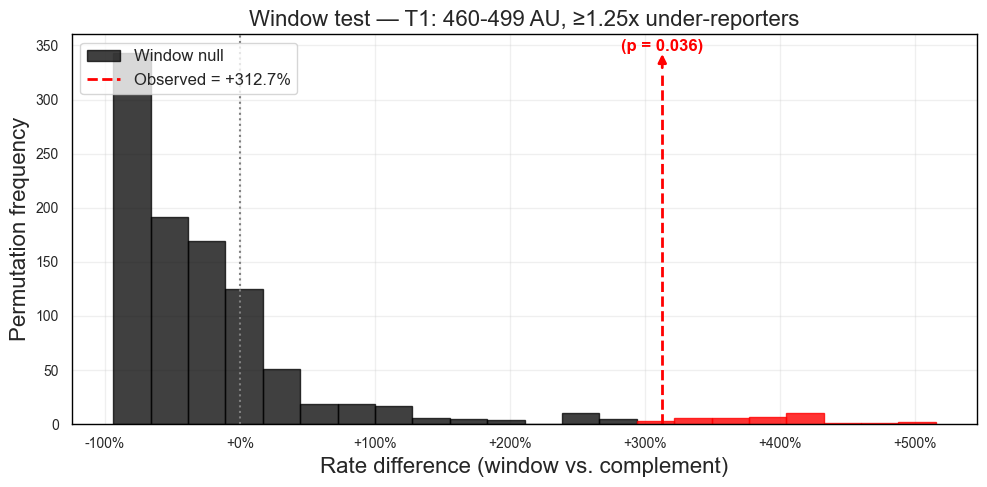

  ≥1.25x: observed=+312.7%,  p=0.0360  (n=1000)


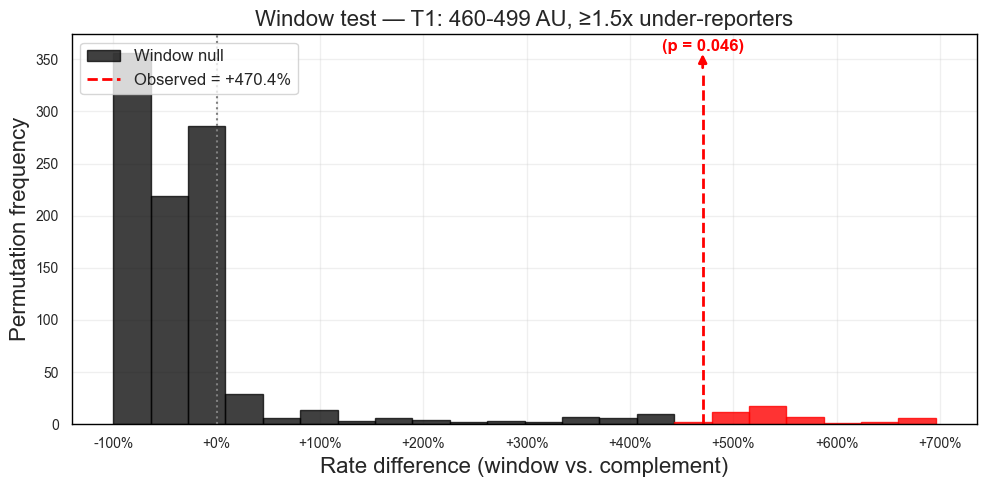

  ≥1.5x: observed=+470.4%,  p=0.0460  (n=1000)

T2: 960-999 AU: |T|=2519, |C|=4006


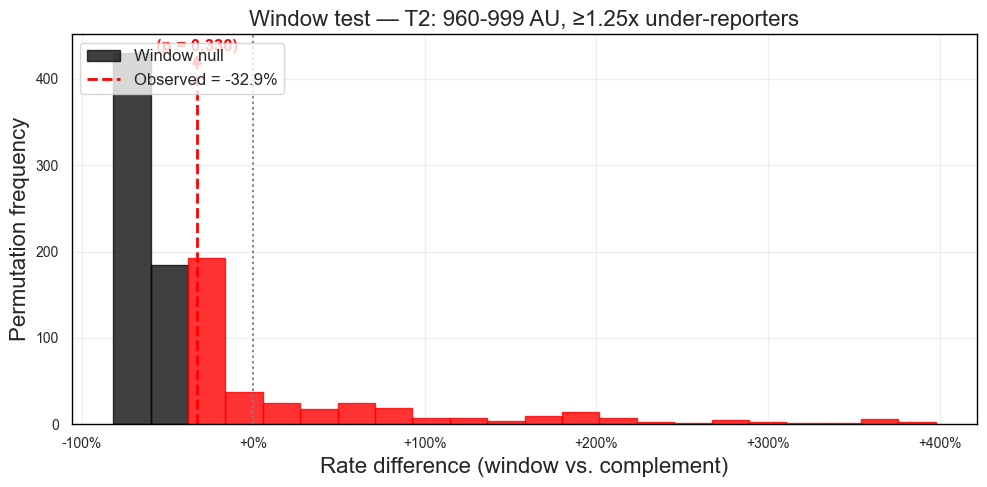

  ≥1.25x: observed=-32.9%,  p=0.3297  (n=1000)


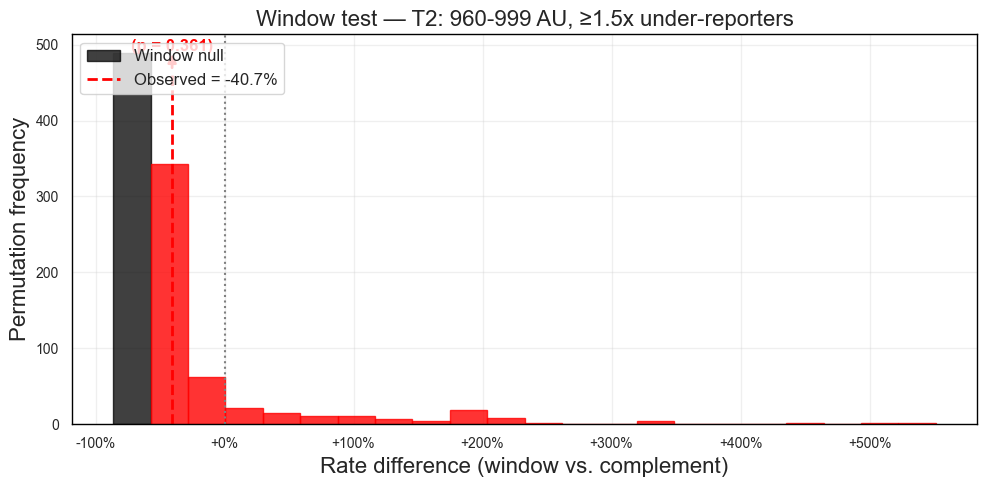

  ≥1.5x: observed=-40.7%,  p=0.3606  (n=1000)


In [33]:
# Split window test: run each threshold range independently with its own window size.
# This avoids combined windows near 950-1000 from picking up 960-999 signal.

np.random.seed(42)

_split_configs = [
    ('T1: 460-499 AU', 460, 500),
    ('T2: 960-999 AU', 960, 1000),
]

# Full dataset sorted by reported AU (independent of combined-window variables above)
_all_pairs  = np.column_stack([x.values, y.values])
_all_sorted = _all_pairs[np.argsort(_all_pairs[:, 0])]
_all_n      = len(_all_sorted)

for _name, _lo, _hi in _split_configs:
    _Tmask = (x >= _lo) & (x < _hi)
    _Tx, _Ty = x[_Tmask].values, y[_Tmask].values
    _Cx, _Cy = x[~_Tmask].values, y[~_Tmask].values
    _Tsz, _Csz = len(_Tx), len(_Cx)
    print(f"\n{_name}: |T|={_Tsz}, |C|={_Csz}")

    for j in range(2):
        _t_bin = np.sum(_Ty >= percentages[j] * _Tx)
        _c_bin = np.sum(_Cy >= percentages[j] * _Cx)
        _obs   = 100 * (_t_bin / _Tsz) / (_c_bin / _Csz) - 100

        _null = []
        for _ in range(1_000):
            _s = np.random.randint(0, _all_n - _Tsz + 1)
            _w    = _all_sorted[_s : _s + _Tsz]
            _comp = np.concatenate([_all_sorted[:_s], _all_sorted[_s + _Tsz:]])
            _wb   = np.sum(_w[:, 1] >= percentages[j] * _w[:, 0])
            _cb   = np.sum(_comp[:, 1] >= percentages[j] * _comp[:, 0])
            if _cb == 0:
                continue
            _null.append(100 * (_wb / _Tsz) / (_cb / len(_comp)) - 100)

        _null = np.array(_null)
        _p    = (1 + np.sum(_null >= _obs)) / (len(_null) + 1)

        fig, ax = plt.subplots(figsize=(10, 5))
        counts, bins, patches = ax.hist(
            _null, bins=22, alpha=0.75, color='black', edgecolor='black', label='Window null')
        ax.axvline(_obs, color='red', linestyle='--', lw=2, ymax=0.9,
                   label=f'Observed = {_obs:+.1f}%')
        ax.axvline(0, color='gray', linestyle=':', lw=1.5)
        for patch, bl, br in zip(patches, bins[:-1], bins[1:]):
            if br >= _obs:
                patch.set_color('red'); patch.set_alpha(0.8)

        _p_label = 'p < 0.001' if _p < 0.001 else f'p = {_p:.3f}'
        _ylo, _yhi = ax.get_ylim()
        ax.annotate('',
            xy=(_obs, _ylo + 0.95 * (_yhi - _ylo)),
            xytext=(_obs, _ylo + 0.87 * (_yhi - _ylo)),
            arrowprops=dict(arrowstyle='-|>', color='red', lw=2,
                            mutation_scale=12, shrinkA=12.5, shrinkB=-30))
        ax.text(_obs, _ylo + 0.95 * (_yhi - _ylo), f'({_p_label})',
                ha='center', va='bottom', color='red', fontweight='bold', fontsize=12)

        from matplotlib.ticker import FuncFormatter
        ax.xaxis.set_major_formatter(FuncFormatter(lambda v, _: f'{v:+.0f}%'))
        ax.set_xlabel('Rate difference (window vs. complement)', fontsize=16)
        ax.set_ylabel('Permutation frequency', fontsize=16)
        ax.set_title(f'Window test — {_name}, {pcts[j]} under-reporters', fontsize=16)
        ax.legend(frameon=True, fontsize=12, loc='upper left')
        ax.grid(True, alpha=0.3)
        plt.tight_layout()
        _fname = _name.split(':')[0].replace(' ', '_')
        plt.savefig(f'window_split_{_fname}_{percentages[j]}.png', dpi=300, bbox_inches='tight')
        plt.show()
        print(f'  {pcts[j]}: observed={_obs:+.1f}%,  p={_p:.4f}  (n={len(_null)})')


In [34]:
# Under-reporting rate comparison: whole dataset vs. 960-999 AU set
_T2_mask = ((x >= 460) & (x < 500)) | ((x >= 960) & (x < 1000))
_T2_rep  = x[_T2_mask].values
_T2_est  = y[_T2_mask].values
_all_rep = x.values
_all_est = y.values

print(f"{'Threshold':<12} {'Whole dataset':>16} {'960-999 set':>14}")
print('-' * 44)
for _s, _label in [(1.0, 'est >= rep'), (1.25, 'est >= 1.25x'), (1.5, 'est >= 1.5x')]:
    _r_all = np.mean(_all_est >= _s * _all_rep)
    _r_T2  = np.mean(_T2_est  >= _s * _T2_rep)
    print(f"{_label:<12}  {_r_all:>13.1%}  {_r_T2:>13.1%}")

print(f"\nn (whole): {len(_all_rep)},  n (960-999): {len(_T2_rep)}")


Threshold       Whole dataset    960-999 set
--------------------------------------------
est >= rep            33.7%          27.3%
est >= 1.25x           7.3%           8.4%
est >= 1.5x            4.1%           5.0%

n (whole): 6525,  n (960-999): 2934


In [35]:
# Verify: raw severe under-reporting rates broken out by range
# Uses x (reported AU) and y (estimated AU) from cell 33.

_T1_mask   = (x >= 460) & (x < 500)
_T2_mask   = (x >= 960) & (x < 1000)
_ctrl_mask = ~(_T1_mask | _T2_mask)

_x_T1,  _y_T1   = x[_T1_mask].values,   y[_T1_mask].values
_x_T2,  _y_T2   = x[_T2_mask].values,   y[_T2_mask].values
_x_c,   _y_c    = x[_ctrl_mask].values,  y[_ctrl_mask].values
_x_all, _y_all  = x.values,              y.values

print(f"{'':15} {'n':>6}  {'est>=rep':>10}  {'est>=1.25x':>11}  {'est>=1.5x':>10}")
print('-' * 60)
for _label, _xv, _yv in [
    ('460-499',  _x_T1,  _y_T1),
    ('960-999',  _x_T2,  _y_T2),
    ('Control',  _x_c,   _y_c),
    ('All',      _x_all, _y_all),
]:
    _r0   = np.mean(_yv >= 1.00 * _xv)
    _r125 = np.mean(_yv >= 1.25 * _xv)
    _r150 = np.mean(_yv >= 1.50 * _xv)
    print(f"{_label:15} {len(_xv):>6}  {_r0:>10.1%}  {_r125:>11.1%}  {_r150:>10.1%}")

print()
print("Enrichment vs control:")
for _label, _xv, _yv in [('460-499', _x_T1, _y_T1), ('960-999', _x_T2, _y_T2)]:
    for _s, _slab in [(1.25, '1.25x'), (1.50, '1.5x')]:
        _rt = np.mean(_yv >= _s * _xv)
        _rc = np.mean(_y_c >= _s * _x_c)
        print(f"  {_label} vs control at {_slab}: {100*(_rt/_rc - 1):+.1f}%")


                     n    est>=rep   est>=1.25x   est>=1.5x
------------------------------------------------------------
460-499            415       58.8%        25.1%       17.8%
960-999           2519       22.2%         5.6%        2.9%
Control           3591       38.9%         6.4%        3.3%
All               6525       33.7%         7.3%        4.1%

Enrichment vs control:
  460-499 vs control at 1.25x: +291.3%
  460-499 vs control at 1.5x: +438.1%
  960-999 vs control at 1.25x: -12.6%
  960-999 vs control at 1.5x: -13.7%


In [36]:
# Distribution check inside 960-999: how many are rounding artifacts at 999?
_T2_mask = (x >= 960) & (x < 1000)
_T2_x    = x[_T2_mask]

print(f"960-999 total: {len(_T2_x)}")
print(f"  of which reported exactly 999: {(_T2_x == 999).sum()}")
print(f"  of which reported exactly 998: {(_T2_x == 998).sum()}")
print(f"  of which reported 960-990:     {((_T2_x >= 960) & (_T2_x <= 990)).sum()}")
print()
print("Value counts (top 15):")
print(_T2_x.value_counts().head(15).to_string())


960-999 total: 2519
  of which reported exactly 999: 354
  of which reported exactly 998: 250
  of which reported 960-990:     1116

Value counts (top 15):
reported_animal_units
960    1046
996     537
999     354
992     250
998     250
980      41
994      11
984      10
990       5
976       5
968       3
970       2
995       1
986       1
987       1


<h2>Difference Between Estimated and Reported with Error Bars</h2>

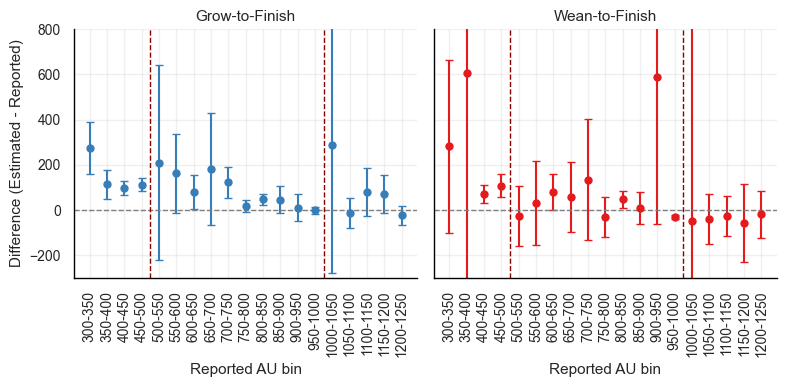

In [37]:
# Define difference
facilities_swine["diff_au"] = (
    facilities_swine["estimated_animal_units"]
    - facilities_swine["reported_animal_units"]
)

# Define bins
bins = np.arange(300, 1300, 50)
labels = [f"{b}-{b+50}" for b in bins[:-1]]
facilities_swine["reported_bin"] = pd.cut(
    facilities_swine["reported_animal_units"], bins=bins, labels=labels, right=False
)


# Summary with CI
def summarize_ci(group):
    n = len(group)
    mean = group["diff_au"].mean()
    stderr = sem(group["diff_au"], nan_policy="omit")
    ci95 = stderr * t.ppf(0.975, df=n - 1) if n > 1 else np.nan
    return pd.Series({"mean_diff": mean, "ci95": ci95})


summary_df = (
    facilities_swine.dropna(subset=["reported_bin"])
    .groupby(["swine_cat_combined_label", "reported_bin"])
    .apply(summarize_ci)
    .reset_index()
)

# Plot with colored points + error bars
g = sns.FacetGrid(
    summary_df,
    col="swine_cat_combined_label",
    col_wrap=2,
    height=4,
    sharey=True,
)

for ax, (name, subdf) in zip(
    g.axes.flat, summary_df.groupby("swine_cat_combined_label")
):
    x = np.arange(len(subdf))
    y = subdf["mean_diff"].values
    yerr = subdf["ci95"].values
    color = hue_color_map[name]

    ax.errorbar(
        x,
        y,
        yerr=yerr,
        fmt="o",
        color=color,
        capsize=3,
        label=name,
        markersize=5,
    )

    # Add horizontal line at zero
    ax.axhline(0, color="gray", linestyle="--", lw=1)

    # Add vertical lines at bins containing 500 and 1000
    threshold_bins = {"500": "500-550", "1000": "1000-1050"}
    for thresh_label in threshold_bins.values():
        if thresh_label in subdf["reported_bin"].values:
            idx = (
                subdf[subdf["reported_bin"] == thresh_label].index[0]
                - subdf.index[0]
                - 0.5
            )
            ax.axvline(x=idx, color="darkred", linestyle="--", lw=1)

    # Rotate x-axis labels
    ax.set_xticks(x)
    ax.set_xticklabels(subdf["reported_bin"], rotation=90)
    ax.set_ylabel("Estimated - Reported AUs")
    ax.set_ylim(-300, 800)

# Final formatting
g.set_titles("{col_name}")
g.set_axis_labels("Reported AU bin", "Difference (Estimated - Reported)")
g.tight_layout()

plt.show()

/var/folders/1z/l8m7f26x0s97l0n9jzw29yhh0000gn/T/ipykernel_39023/2543789807.py:46: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
/var/folders/1z/l8m7f26x0s97l0n9jzw29yhh0000gn/T/ipykernel_39023/2543789807.py:46: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.


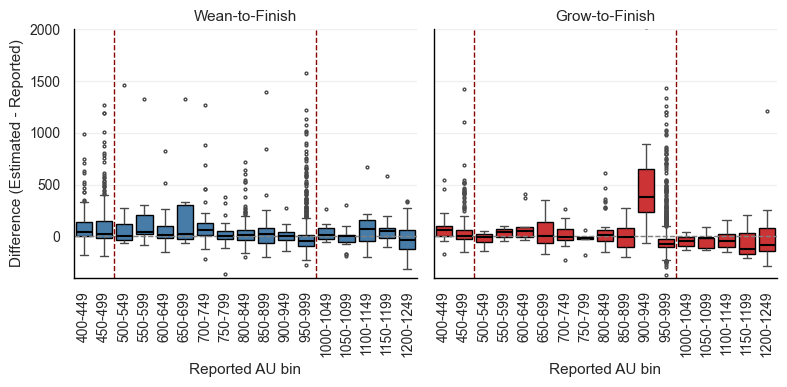

In [38]:
# Step 1: Create the difference column
facilities_swine["diff_au"] = (
    facilities_swine["estimated_animal_units"]
    - facilities_swine[
        "reported_animal_units"
    ]  # / facilities_swine["reported_animal_units"]
)

# Step 2: Bin reported animal units
bins = np.arange(400, 1300, 50)
labels = [f"{b}-{b+49}" for b in bins[:-1]]
facilities_swine["reported_bin"] = pd.cut(
    facilities_swine["reported_animal_units"], bins=bins, labels=labels, right=False
)

# Drop NA bins
plot_df = facilities_swine.dropna(subset=["reported_bin"])

# Step 4: Plot using seaborn FacetGrid and boxplot
g = sns.FacetGrid(
    plot_df,
    col="swine_cat_combined_label",
    col_wrap=2,
    height=4,
    sharey=True,
)

for ax, (name, subdf) in zip(g.axes.flat, plot_df.groupby("swine_cat_combined_label")):
    color = hue_color_map[name]

    sns.boxplot(
        data=subdf,
        x="reported_bin",
        y="diff_au",
        ax=ax,
        color=color,
        fliersize=2,
        linewidth=1,
        boxprops={"edgecolor": "black"},
        medianprops={"color": "black", "linewidth": 1.5},
        whiskerprops={"linewidth": 1},
        capprops={"linewidth": 1},
    )

    # Rotate x-axis tick labels
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

    # Horizontal line at 0
    ax.axhline(0, color="gray", linestyle="--", lw=1)

    # Vertical lines at bins including thresholds
    threshold_bins = {"500": "500-549", "1000": "1000-1049"}
    for thresh_label in threshold_bins.values():
        if thresh_label in subdf["reported_bin"].values:
            idx = (
                subdf["reported_bin"].cat.categories.tolist().index(thresh_label) - 0.5
            )
            ax.axvline(x=idx, color="darkred", linestyle="--", lw=1)

    ax.set_ylabel("Estimated - Reported AUs")
    ax.set_ylim(-400, 2000)

# Final formatting
g.set_titles("{col_name}")
g.set_axis_labels("Reported AU bin", "Difference (Estimated - Reported)")
g.tight_layout()


plt.show()

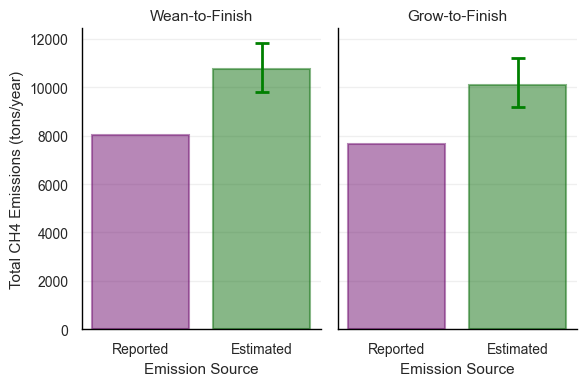

In [39]:
# Figure: CH4 emissions — facilities near threshold that are under-reporting
facilities_swine_thresholds = facilities_swine[
    (
        ((facilities_swine["reported_animal_units"] >= 460)
         & (facilities_swine["reported_animal_units"] <= 499))
        & (facilities_swine["estimated_animal_units"] > 500)
    )
    | (
        ((facilities_swine["reported_animal_units"] >= 960)
         & (facilities_swine["reported_animal_units"] <= 999))
        & (facilities_swine["estimated_animal_units"] > 1000)
    )
].copy()

# Aggregate CH4 emissions by swine category
methane_grouped = (
    facilities_swine_thresholds.groupby("swine_cat_combined_label")
    .agg({"reported_ch4_total": "sum", "estimated_ch4_total": "sum", "estimated_ch4_total_lower": "sum", "estimated_ch4_total_upper": "sum"})
    .reset_index()
)

methane_melted = methane_grouped.melt(
    id_vars="swine_cat_combined_label",
    value_vars=["reported_ch4_total", "estimated_ch4_total"],
    var_name="source",
    value_name="total_ch4",
)

methane_melted["total_ch4"] = methane_melted["total_ch4"] / 1000

methane_melted["source"] = methane_melted["source"].map(
    {"reported_ch4_total": "Reported", "estimated_ch4_total": "Estimated"}
)

methane_grouped["lower_error"] = (methane_grouped["estimated_ch4_total"] - methane_grouped["estimated_ch4_total_lower"]) / 1000
methane_grouped["upper_error"] = (methane_grouped["estimated_ch4_total_upper"] - methane_grouped["estimated_ch4_total"]) / 1000

custom_palette = {"Reported": "purple", "Estimated": "green"}

g = sns.catplot(
    data=methane_melted,
    x="source",
    y="total_ch4",
    hue="source",
    col="swine_cat_combined_label",
    kind="bar",
    palette=custom_palette,
    col_order=included_types,
    alpha=0.5,
    height=4,
    aspect=0.75,
    sharey=True,
)

for ax in g.axes.flat:
    for bar in ax.containers:
        for patch in bar:
            fc = patch.get_facecolor()
            patch.set_edgecolor(fc)
            patch.set_linewidth(1.5)

hue_order = methane_melted["source"].unique().tolist()
estimated_idx = hue_order.index("Estimated")

for ax in g.axes.flat:
    estimated_container = ax.containers[estimated_idx]
    for i, bar in enumerate(estimated_container):
        height = bar.get_height()
        lower = methane_grouped["lower_error"].iloc[i]
        upper = methane_grouped["upper_error"].iloc[i]
        ax.errorbar(
            bar.get_x() + bar.get_width() / 2,
            height,
            yerr=[[lower], [upper]],
            fmt="none",
            color="green",
            capsize=5,
            elinewidth=2,
            capthick=2,
            zorder=10,
        )

g.set_axis_labels("Emission Source", "Total CH4 Emissions (tons/year)")
g.set_titles(col_template="{col_name}")
g.set_xticklabels(rotation=0)
plt.tight_layout()
plt.savefig("output/plots/ch4_reported_vs_estimated_threshold_bunching.png", dpi=300)
plt.show()

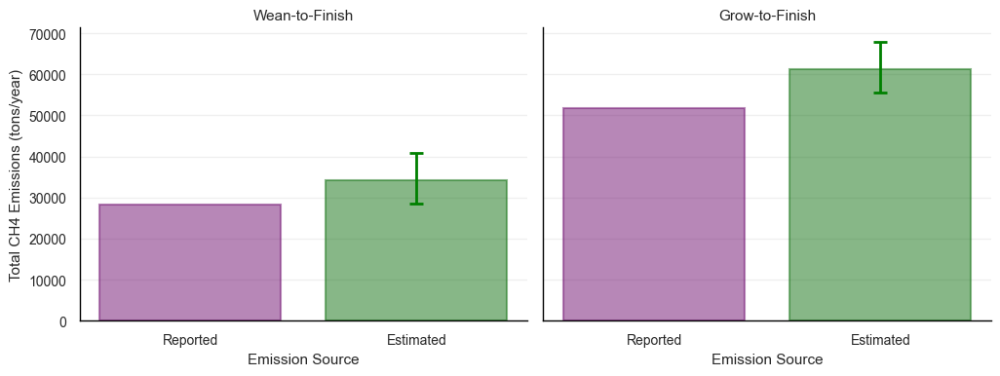

In [40]:
# Figure: CH4 emissions — all under-reporting facilities (estimated > reported)
facilities_swine_thresholds = facilities_swine[
    facilities_swine["reported_animal_units"] < facilities_swine["estimated_animal_units"]
].copy()

# Aggregate CH4 emissions by swine category
methane_grouped = (
    facilities_swine_thresholds.groupby("swine_cat_combined_label")
    .agg({"reported_ch4_total": "sum", "estimated_ch4_total": "sum", "estimated_ch4_total_lower": "sum", "estimated_ch4_total_upper": "sum"})
    .reset_index()
)

methane_melted = methane_grouped.melt(
    id_vars="swine_cat_combined_label",
    value_vars=["reported_ch4_total", "estimated_ch4_total"],
    var_name="source",
    value_name="total_ch4",
)

methane_melted["total_ch4"] = methane_melted["total_ch4"] / 1000

methane_melted["source"] = methane_melted["source"].map(
    {"reported_ch4_total": "Reported", "estimated_ch4_total": "Estimated"}
)

methane_grouped["lower_error"] = (methane_grouped["estimated_ch4_total"] - methane_grouped["estimated_ch4_total_lower"]) / 1000
methane_grouped["upper_error"] = (methane_grouped["estimated_ch4_total_upper"] - methane_grouped["estimated_ch4_total"]) / 1000

custom_palette = {"Reported": "purple", "Estimated": "green"}

g = sns.catplot(
    data=methane_melted,
    x="source",
    y="total_ch4",
    hue="source",
    col="swine_cat_combined_label",
    kind="bar",
    palette=custom_palette,
    col_order=included_types,
    alpha=0.5,
    height=4,
    aspect=1.3,
    sharey=True,
)

for ax in g.axes.flat:
    for bar in ax.containers:
        for patch in bar:
            fc = patch.get_facecolor()
            patch.set_edgecolor(fc)
            patch.set_linewidth(1.5)

hue_order = methane_melted["source"].unique().tolist()
estimated_idx = hue_order.index("Estimated")

for ax in g.axes.flat:
    estimated_container = ax.containers[estimated_idx]
    for i, bar in enumerate(estimated_container):
        height = bar.get_height()
        lower = methane_grouped["lower_error"].iloc[i]
        upper = methane_grouped["upper_error"].iloc[i]
        ax.errorbar(
            bar.get_x() + bar.get_width() / 2,
            height,
            yerr=[[lower], [upper]],
            fmt="none",
            color="green",
            capsize=5,
            elinewidth=2,
            capthick=2,
            zorder=10,
        )

g.set_axis_labels("Emission Source", "Total CH4 Emissions (tons/year)")
g.set_titles(col_template="{col_name}")
g.set_xticklabels(rotation=0)
plt.tight_layout()
plt.savefig("output/plots/ch4_reported_vs_estimated_all_underreporting.png", dpi=300)
plt.show()

In [41]:
print(methane_melted)
print(methane_melted.groupby("source").agg({"total_ch4": "sum"}))

print(methane_melted.groupby("source").agg({"total_ch4": "sum"}))
methane_melted.groupby("source").agg({"total_ch4": "sum"}).iloc[
    0
] / methane_melted.groupby("source").agg({"total_ch4": "sum"}).iloc[1]

  swine_cat_combined_label     source     total_ch4
0           Grow-to-Finish   Reported  51688.980219
1           Wean-to-Finish   Reported  28385.182272
2           Grow-to-Finish  Estimated  61296.587325
3           Wean-to-Finish  Estimated  34260.566627
              total_ch4
source                 
Estimated  95557.153952
Reported   80074.162491
              total_ch4
source                 
Estimated  95557.153952
Reported   80074.162491


total_ch4    1.193358
dtype: float64

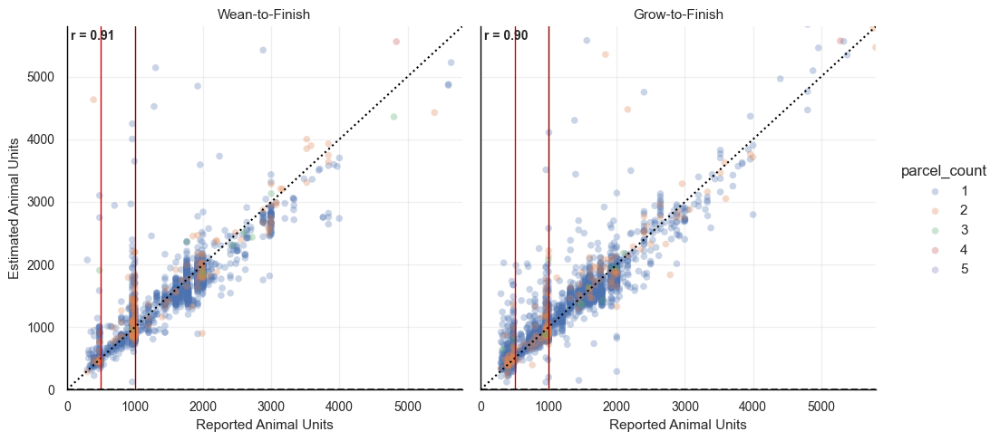

In [42]:
g = sns.lmplot(
    data=facilities_swine[
        facilities_swine.swine_cat_combined_label.isin(included_types)
    ],
    x="reported_animal_units",
    y="estimated_animal_units",
    col="swine_cat_combined_label",
    hue="parcel_count",
    col_wrap=2,
    height=5,
    scatter_kws={"alpha": 0.3, "s": 30, "edgecolor": "none"},
    fit_reg=False,
)

# Calculate and add correlation coefficients for each facet
for ax, name in zip(g.axes.flat, included_types):
    # Get data for this facet
    facet_data = facilities_swine[facilities_swine.swine_cat_combined_label == name]
    corr = facet_data["reported_animal_units"].corr(
        facet_data["estimated_animal_units"]
    )
    # Add correlation text to top left corner
    ax.text(
        0.01,
        0.99,
        f"r = {corr:.2f}",
        transform=ax.transAxes,
        fontsize=10,
        fontweight="bold",
        verticalalignment="top",
    )

# add xy line
for ax in g.axes.flat:
    ax.plot(
        [0, au_plot_limit * 2],
        [0, au_plot_limit * 2],
        color="black",
        linestyle="dotted",
    )

# add xlim
for ax in g.axes.flat:
    ax.set_xlim(0, au_plot_limit * 2)
    ax.set_ylim(0, au_plot_limit * 2)

# add vertical lines
for ax in g.axes.flat:
    for threshold, (label, color) in thresholds.items():
        ax.axvline(
            threshold,
            color=color,
            # linestyle="--",
            lw=1,
            label=f"{label} ({threshold} AUs)",
        )

for ax in g.axes.flat:
    ax.axhline(0, color="black", linestyle="--", alpha=0.7)

g.set_titles(col_template="{col_name}")

# add axis legends
g.set_axis_labels("Reported Animal Units", "Estimated Animal Units")
g.tight_layout()
plt.show()

# Figure: Reported - Estimated

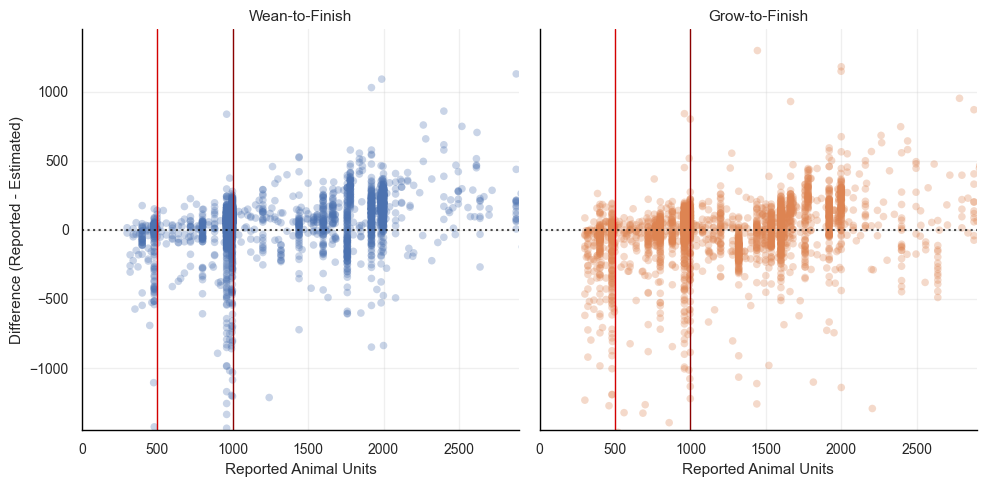

In [43]:
g = sns.lmplot(
    data=facilities_swine[
        facilities_swine.swine_cat_combined_label.isin(included_types)
    ],
    x="reported_animal_units",
    y="animal_difference",
    col="swine_cat_combined_label",
    hue="swine_cat_combined_label",
    col_wrap=2,
    height=5,
    scatter_kws={"alpha": 0.3, "s": 30, "edgecolor": "none"},
    fit_reg=False,  # This removes the trend line
)

# add xlim
for ax in g.axes.flat:
    ax.set_xlim(0, au_plot_limit)

# add vertical lines
for ax in g.axes.flat:
    for threshold, (label, color) in thresholds.items():
        ax.axvline(
            threshold,
            color=color,
            # linestyle="--",
            lw=1,
            label=f"{label} ({threshold} AUs)",
        )

for ax in g.axes.flat:
    ax.axhline(0, color="black", linestyle="dotted", alpha=0.7)
    ax.set_ylim(-au_plot_limit / 2, au_plot_limit / 2)

g.set_titles(col_template="{col_name}")

# add axis legends
g.set_axis_labels("Reported Animal Units", "Difference (Reported - Estimated)")
g.tight_layout()
plt.savefig("output/plots/animal_difference.png", dpi=300)
plt.show()

# Reported vs. Estimated, Percent Reported

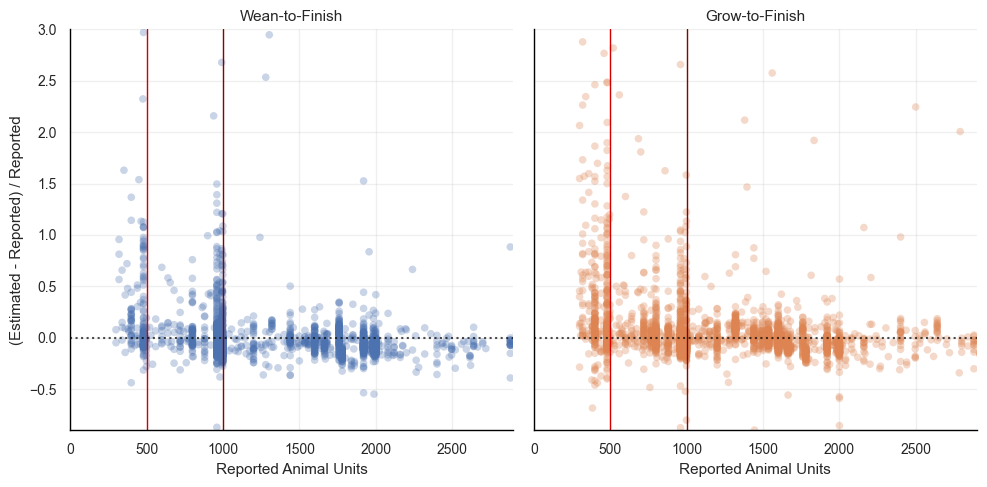

In [44]:
facilities_swine["difference_percent"] = (
    -facilities_swine["animal_difference"] / facilities_swine["reported_animal_units"]
)

g = sns.lmplot(
    data=facilities_swine[
        facilities_swine.swine_cat_combined_label.isin(included_types)
    ],
    x="reported_animal_units",
    y="difference_percent",
    col="swine_cat_combined_label",
    hue="swine_cat_combined_label",
    col_wrap=2,
    height=5,
    scatter_kws={"alpha": 0.3, "s": 30, "edgecolor": "none"},
    fit_reg=False,  # This removes the trend line
)

# add xlim
for ax in g.axes.flat:
    ax.set_xlim(0, au_plot_limit)

# add vertical lines
for ax in g.axes.flat:
    for threshold, (label, color) in thresholds.items():
        ax.axvline(
            threshold,
            color=color,
            # linestyle="--",
            lw=1,
            label=f"{label} ({threshold} AUs)",
        )

for ax in g.axes.flat:
    ax.axhline(0, color="black", linestyle="dotted", alpha=0.7)
    ax.set_ylim(-0.9, 3)

g.set_titles(col_template="{col_name}")

# add axis legends
g.set_axis_labels(
    "Reported Animal Units", "(Estimated - Reported) / Reported"
)
g.tight_layout()
plt.savefig("output/plots/animal_difference.png", dpi=300)
plt.show()

In [45]:
# Binned severe under-reporting rates by reported-AU window
_bins = [
    ('0-459',        lambda xv: (xv >= 0)    & (xv < 460)),
    ('460-499',      lambda xv: (xv >= 460)  & (xv < 500)),
    ('500-959',      lambda xv: (xv >= 500)  & (xv < 960)),
    ('960-999',      lambda xv: (xv >= 960)  & (xv < 1000)),
    ('1000-1499',    lambda xv: (xv >= 1000) & (xv < 1500)),
    ('1500-1999',    lambda xv: (xv >= 1500) & (xv < 2000)),
    ('No-threshold', lambda xv: ~((xv >= 460) & (xv < 500)) & ~((xv >= 960) & (xv < 1000))),
    ('Full sample',  lambda xv: np.ones(len(xv), dtype=bool)),
]

_df_tbl = facilities_swine[facilities_swine.swine_cat_combined_label.isin(included_types)]
_xv = _df_tbl['reported_animal_units'].values
_yv = _df_tbl['estimated_animal_units'].values

print(f"{'Bin':<15} {'n':>6}  {'>=1.25x':>9}  {'>=1.5x':>9}")
print('-' * 48)
for _name, _fn in _bins:
    _m = _fn(_xv)
    _n = int(_m.sum())
    _r125 = float(np.mean(_yv[_m] >= 1.25 * _xv[_m])) if _n > 0 else float('nan')
    _r150 = float(np.mean(_yv[_m] >= 1.50 * _xv[_m])) if _n > 0 else float('nan')
    print(f"{_name:<15} {_n:>6}  {_r125:>9.1%}  {_r150:>9.1%}")


Bin                  n    >=1.25x     >=1.5x
------------------------------------------------
0-459              259      37.8%      23.6%
460-499            415      25.1%      17.8%
500-959            532      13.0%       5.5%
960-999           2519       5.6%       2.9%
1000-1499          515       4.5%       2.5%
1500-1999         1594       1.8%       0.4%
No-threshold      3591       6.4%       3.3%
Full sample       6525       7.3%       4.1%


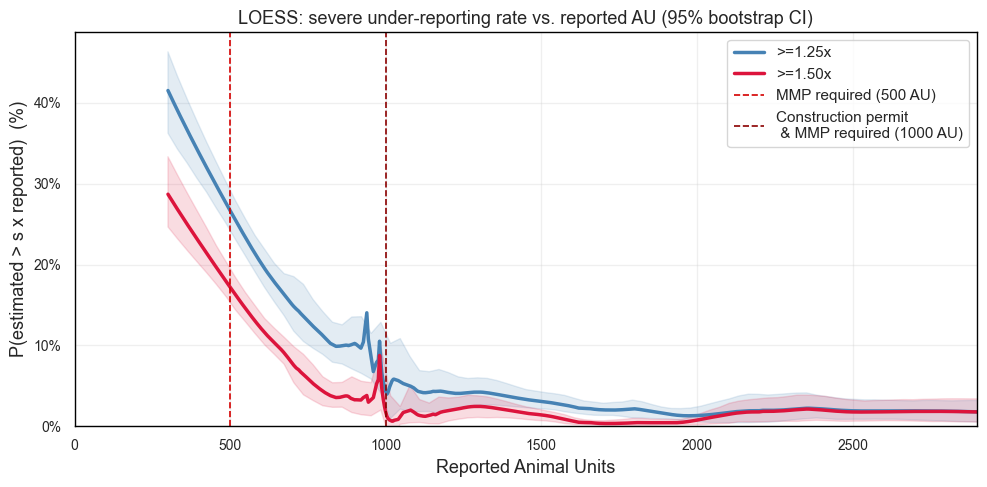

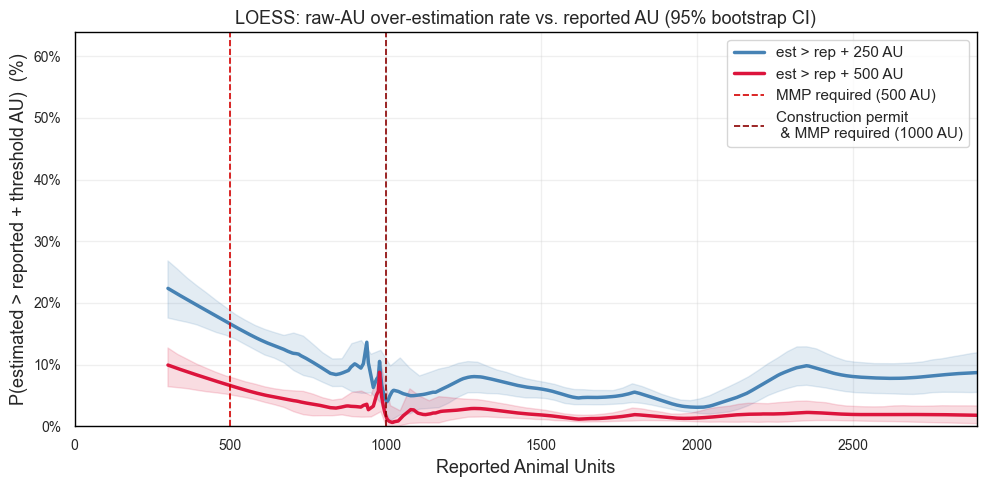

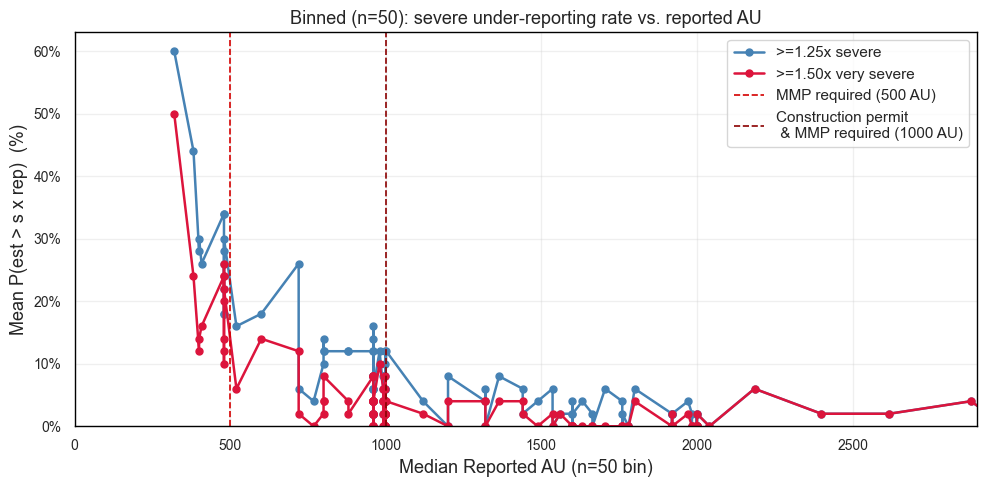

In [50]:
# LOESS: P(estimated > s * reported) vs. reported AU — with bootstrap 95% CIs
from statsmodels.nonparametric.smoothers_lowess import lowess

_frac   = 0.25
_n_boot = 200
_df_lo  = facilities_swine[facilities_swine.swine_cat_combined_label.isin(included_types)]
_x      = _df_lo['reported_animal_units'].values
_est    = _df_lo['estimated_animal_units'].values
_x_grid = np.linspace(_x.min(), _x.max(), 300)

# ── Plot A: percent-ratio LOESS + CI ──────────────────────────────────────────
fig, ax = plt.subplots(figsize=(10, 5))

for _s, _label, _color in [
    (1.25, '>=1.25x',      'steelblue'),
    (1.50, '>=1.50x', 'crimson'),
]:
    _y        = (_est >= _s * _x).astype(float)
    _smoothed = lowess(_y, _x, frac=_frac, it=0, return_sorted=True)
    ax.plot(_smoothed[:, 0], _smoothed[:, 1] * 100, color=_color, lw=2.5, label=_label)

    _boot = np.zeros((_n_boot, len(_x_grid)))
    for _b in range(_n_boot):
        _idx  = np.random.choice(len(_x), size=len(_x), replace=True)
        _smb  = lowess(_y[_idx], _x[_idx], frac=_frac, it=0, return_sorted=True)
        _boot[_b] = np.interp(_x_grid, _smb[:, 0], _smb[:, 1])
    ax.fill_between(_x_grid,
                    np.percentile(_boot, 2.5,  axis=0) * 100,
                    np.percentile(_boot, 97.5, axis=0) * 100,
                    color=_color, alpha=0.15)

for threshold, (label, color) in thresholds.items():
    ax.axvline(threshold, color=color, lw=1.2, linestyle='--', label=f'{label} ({threshold} AU)')

ax.set_xlabel('Reported Animal Units', fontsize=13)
ax.set_ylabel('P(estimated > s x reported)  (%)', fontsize=13)
ax.set_title('LOESS: severe under-reporting rate vs. reported AU (95% bootstrap CI)', fontsize=13)
ax.set_xlim(0, au_plot_limit)
ax.set_ylim(bottom=0)
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda v, _: f'{v:.0f}%'))
ax.legend(fontsize=11, frameon=True)
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('output/plots/loess_underreporting_rate.png', dpi=300, bbox_inches='tight')
plt.show()

# ── Plot B: raw-AU-threshold LOESS + CI ───────────────────────────────────────
fig, ax = plt.subplots(figsize=(10, 5))

for _thresh, _label, _color in [
    (250, 'est > rep + 250 AU', 'steelblue'),
    (500, 'est > rep + 500 AU', 'crimson'),
]:
    _y_raw = ((_est - _x) >= _thresh).astype(float)
    _sm    = lowess(_y_raw, _x, frac=_frac, it=0, return_sorted=True)
    ax.plot(_sm[:, 0], _sm[:, 1] * 100, color=_color, lw=2.5, label=_label)

    _boot = np.zeros((_n_boot, len(_x_grid)))
    for _b in range(_n_boot):
        _idx  = np.random.choice(len(_x), size=len(_x), replace=True)
        _smb  = lowess(_y_raw[_idx], _x[_idx], frac=_frac, it=0, return_sorted=True)
        _boot[_b] = np.interp(_x_grid, _smb[:, 0], _smb[:, 1])
    ax.fill_between(_x_grid,
                    np.percentile(_boot, 2.5,  axis=0) * 100,
                    np.percentile(_boot, 97.5, axis=0) * 100,
                    color=_color, alpha=0.15)

for threshold, (label, color) in thresholds.items():
    ax.axvline(threshold, color=color, lw=1.2, linestyle='--', label=f'{label} ({threshold} AU)')

ax.set_xlabel('Reported Animal Units', fontsize=13)
ax.set_ylabel('P(estimated > reported + threshold AU)  (%)', fontsize=13)
ax.set_title('LOESS: raw-AU over-estimation rate vs. reported AU (95% bootstrap CI)', fontsize=13)
ax.set_xlim(0, au_plot_limit)
ax.set_ylim(bottom=0)
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda v, _: f'{v:.0f}%'))
ax.legend(fontsize=11, frameon=True)
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('output/plots/loess_raw_au_threshold.png', dpi=300, bbox_inches='tight')
plt.show()

# ── Plot C: 200-facility binned step plot (moved from next cell) ──────────────
_df_bin = facilities_swine[
    facilities_swine.swine_cat_combined_label.isin(included_types)
].copy().sort_values('reported_animal_units').reset_index(drop=True)

_bin_size = 50
_df_bin['_bin'] = _df_bin.index // _bin_size

fig, ax = plt.subplots(figsize=(10, 5))
for _s, _label, _color in [
    (1.25, '>=1.25x severe',      'steelblue'),
    (1.50, '>=1.50x very severe', 'crimson'),
]:
    _df_bin['_ind'] = (_df_bin['estimated_animal_units'] >= _s * _df_bin['reported_animal_units']).astype(float)
    _binned = _df_bin.groupby('_bin').agg(
        med_au   =('reported_animal_units', 'median'),
        mean_rate=('_ind', 'mean'),
    )
    ax.plot(_binned['med_au'], _binned['mean_rate'] * 100,
            marker='o', ms=5, lw=1.8, color=_color, label=_label)

for threshold, (label, color) in thresholds.items():
    ax.axvline(threshold, color=color, lw=1.2, linestyle='--', label=f'{label} ({threshold} AU)')

ax.set_xlabel('Median Reported AU (n=50 bin)', fontsize=13)
ax.set_ylabel('Mean P(est > s x rep)  (%)', fontsize=13)
ax.set_title('Binned (n=50): severe under-reporting rate vs. reported AU', fontsize=13)
ax.set_xlim(0, au_plot_limit)
ax.set_ylim(bottom=0)
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda v, _: f'{v:.0f}%'))
ax.legend(fontsize=11, frameon=True)
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('output/plots/binned_underreporting_rate.png', dpi=300, bbox_inches='tight')
plt.show()


## Relationship-adjusted permutation test (accounting for the reported-AU trend)

The permutation tests above assume the threshold set and control set are label-exchangeable — that under the null, under-reporting rate wouldn't depend on where a facility sits on the reported-AU axis. The LOESS above shows that's false: severe under-reporting rate declines with reported AU across the whole range (cell 54's binned table), which is why the naive test above swings from strongly "significant" at 460-499 to null at 960-999 depending on how the control group's average AU compares to the window's.

Instead of comparing the window's raw rate to the control's raw rate, we fit a smooth curve `F(x)` to the control set only, use it to predict each threshold-window facility's expected under-reporting probability, and compare observed vs. expected. The same recipe — fit on the complement, compare observed-vs-predicted — is applied identically to the true window and to every permutation null draw, restoring exchangeability: each window is now compared to an AU-appropriate baseline rather than the global average.

All four knobs below (threshold window, curve method, exclusion setting, null regime) are meant to be tweaked by hand and re-run, rather than swept automatically.

In [63]:
# ==== Relationship-adjusted permutation test: config ====
# Tweak these by hand and re-run this + the following cells to compare configurations.

THRESHOLD_LO, THRESHOLD_HI = 960, 1000      # candidate window under test ("T2")
CURVE_METHOD = "spline"                     # "spline" or "loess"
EXCLUDE_KNOWN_THRESHOLDS = False            # also exclude 460-500 & 960-1000 from every fit
NULL_REGIME = "random"                      # "random" (regime 1) or "window" (regime 2)
OUTCOME_MODE = "indicator"                  # "indicator" (est >= s * reported, as before) or
                                             # "raw" (compare actual vs. F(x)-predicted estimated AU
                                             # directly -- one combined test, no severity levels)

M_SPLINE = 1000   # permutation draws when CURVE_METHOD == "spline"
M_LOESS = 200     # permutation draws when CURVE_METHOD == "loess" -- LOESS refits are much
                  # slower, so this matches the bootstrap iteration count already used for
                  # the LOESS CIs above rather than trying to match M_SPLINE

KNOWN_THRESHOLD_RANGES = [(460, 500), (960, 1000)]
SPLINE_DF_GRID = [3, 4, 5, 6, 8, 10, 15]

import patsy
import statsmodels.api as sm
from scipy.stats import norm

# Recomputed directly from facilities_swine (not the module-level x/y from the permutation
# test above) since a loop further down the notebook (the error-bar figure) reassigns the
# bare names `x`/`y` as its own loop variables.
_df_pop = facilities_swine[facilities_swine["swine_cat_combined_label"].isin(included_types)]
_x_all = _df_pop["reported_animal_units"].values
_y_all = _df_pop["estimated_animal_units"].values

# GLM family for the spline fit -- logistic for the 0/1 indicator, plain Gaussian (OLS,
# identity link -- no exp() in sight, so no more overflow warnings) for raw AU regression.
FAMILY = sm.families.Binomial() if OUTCOME_MODE == "indicator" else sm.families.Gaussian()


def indicator(s):
    """Severe under-reporting indicator: estimated >= s * reported."""
    return (_y_all >= s * _x_all).astype(float)


# (key, label, outcome array) triples that everything below loops over, so both modes share
# the same fitting/permutation/plotting code. Indicator mode runs one per severity level s
# (the existing 1.25x/1.5x tests); raw mode runs a single actual-vs-predicted comparison.
if OUTCOME_MODE == "indicator":
    OUTCOME_SPECS = [(s, pct_label, indicator(s)) for s, pct_label in zip(percentages, pcts)]
elif OUTCOME_MODE == "raw":
    OUTCOME_SPECS = [("raw", "Estimated AU", _y_all)]
else:
    raise ValueError(f"unknown OUTCOME_MODE: {OUTCOME_MODE}")


def get_masks(x_all, lo, hi, exclude_known):
    """Threshold/control masks for a candidate window [lo, hi)."""
    threshold_mask = (x_all >= lo) & (x_all < hi)
    exclude_mask = threshold_mask.copy()
    if exclude_known:
        for k_lo, k_hi in KNOWN_THRESHOLD_RANGES:
            exclude_mask |= (x_all >= k_lo) & (x_all < k_hi)
    return threshold_mask, ~exclude_mask


def fit_spline(x_train, y_train, df):
    X_train = patsy.dmatrix(f"cr(x, df={df})", {"x": x_train}, return_type="dataframe")
    model = sm.GLM(y_train, X_train, family=FAMILY).fit()

    def predict(x_query):
        X_query = patsy.build_design_matrices([X_train.design_info], {"x": np.asarray(x_query)})[0]
        return np.asarray(model.predict(X_query))

    return predict


def fit_loess(x_train, y_train, frac=None):
    if frac is None:
        frac = LOESS_FRAC_CONTROL
    fitted = lowess(y_train, x_train, frac=frac, it=0, return_sorted=True)

    def predict(x_query):
        return np.interp(x_query, fitted[:, 0], fitted[:, 1])

    return predict


def fit_curve(x_train, y_train, method, spline_df=None):
    if method == "spline":
        return fit_spline(x_train, y_train, spline_df)
    elif method == "loess":
        return fit_loess(x_train, y_train)
    raise ValueError(f"unknown method: {method}")


def select_spline_df(y_all_for_target, df_grid=SPLINE_DF_GRID, n_folds=5, seed=0):
    # CV always excludes BOTH known threshold ranges, regardless of EXCLUDE_KNOWN_THRESHOLDS
    # above -- a one-time modeling decision so df selection isn't tempted to chase the very
    # bump we're testing for. Scored on the GLM family's own deviance, so this works
    # unchanged for both the binary indicator (binomial deviance) and raw AU (squared error,
    # via the Gaussian family's deviance) without a separate code path.
    donut_mask = np.ones(len(_x_all), dtype=bool)
    for k_lo, k_hi in KNOWN_THRESHOLD_RANGES:
        donut_mask &= ~((_x_all >= k_lo) & (_x_all < k_hi))
    x_cv, y_cv = _x_all[donut_mask], y_all_for_target[donut_mask]

    rng_cv = np.random.RandomState(seed)
    fold_ids = rng_cv.randint(0, n_folds, size=len(x_cv))

    best_df, best_dev = None, np.inf
    for df in df_grid:
        total_dev = 0.0
        for f in range(n_folds):
            train, test = fold_ids != f, fold_ids == f
            pred = fit_spline(x_cv[train], y_cv[train], df)(x_cv[test])
            if OUTCOME_MODE == "indicator":
                pred = np.clip(pred, 1e-6, 1 - 1e-6)
            total_dev += FAMILY.deviance(y_cv[test], pred).sum()
        if total_dev < best_dev:
            best_dev, best_df = total_dev, df
    return best_df


# LOESS_FRAC_FULL is the frac used for the full-sample comparison curve (matches cell 55).
# frac is a FRACTION OF N, not an absolute AU-width -- fitting the control set (which
# excludes the threshold window, often a large chunk of the data) at the same frac gives a
# smaller ABSOLUTE local-window point count than the full-sample fit, i.e. less smoothing
# than intended. Scale it up so the control fit uses roughly the same absolute number of
# local neighbors as the full-sample fit.
LOESS_FRAC_FULL = 0.25
_, _control_mask_for_scaling = get_masks(_x_all, THRESHOLD_LO, THRESHOLD_HI, EXCLUDE_KNOWN_THRESHOLDS)
LOESS_FRAC_CONTROL = min(1.0, LOESS_FRAC_FULL * len(_x_all) / _control_mask_for_scaling.sum())
print(f"LOESS frac: full-sample={LOESS_FRAC_FULL}, control-scaled={LOESS_FRAC_CONTROL:.3f} "
      f"(n_full={len(_x_all)}, n_control={_control_mask_for_scaling.sum()})")

# Select spline df once per outcome spec, reused for every fit below (observed + every
# permutation draw, both regimes, both exclude settings).
SPLINE_DF = {}
if CURVE_METHOD == "spline":
    for _key, _label, _y_target in OUTCOME_SPECS:
        SPLINE_DF[_key] = select_spline_df(_y_target)
        print(f"{_label}: selected spline df = {SPLINE_DF[_key]}")

LOESS frac: full-sample=0.25, control-scaled=0.407 (n_full=6525, n_control=4006)


/Users/eacook/eacook/cafo-iowa-public/.venv/lib/python3.12/site-packages/statsmodels/genmod/families/links.py:198: RuntimeWarning: overflow encountered in exp


≥1.25x: selected spline df = 4
≥1.5x: selected spline df = 4


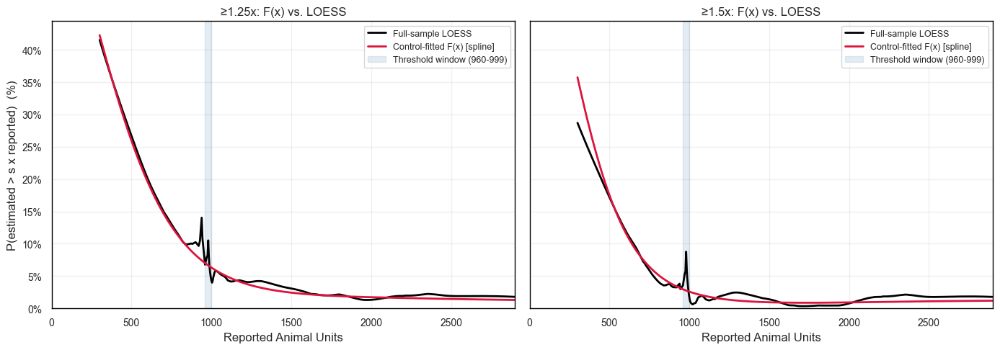

In [64]:
# Diagnostic: control-fitted F(x) vs. the full-sample LOESS, split by outcome spec.
# Use this to sanity-check the curve (and manually tune SPLINE_DF_GRID / LOESS bandwidth)
# before trusting the permutation test below.
# In raw mode, plot the RATIO F(x)/x rather than F(x) itself -- raw estimated-vs-reported is
# nearly linear (y ~ x) and visually hides exactly the deviations we care about, whereas the
# ratio centers on 1.0 and makes bumps/dips comparable to the indicator-mode curves.
fig, axes = plt.subplots(1, len(OUTCOME_SPECS), figsize=(7 * len(OUTCOME_SPECS), 5),
                          sharey=(OUTCOME_MODE == "indicator"))
axes = np.atleast_1d(axes)

_, control_mask_diag = get_masks(_x_all, THRESHOLD_LO, THRESHOLD_HI, EXCLUDE_KNOWN_THRESHOLDS)
x_grid = np.linspace(_x_all.min(), _x_all.max(), 3000)

for ax, (key, label, y_target) in zip(axes, OUTCOME_SPECS):
    full_smoothed = lowess(y_target, _x_all, frac=LOESS_FRAC_FULL, it=0, return_sorted=True)
    F_diag = fit_curve(_x_all[control_mask_diag], y_target[control_mask_diag], CURVE_METHOD,
                        spline_df=SPLINE_DF.get(key))

    if OUTCOME_MODE == "indicator":
        full_plot_x, full_plot_y = full_smoothed[:, 0], full_smoothed[:, 1] * 100
        control_plot_y = F_diag(x_grid) * 100
    else:
        full_plot_x, full_plot_y = full_smoothed[:, 0], full_smoothed[:, 1] / full_smoothed[:, 0]
        control_plot_y = F_diag(x_grid) / x_grid

    ax.plot(full_plot_x, full_plot_y, color="black", lw=2, label="Full-sample LOESS")
    ax.plot(x_grid, control_plot_y, color="crimson", lw=2,
            label=f"Control-fitted F(x) [{CURVE_METHOD}]")

    if OUTCOME_MODE == "raw":
        ax.axhline(1.0, color="gray", lw=1, linestyle=":", label="Estimated = Reported")

    ax.axvspan(THRESHOLD_LO, THRESHOLD_HI, color="steelblue", alpha=0.15,
               label=f"Threshold window ({THRESHOLD_LO}-{THRESHOLD_HI - 1})")

    ax.set_xlim(0, au_plot_limit)
    if OUTCOME_MODE == "indicator":
        ax.set_ylim(bottom=0)
        ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda v, _: f"{v:.0f}%"))
    else:
        ax.set_ylim(0, 3)  # ratio scale -- adjust by hand if the curve runs off this range
        ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda v, _: f"{v:.2f}x"))
    ax.set_xlabel("Reported Animal Units", fontsize=12)
    ax.set_title(f"{label}: F(x) vs. LOESS", fontsize=12)
    ax.legend(fontsize=9, frameon=True)
    ax.grid(True, alpha=0.3)

axes[0].set_ylabel(
    "P(estimated > s x reported)  (%)" if OUTCOME_MODE == "indicator" else "Estimated / Reported",
    fontsize=12
)
plt.tight_layout()
plt.savefig(f"output/plots/adjusted_test_curve_diagnostic_{OUTCOME_MODE}.png", dpi=300, bbox_inches="tight")
plt.show()

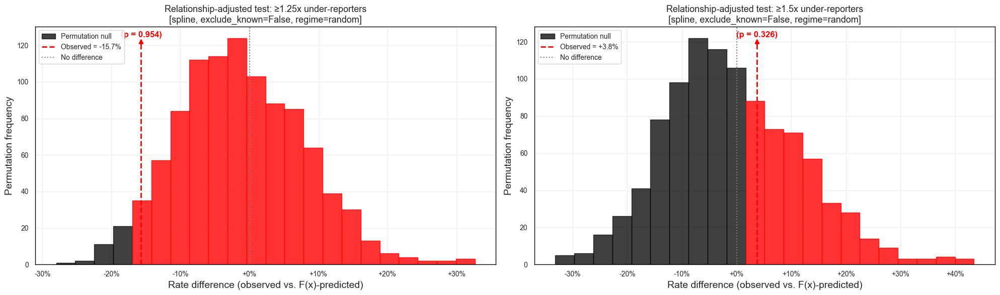

≥1.25x: observed=-15.7%  (O=141.0, E=167.2)  permutation p=0.9540  (M=1000, regime=random)
≥1.5x: observed=+3.8%  (O=72.0, E=69.4)  permutation p=0.3257  (M=1000, regime=random)


In [65]:
# Relationship-adjusted permutation test: observed statistic + permutation null.
# Same visual/statistical conventions as the permutation tests above (Monte Carlo p-value
# (1 + sum) / (M + 1), black/red histogram styling). O and E are always SUMS -- for
# OUTCOME_MODE == "indicator" that's sum of the 0/1 severe-under-reporting indicator (as
# before); for OUTCOME_MODE == "raw" it's the sum of actual vs. F(x)-predicted estimated AU.
# The statistic itself, 100 * (O/E - 1), is identical either way.
rng = np.random.RandomState(42)
M = M_SPLINE if CURVE_METHOD == "spline" else M_LOESS

threshold_mask, control_mask = get_masks(_x_all, THRESHOLD_LO, THRESHOLD_HI, EXCLUDE_KNOWN_THRESHOLDS)
threshold_size = int(threshold_mask.sum())

_order = np.argsort(_x_all)
_x_sorted, _n_total = _x_all[_order], len(_x_all)

F_obs_by_key = {}
results = {}

fig, axes = plt.subplots(1, len(OUTCOME_SPECS), figsize=(10 * len(OUTCOME_SPECS), 6))
axes = np.atleast_1d(axes)
_title_suffix = "under-reporters" if OUTCOME_MODE == "indicator" else "vs. predicted"

for ax, (key, label, y_target) in zip(axes, OUTCOME_SPECS):
    y_sorted = y_target[_order]
    spline_df = SPLINE_DF.get(key)

    # ---- observed statistic ----
    F_obs = fit_curve(_x_all[control_mask], y_target[control_mask], CURVE_METHOD, spline_df=spline_df)
    F_obs_by_key[key] = F_obs
    O = y_target[threshold_mask].sum()
    E = F_obs(_x_all[threshold_mask]).sum()
    observed_statistic = 100 * (O / E - 1)

    # ---- null distribution ----
    null_stats = np.zeros(M)
    for i in range(M):
        if NULL_REGIME == "random":
            idx = rng.choice(_n_total, size=threshold_size, replace=False)
            draw_mask = np.zeros(_n_total, dtype=bool)
            draw_mask[idx] = True
            ctrl_mask = ~draw_mask
            if EXCLUDE_KNOWN_THRESHOLDS:
                for k_lo, k_hi in KNOWN_THRESHOLD_RANGES:
                    ctrl_mask &= ~((_x_all >= k_lo) & (_x_all < k_hi))
            win_x, win_y = _x_all[draw_mask], y_target[draw_mask]
            ctrl_x, ctrl_y = _x_all[ctrl_mask], y_target[ctrl_mask]
        elif NULL_REGIME == "window":
            start = rng.randint(0, _n_total - threshold_size + 1)
            win_x = _x_sorted[start:start + threshold_size]
            win_y = y_sorted[start:start + threshold_size]
            ctrl_x = np.concatenate([_x_sorted[:start], _x_sorted[start + threshold_size:]])
            ctrl_y = np.concatenate([y_sorted[:start], y_sorted[start + threshold_size:]])
            if EXCLUDE_KNOWN_THRESHOLDS:
                keep = np.ones(len(ctrl_x), dtype=bool)
                for k_lo, k_hi in KNOWN_THRESHOLD_RANGES:
                    keep &= ~((ctrl_x >= k_lo) & (ctrl_x < k_hi))
                ctrl_x, ctrl_y = ctrl_x[keep], ctrl_y[keep]
        else:
            raise ValueError(f"unknown NULL_REGIME: {NULL_REGIME}")

        F_null = fit_curve(ctrl_x, ctrl_y, CURVE_METHOD, spline_df=spline_df)
        O_n = win_y.sum()
        E_n = F_null(win_x).sum()
        null_stats[i] = 100 * (O_n / E_n - 1)

    p_value = (1 + np.sum(null_stats >= observed_statistic)) / (M + 1)
    results[key] = dict(observed=observed_statistic, p_value=p_value, null=null_stats, O=O, E=E)

    # ---- plot ----
    counts, bins, patches = ax.hist(null_stats, bins=22, alpha=0.75, color="black",
                                     edgecolor="black", label="Permutation null")
    ax.axvline(observed_statistic, color="red", linestyle="--", linewidth=2, ymax=0.9,
               label=f"Observed = {observed_statistic:+.1f}%")
    ax.axvline(0, color="gray", linestyle=":", linewidth=1.5, label="No difference")

    for patch, bl, br in zip(patches, bins[:-1], bins[1:]):
        if br >= observed_statistic:
            patch.set_color("red")
            patch.set_alpha(0.8)

    p_label = "p < 0.001" if p_value < 0.001 else f"p = {p_value:.3f}"
    ylo, yhi = ax.get_ylim()
    ax.annotate("", xy=(observed_statistic, ylo + 0.95 * (yhi - ylo)),
                xytext=(observed_statistic, ylo + 0.87 * (yhi - ylo)),
                arrowprops=dict(arrowstyle="-|>", color="red", lw=2, mutation_scale=12,
                                 shrinkA=12.5, shrinkB=-30))
    ax.text(observed_statistic, ylo + 0.95 * (yhi - ylo), f"({p_label})",
            ha="center", va="bottom", color="red", fontweight="bold", fontsize=12)

    from matplotlib.ticker import FuncFormatter
    ax.xaxis.set_major_formatter(FuncFormatter(lambda v, _: f"{v:+.0f}%"))
    ax.set_xlabel("Rate difference (observed vs. F(x)-predicted)", fontsize=14)
    ax.set_ylabel("Permutation frequency", fontsize=14)
    ax.set_title(
        f"Relationship-adjusted test: {label} {_title_suffix}\n"
        f"[{CURVE_METHOD}, exclude_known={EXCLUDE_KNOWN_THRESHOLDS}, regime={NULL_REGIME}]",
        fontsize=13
    )
    ax.legend(frameon=True, fontsize=10, loc="upper left")
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(f"output/plots/adjusted_permutation_test_{THRESHOLD_LO}_{THRESHOLD_HI}_{OUTCOME_MODE}.png",
            dpi=300, bbox_inches="tight")
plt.show()

for key, label, _ in OUTCOME_SPECS:
    r = results[key]
    print(f"{label}: observed={r['observed']:+.1f}%  (O={r['O']:.1f}, E={r['E']:.1f})  "
          f"permutation p={r['p_value']:.4f}  (M={M}, regime={NULL_REGIME})")

In [66]:
# Poisson-binomial (SIR-style) analytic check, using the same observed F(x) fit above.
# Only meaningful for OUTCOME_MODE == "indicator" (a sum of independent Bernoulli trials) --
# skipped for "raw" mode, where this variance model doesn't apply.
# NOTE: even in indicator mode, this assumes F is exactly correct and that facility outcomes
# are independent conditional on reported AU -- it ignores curve-estimation noise (which the
# permutation null above captures) and any correlation across facilities (e.g. shared
# ownership). Treat it as a fast cross-check, not a replacement for the permutation p-value.

if OUTCOME_MODE != "indicator":
    print(f"OUTCOME_MODE = {OUTCOME_MODE!r} -- Poisson-binomial check only applies to the "
          f"binary-indicator outcome, skipped.")
else:
    print(f"{'s':>6}  {'z':>7}  {'analytic p':>11}  {'permutation p':>14}")
    for key, label, _ in OUTCOME_SPECS:
        r = results[key]
        p_hat = F_obs_by_key[key](_x_all[threshold_mask])
        z = (r["O"] - r["E"]) / np.sqrt(np.sum(p_hat * (1 - p_hat)))
        p_analytic = 1 - norm.cdf(z)
        print(f"{key:>6}  {z:>7.2f}  {p_analytic:>11.4f}  {r['p_value']:>14.4f}")

     s        z   analytic p   permutation p
  1.25    -2.10       0.9822          0.9540
   1.5     0.32       0.3753          0.3257


In [69]:
# Diagnostic: break the threshold window down by exact reported AU value.
# Large blocks of facilities reporting the identical AU (heaping / rounding behavior) get
# pooled together in the aggregate O/E test above -- this checks whether an excess is
# concentrated in a subset of those values rather than spread evenly across the window.
MIN_COUNT_TO_SHOW = 5  # values with fewer facilities than this are pooled into "(other)"

print(f"Threshold window: {THRESHOLD_LO}-{THRESHOLD_HI - 1}  (curve={CURVE_METHOD}, "
      f"outcome={OUTCOME_MODE}, exclude_known={EXCLUDE_KNOWN_THRESHOLDS})\n")

_window_values = _x_all[threshold_mask]
_unique_vals, _counts = np.unique(_window_values, return_counts=True)
_shown = _counts >= MIN_COUNT_TO_SHOW
_shown_order = np.argsort(-_counts[_shown])

for key, label, y_target in OUTCOME_SPECS:
    F_obs = F_obs_by_key[key]

    print(f"--- {label} ---")
    print(f"{'AU value':>10}  {'n':>6}  {'O':>10} {'O/n':>10}  {'E':>10}  {'O/E':>7}  {'enrichment':>11}")

    for val, n_val in zip(_unique_vals[_shown][_shown_order], _counts[_shown][_shown_order]):
        val_mask = threshold_mask & (_x_all == val)
        O_val = y_target[val_mask].sum()
        E_val = n_val * F_obs(np.array([val]))[0]
        ratio = O_val / E_val if E_val > 0 else np.nan
        enrich = 100 * (ratio - 1) if E_val > 0 else np.nan
        print(f"{val:>10.0f}  {n_val:>6}  {O_val:>10.1f} {O_val/n_val:>10.3f}  {E_val:>10.1f}  {ratio:>7.2f}  {enrich:>+10.1f}%")

    if (~_shown).any():
        other_mask = threshold_mask & np.isin(_x_all, _unique_vals[~_shown])
        n_other = int(other_mask.sum())
        O_other = y_target[other_mask].sum()
        E_other = F_obs(_x_all[other_mask]).sum()
        ratio_other = O_other / E_other if E_other > 0 else np.nan
        enrich_other = 100 * (ratio_other - 1) if E_other > 0 else np.nan
        print(f"{'(other)':>10}  {n_other:>6}  {O_other:>10.1f}  {E_other:>10.1f}  {ratio_other:>7.2f}  "
              f"{enrich_other:>+10.1f}%  [{int((~_shown).sum())} distinct values, n<{MIN_COUNT_TO_SHOW} each]")
    print()

Threshold window: 960-999  (curve=spline, outcome=indicator, exclude_known=False)

--- ≥1.25x ---
  AU value       n           O        O/n           E      O/E   enrichment
       960    1046        70.0      0.067        73.3     0.95        -4.5%
       996     537        15.0      0.028        34.2     0.44       -56.2%
       999     354        26.0      0.073        22.4     1.16       +16.2%
       992     250        12.0      0.048        16.1     0.75       -25.4%
       998     250         8.0      0.032        15.8     0.50       -49.5%
       980      41         6.0      0.146         2.7     2.20      +120.2%
       994      11         2.0      0.182         0.7     2.84      +183.9%
       984      10         1.0      0.100         0.7     1.52       +52.1%
       976       5         0.0      0.000         0.3     0.00      -100.0%
       990       5         1.0      0.200         0.3     3.09      +209.1%
   (other)      10         0.0         0.7     0.00      -100.0%  

In [163]:
# Diagnostic: are a few outlier facilities driving the raw-AU curve's shape in a given range?
# Continuous regression (OUTCOME_MODE == "raw") is sensitive to the MAGNITUDE of estimated
# AU -- a handful of facilities with very large estimated AU can pull the local curve/mean
# upward even though the binary indicator caps their contribution at exactly 1 regardless of
# how far over the threshold they are. This checks whether that's what's happening in a
# given AU range (default: the 1000-1500 "hump" range) by comparing how much the continuous
# mean vs. the indicator rate move when the top-K largest estimated-AU facilities are
# dropped. If the continuous mean swings hard while the indicator barely moves, the hump is
# outlier-driven, not a broad-based pattern across the whole range.
OUTLIER_CHECK_LO, OUTLIER_CHECK_HI = 1000, 1500
OUTLIER_CHECK_S = 1.25  # severity level used for the indicator-rate comparison below

_chk_mask = (_x_all >= OUTLIER_CHECK_LO) & (_x_all < OUTLIER_CHECK_HI)
_chk_reported = _x_all[_chk_mask]
_chk_estimated = _y_all[_chk_mask]
_chk_ratio = _chk_estimated / _chk_reported
_chk_order = np.argsort(-_chk_estimated)

print(f"Range {OUTLIER_CHECK_LO}-{OUTLIER_CHECK_HI - 1}: n={int(_chk_mask.sum())}")
print(f"  mean(estimated)   = {_chk_estimated.mean():.1f}")
print(f"  median(estimated) = {np.median(_chk_estimated):.1f}")
print(f"  max(estimated)    = {_chk_estimated.max():.1f}  "
      f"(max/median ratio = {_chk_estimated.max() / np.median(_chk_estimated):.2f})")
print()

print("Top 15 facilities by estimated AU in this range:")
print(f"{'reported':>10}  {'estimated':>10}  {'ratio':>7}")
for i in _chk_order[:15]:
    print(f"{_chk_reported[i]:>10.0f}  {_chk_estimated[i]:>10.0f}  {_chk_ratio[i]:>7.2f}")
print()

print("Sensitivity to dropping the top-K largest estimated-AU facilities:")
print(f"{'drop top':>9}  {'mean(estimated)':>16}  {'indicator rate @ ' + str(OUTLIER_CHECK_S) + 'x':>22}")
for k in [0, 1, 3, 5, 10, 20]:
    keep = np.ones(len(_chk_estimated), dtype=bool)
    keep[_chk_order[:k]] = False
    _mean_est = _chk_estimated[keep].mean()
    _rate_ind = (_chk_estimated[keep] >= OUTLIER_CHECK_S * _chk_reported[keep]).mean()
    print(f"{k:>9}  {_mean_est:>16.1f}  {_rate_ind:>22.3f}")

Range 1000-1499: n=515
  mean(estimated)   = 1384.8
  median(estimated) = 1400.4
  max(estimated)    = 5142.4  (max/median ratio = 3.67)

Top 15 facilities by estimated AU in this range:
  reported   estimated    ratio
      1303        5142     3.95
      1280        4524     3.53
      1380        4301     3.12
      1004        4108     4.09
      1395        3440     2.47
      1440        2700     1.87
      1440        2552     1.77
      1242        2455     1.98
      1320        2386     1.81
      1320        2231     1.69
      1440        2163     1.50
      1280        2084     1.63
      1400        1949     1.39
      1488        1874     1.26
      1386        1868     1.35

Sensitivity to dropping the top-K largest estimated-AU facilities:
 drop top   mean(estimated)  indicator rate @ 1.25x
        0            1384.8                   0.045
        1            1377.5                   0.043
        3            1365.6                   0.039
        5            1356

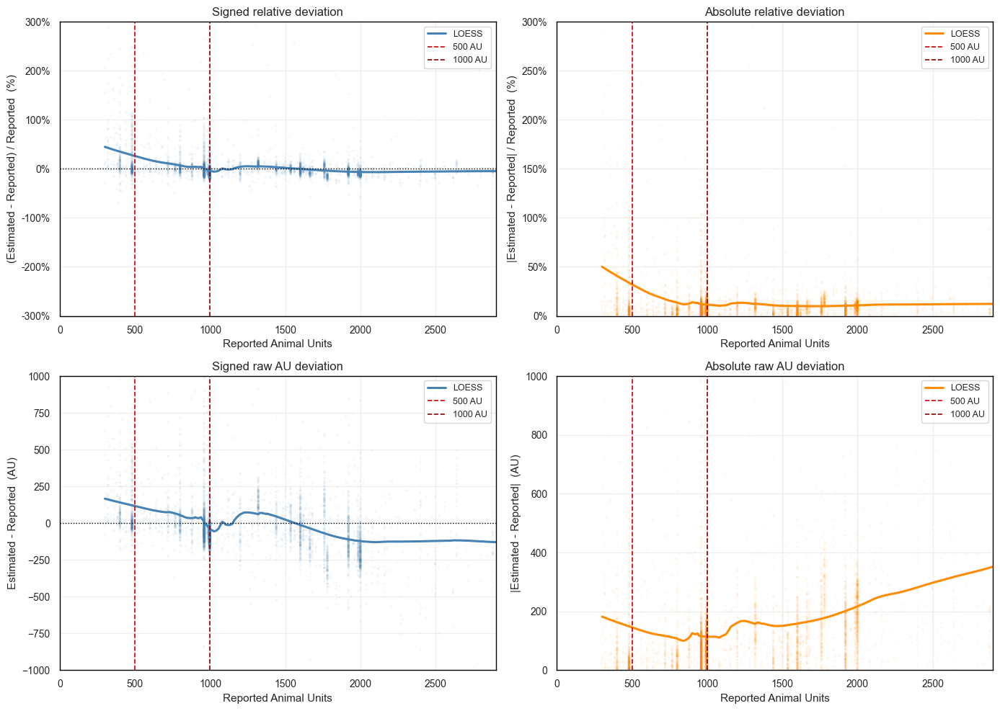

In [45]:
# 2x2 deviation panel: signed/absolute x percent/raw-AU deviation vs. reported AU
from statsmodels.nonparametric.smoothers_lowess import lowess

_frac = 0.4

_df_p = facilities_swine[
    facilities_swine.swine_cat_combined_label.isin(included_types)
].copy().sort_values('reported_animal_units').reset_index(drop=True)

_xp    = _df_p['reported_animal_units'].values
_estp  = _df_p['estimated_animal_units'].values
_dev_r = (_estp - _xp) / _xp          # signed relative
_abs_r = np.abs(_dev_r)               # absolute relative
_dev_a = _estp - _xp                  # signed raw AU
_abs_a = np.abs(_dev_a)               # absolute raw AU

fig, axes = plt.subplots(2, 2, figsize=(14, 10))

_panels = [
    (axes[0, 0], _dev_r * 100, 'steelblue',  '(Estimated - Reported) / Reported  (%)',
     'Signed relative deviation', (-300, 300), True),
    (axes[0, 1], _abs_r * 100, 'darkorange',  '|Estimated - Reported| / Reported  (%)',
     'Absolute relative deviation', (0, 300), True),
    (axes[1, 0], _dev_a,       'steelblue',  'Estimated - Reported  (AU)',
     'Signed raw AU deviation', (-1000, 1000), False),
    (axes[1, 1], _abs_a,       'darkorange',  '|Estimated - Reported|  (AU)',
     'Absolute raw AU deviation', (0, 1000), False),
]

for ax, _y, _color, _ylabel, _title, _ylim, _pct in _panels:
    ax.scatter(_xp, _y, alpha=0.05, s=6, color=_color, edgecolors='none')
    _sm = lowess(_y, _xp, frac=_frac, it=0, return_sorted=True)
    ax.plot(_sm[:, 0], _sm[:, 1], color=_color, lw=2.2, label='LOESS')
    if _ylim[0] < 0:
        ax.axhline(0, color='black', linestyle=':', lw=1)
    for threshold, (label, color) in thresholds.items():
        ax.axvline(threshold, color=color, lw=1.2, linestyle='--', label=f'{threshold} AU')
    ax.set_xlim(0, au_plot_limit)
    ax.set_ylim(*_ylim)
    ax.set_xlabel('Reported Animal Units', fontsize=11)
    ax.set_ylabel(_ylabel, fontsize=11)
    ax.set_title(_title, fontsize=12)
    if _pct:
        ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda v, _: f'{v:.0f}%'))
    ax.legend(fontsize=9, frameon=True, loc='upper right')
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('output/plots/deviation_2x2.png', dpi=300, bbox_inches='tight')
plt.show()


# Figure: model fit, reported vs. predicted animal units

(array([6.413e+03, 8.500e+01, 9.000e+00, 1.100e+01, 3.000e+00, 1.000e+00,
        2.000e+00, 0.000e+00, 0.000e+00, 1.000e+00]),
 array([2.85202338e-02, 8.28550750e+02, 1.65707298e+03, 2.48559521e+03,
        3.31411744e+03, 4.14263967e+03, 4.97116190e+03, 5.79968413e+03,
        6.62820636e+03, 7.45672859e+03, 8.28525082e+03]),
 <BarContainer object of 10 artists>)

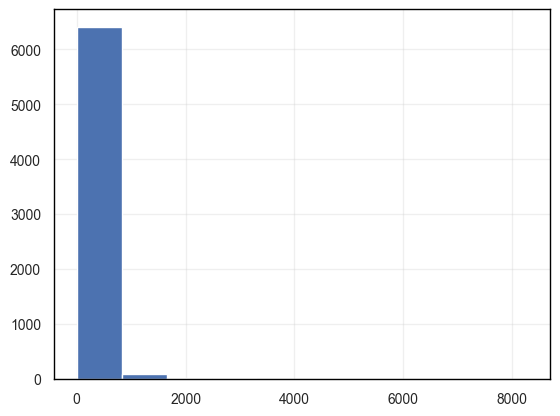

In [46]:
plt.hist(_y)

In [48]:
# specify model
EPSILON = 1e-6

# Apply log transformation with small constant
facilities_swine["log_reported_animal_units"] = np.log(
    facilities_swine["reported_animal_units"] + EPSILON
)
facilities_swine["log_estimated_animal_units"] = np.log(
    facilities_swine["estimated_animal_units"] + EPSILON
)
facilities_swine["log_barn_area_sqm"] = np.log(
    facilities_swine["barn_area_sqm"] + EPSILON
)

# Define exclusion ranges as a list of tuples (lower_bound, upper_bound)
exclusion_aus = [(400, 500), (900, 1000), (1900, 2000)]

conditions = [
    (facilities_swine["reported_animal_units"] >= low)
    & (facilities_swine["reported_animal_units"] <= high)
    for low, high in exclusion_aus
]
combined_condition = reduce(operator.or_, conditions)


# Filter the DataFrame to exclude the specified ranges
facilities_swine_train = facilities_swine[~combined_condition].copy()

In [ ]:
# Fit OLS model with log transformation
model_log = smf.ols(
    "log_reported_animal_units ~ log_barn_area_sqm * swine_cat_combined",
    data=facilities_swine_train,
)
results_log = model_log.fit()

# Save predictions and residuals
facilities_swine_train["log_fitted"] = results_log.fittedvalues
facilities_swine_train["log_residuals"] = results_log.resid
facilities_swine_train["fitted"] = (
    np.exp(facilities_swine_train["log_fitted"]) - EPSILON
)
facilities_swine_train["residuals"] = (
    facilities_swine_train["reported_animal_units"] - facilities_swine_train["fitted"]
)

# Predict on the full dataset
facilities_swine["log_estimated_animal_units"] = np.log(
    facilities_swine["estimated_animal_units"] + EPSILON
)
facilities_swine["log_fitted"] = results_log.predict(facilities_swine)
facilities_swine["log_residuals"] = (
    facilities_swine["log_reported_animal_units"] - facilities_swine["log_fitted"]
)

# Transform predictions back to original scale
facilities_swine["fitted"] = np.exp(facilities_swine["log_fitted"]) - EPSILON
facilities_swine["residuals"] = (
    facilities_swine["reported_animal_units"] - facilities_swine["fitted"]
)
facilities_swine["residuals_relative"] = (
    facilities_swine["residuals"] / facilities_swine["reported_animal_units"]
)

# Display model summary
print(results_log.summary())

                                OLS Regression Results                               
Dep. Variable:     log_reported_animal_units   R-squared:                       0.833
Model:                                   OLS   Adj. R-squared:                  0.833
Method:                        Least Squares   F-statistic:                     4140.
Date:                       Fri, 17 Jul 2026   Prob (F-statistic):               0.00
Time:                               16:02:33   Log-Likelihood:                 340.18
No. Observations:                       2496   AIC:                            -672.4
Df Residuals:                           2492   BIC:                            -649.1
Df Model:                                  3                                         
Covariance Type:                   nonrobust                                         
                                                         coef    std err          t      P>|t|      [0.025      0.975]
---------------------

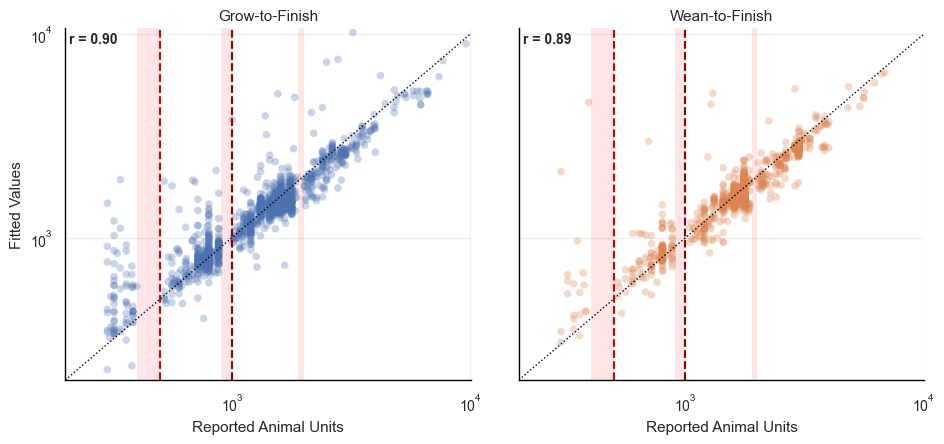

In [ ]:
# Create the lmplot
g = sns.lmplot(
    data=facilities_swine_train[
        facilities_swine_train.swine_cat_combined_label.isin(included_types)
    ],
    x="reported_animal_units",
    y="fitted",
    col="swine_cat_combined_label",
    hue="swine_cat_combined_label",
    col_wrap=2,
    height=5,
    scatter_kws={"alpha": 0.3, "s": 30, "edgecolor": "none"},
    line_kws={"color": "darkblue", "alpha": 0.5},
    fit_reg=False,
)

# Calculate and add correlation coefficients for each facet
for ax, name in zip(g.axes.flat, included_types):
    # Get data for this facet
    facet_data = facilities_swine_train[
        facilities_swine_train.swine_cat_combined_label == name
    ]
    corr = facet_data["reported_animal_units"].corr(facet_data["fitted"])
    # Add correlation text to top left corner
    ax.text(
        0.01,
        0.99,
        f"r = {corr:.2f}",
        transform=ax.transAxes,
        fontsize=10,
        fontweight="bold",
        verticalalignment="top",
    )
    # set limits
    ax.set_xlim(200)
    ax.set_ylim(200)
    # add x=y line
    ax.plot(
        ax.get_xlim(), ax.get_xlim(), linestyle="dotted", color="black", linewidth=1
    )
    # Add red line and shading for the excluded areas on each facet.
    for threshold, (label, color) in thresholds.items():
        ax.axvline(threshold, color=color, linestyle="--")
    for i, (low, high) in enumerate(exclusion_aus):
        label = "Excluded Training Range" if i == 0 else None
        ax.axvspan(
            low,
            high,
            facecolor="red",
            alpha=0.1,
            edgecolor="none",
            label=label,
        )
    # add log scale axis, add lines and dont abbreviate axis labels with 10^
    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.set_xlabel("Reported Animal Units")
    ax.set_ylabel("Fitted Values")
    ax.axhline(1, color="black", linestyle="--", alpha=0.7)
    ax.axvline(1, color="black", linestyle="--", alpha=0.7)

# Set the titles for each facet.
g.set_titles(col_template="{col_name}")

# Set axis labels.
g.set_axis_labels("Reported Animal Units", "Fitted Values")

# Adjust layout to prevent label cutoff
plt.tight_layout()

# Save and display the plot.
plt.savefig("output/plots/training_fit_regression.png", dpi=300, bbox_inches="tight")
plt.show()

# Figure: Residual plot, reported vs. residual animal units

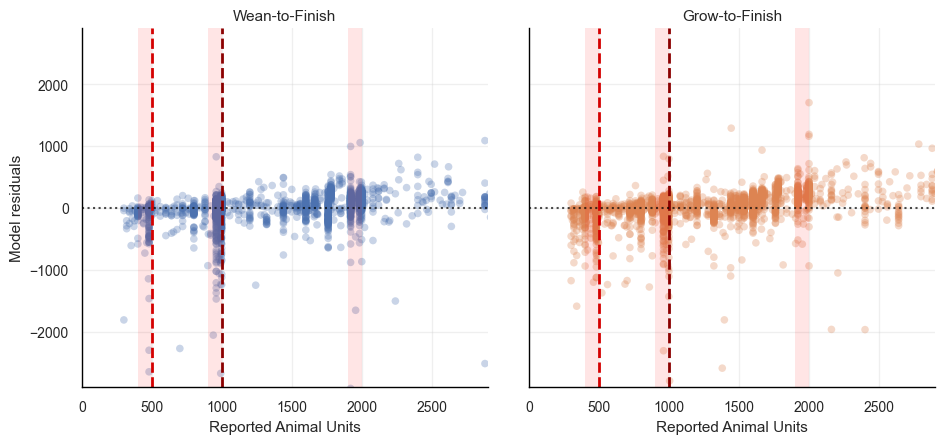

In [ ]:
g = sns.lmplot(
    data=facilities_swine[
        facilities_swine.swine_cat_combined_label.isin(included_types)
    ],
    x="reported_animal_units",
    y="residuals",
    col="swine_cat_combined_label",
    hue="swine_cat_combined_label",
    col_wrap=2,
    height=5,
    scatter_kws={"alpha": 0.3, "s": 30, "edgecolor": "none"},
    fit_reg=False,  # This removes the trend line
)

# add xlim
for ax in g.axes.flat:
    ax.set_xlim(0, au_plot_limit)
    ax.set_ylim(-au_plot_limit, au_plot_limit)

# Add shading for the excluded areas on each facet.
for ax in g.axes.flat:
    for i, (low, high) in enumerate(exclusion_aus):
        # Add label only for the first shaded region to avoid duplicate legend entries.
        label = "Excluded Training Range" if i == 0 else None
        ax.axvspan(
            low,
            high,
            facecolor="red",
            alpha=0.1,
            edgecolor="none",
            label=label,
        )

# Add vertical threshold lines with labels on each facet.
# (Assuming 'thresholds' is a dictionary, e.g., {500: "Threshold A", 1000: "Threshold B", ...})
for ax in g.axes.flat:
    for threshold, (label, color) in thresholds.items():
        ax.axvline(threshold, color=color, linestyle="--", lw=2)

# Set the titles for each facet.
g.set_titles(col_template="{col_name}")

for ax in g.axes.flat:
    ax.axhline(0, color="black", linestyle="dotted", alpha=0.7)

# add axis legends
g.set_axis_labels("Reported Animal Units", "Model residuals")
g.tight_layout()
plt.savefig("output/plots/residuals_by_reported.png", dpi=300)
plt.show()

# Histogram, Estimated vs Reported pollutants

In [ ]:
facilities_melt = facilities_swine.melt(
    value_vars=[
        "reported_ch4_total",
        "estimated_ch4_total",
        "reported_n2o_total",
        "estimated_n2o_total",
    ],
    var_name="measure_type",
    value_name="value",
)

facilities_melt["category"] = facilities_melt["measure_type"].apply(
    lambda x: "Estimated" if "estimated" in x else "Reported"
)

# Create a new column for the pollutant type
facilities_melt["pollutant_type"] = facilities_melt["measure_type"].apply(
    lambda x: x.replace("estimated_", "").replace("reported_", "")
)

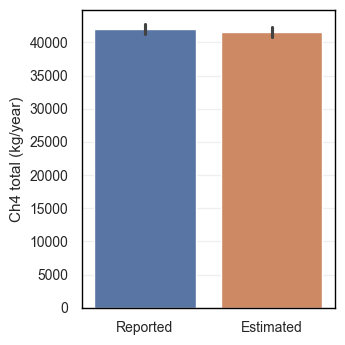

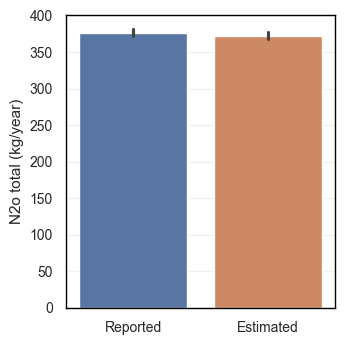

In [ ]:
# generate bar plots
for p in ["ch4_total", "n2o_total"]:
    fig, ax = plt.subplots(figsize=(4, 4))
    sns.barplot(
        data=facilities_melt[facilities_melt["pollutant_type"] == p],
        x="category",
        y="value",
        hue="category",
        ax=ax,
    )

    ax.set_ylabel(f"{p.replace('_', ' ').capitalize()} (kg/year)")
    ax.set_xlabel("")

    plt.tight_layout()
    plt.savefig(f"output/plots/pollutant_{p}_barplot.png", dpi=300)
    plt.show()

# Map plots

In [ ]:
tracts = gpd.read_postgis(
    "SELECT id as tract_id, population, geometry from processed.census_tracts",
    s.get_engine(),
    geom_col="geometry",
)

## Map 1: Permit locations

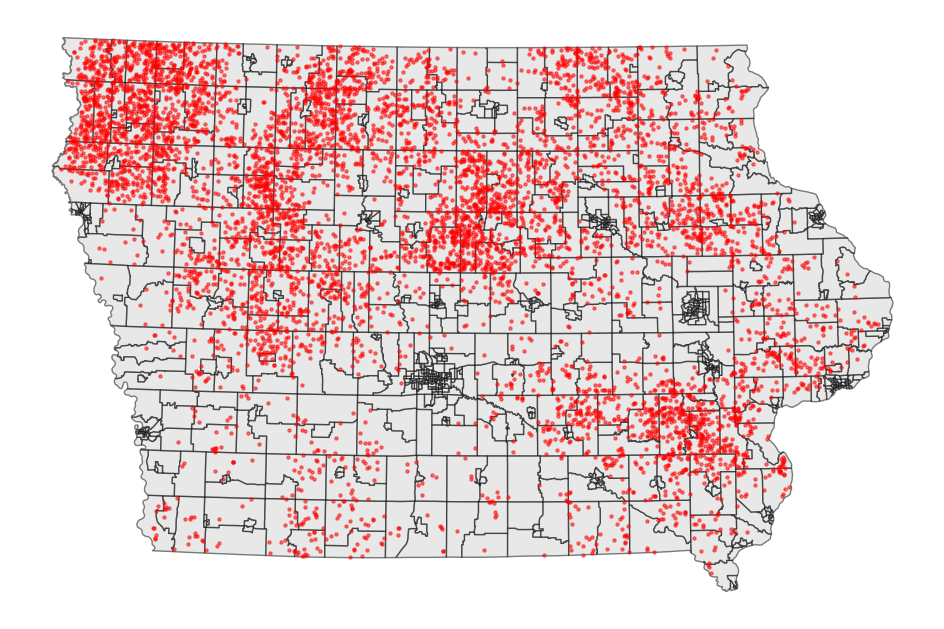

In [ ]:
# plot permit locations
facility_permits = facilities_swine[["facility_id", "permit_geoms"]].copy()


# explode permit ids and geometries
facility_permits = facility_permits.explode("permit_geoms")
# convert permit_geoms to geometry
facility_permits["permit_geoms"] = facility_permits["permit_geoms"].apply(
    lambda x: wkt.loads(x)
)

gdf = gpd.GeoDataFrame(facility_permits, geometry="permit_geoms")
gdf.crs = facilities_swine.crs

fig, ax = plt.subplots(figsize=(10, 7))
tracts.plot(ax=ax, color="lightgrey", edgecolor="black", alpha=0.5)
gdf.plot(ax=ax, markersize=5, alpha=0.5, color='red')
ax.axis("off")
plt.tight_layout()
plt.savefig("output/plots/permit_locations.png", dpi=300)

In [ ]:
# Reconcile permit counts
print(f"Total permits in DB (swine_animal_units > 0): {len(permits)}")
print(f"Permits retained in swine facility model set:  {len(gdf)}")
print(f"Dropped during pipeline: {len(permits) - len(gdf)}")

Total permits in DB (swine_animal_units > 0): 8738
Permits retained in swine facility model set:  6735
Dropped during pipeline: 2003


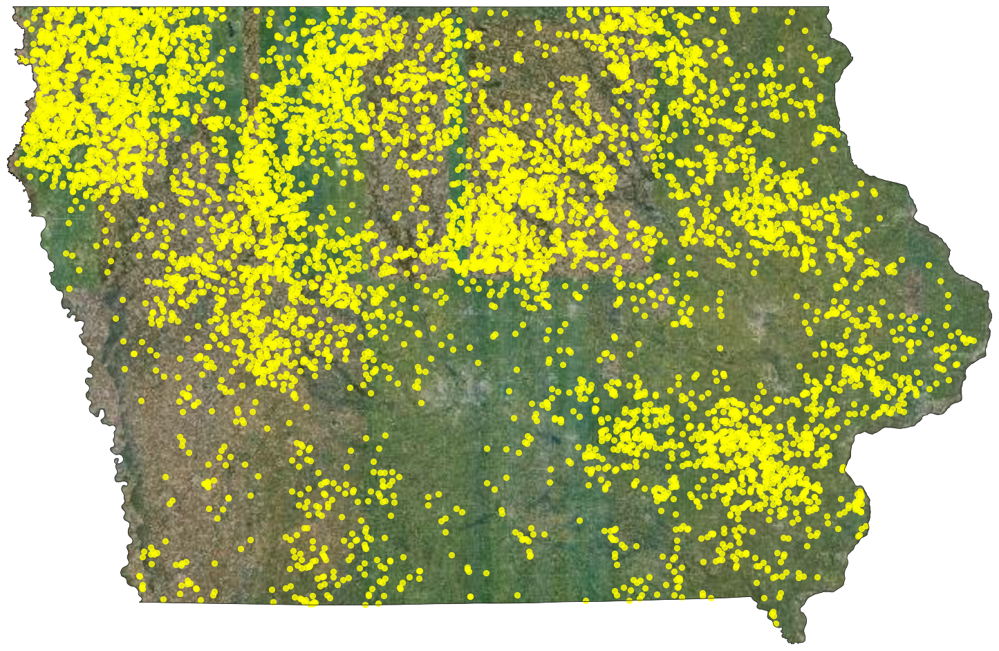

In [ ]:
import contextily as ctx
from shapely.geometry import box as shapely_box

# Build Iowa boundary in EPSG:3857 from census tracts
iowa_3857 = tracts.to_crs(epsg=3857).geometry.unary_union
xmin, ymin, xmax, ymax = iowa_3857.bounds

# White mask polygon covering everything outside Iowa
outside_iowa = shapely_box(xmin - 1e5, ymin - 1e5, xmax + 1e5, ymax + 1e5).difference(iowa_3857)
outside_gdf = gpd.GeoDataFrame(geometry=[outside_iowa], crs='EPSG:3857')
iowa_border_gdf = gpd.GeoDataFrame(geometry=[iowa_3857], crs='EPSG:3857')

gdf_3857 = gdf.to_crs(epsg=3857)

naip_url = 'https://gis.apfo.usda.gov/arcgis/rest/services/NAIP/USDA_CONUS_PRIME/ImageServer/tile/{z}/{y}/{x}'

fig, ax = plt.subplots(figsize=(15, 10))
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

ctx.add_basemap(ax, source=naip_url, attribution='')
outside_gdf.plot(ax=ax, color='white', edgecolor='none')  # mask outside Iowa
iowa_border_gdf.boundary.plot(ax=ax, color='black', linewidth=0.5)  # state border
gdf_3857.plot(ax=ax, markersize=32, color='yellow', alpha=0.8)  # permits

ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)
ax.axis('off')
plt.tight_layout()
plt.savefig('output/plots/permit_locations_naip.png', dpi=300, bbox_inches='tight')
plt.show()


/Users/eacook/eacook/cafo-iowa-public/.venv/lib/python3.12/site-packages/IPython/core/interactiveshell.py:3517: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):


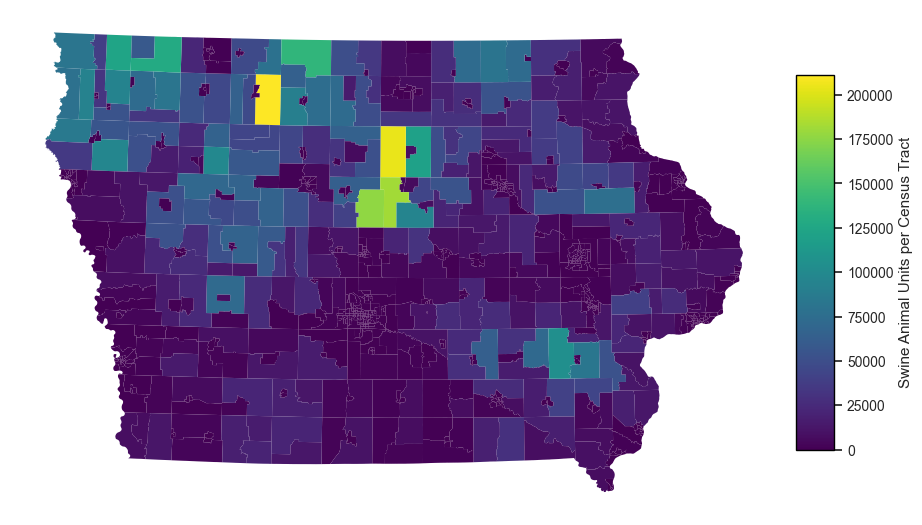

In [ ]:
# combine tracts and facilities
# merge tracts and facilities based on facility centroid
facilities_swine_plot = facilities_swine.copy()
facilities_swine_plot["facility_centroid"] = facilities_swine.geometry.centroid
facilities_swine_plot = facilities_swine_plot.set_geometry("facility_centroid")

# spatial join
tracts_facilities = gpd.sjoin(tracts, facilities_swine_plot, how="left", op="contains")
# sum animal units per tract
tracts_facilities = tracts_facilities.groupby("tract_id").agg(
    reported_animal_units=("reported_animal_units", "sum"),
    population=("population", "first"),
    geometry=("geometry", "first"),
)
tracts_facilities = gpd.GeoDataFrame(tracts_facilities, geometry="geometry")
tracts_facilities.crs = tracts.crs

# calculate animal density per capita
tracts_facilities["animal_density"] = (
    tracts_facilities["reported_animal_units"] / tracts_facilities["population"]
)
tracts_facilities["animal_density"] = tracts_facilities["animal_density"].fillna(0)

# plot map
fig, ax = plt.subplots(figsize=(10, 7))

# Create the map plot
tracts_facilities.plot(
    ax=ax,
    column="reported_animal_units",
    cmap="viridis",
    edgecolor="none",
    legend=False,  # Disable the default legend
)

# Add a colorbar manually
sm = plt.cm.ScalarMappable(
    cmap="viridis",
    norm=plt.Normalize(
        vmin=tracts_facilities["reported_animal_units"].min(),
        vmax=tracts_facilities["reported_animal_units"].max(),
    ),
)
cbar = fig.colorbar(sm, ax=ax, shrink=0.6, aspect=10, pad=0.02)
cbar.set_label("Swine Animal Units per Census Tract")

# Remove axis
ax.axis("off")

plt.tight_layout()
plt.savefig(
    "output/plots/map_animal_units.png", dpi=300, bbox_inches="tight"
)  # Ensure full figure including legend
plt.show()

## Map 2: CH4 Map

In [ ]:
# Perform spatial join with facilities
tract_facilities = gpd.sjoin(
    tracts, facilities_swine, how="inner", predicate="intersects"
)

# Aggregate emissions by county
tract_emissions = tract_facilities.groupby("tract_id", as_index=False).agg(
    {
        "reported_ch4_total": "sum",
        "estimated_ch4_total": "sum",
        "reported_n2o_total": "sum",
        "estimated_n2o_total": "sum",
    }
)

# difference between reported and estimated emissions
tract_emissions["ch4_difference"] = (
    tract_emissions["reported_ch4_total"] - tract_emissions["estimated_ch4_total"]
)
tract_emissions["n2o_difference"] = (
    tract_emissions["reported_n2o_total"] - tract_emissions["estimated_n2o_total"]
)

tract_emissions = tracts.merge(tract_emissions, on="tract_id", how="left")
tract_emissions.fillna(0, inplace=True)

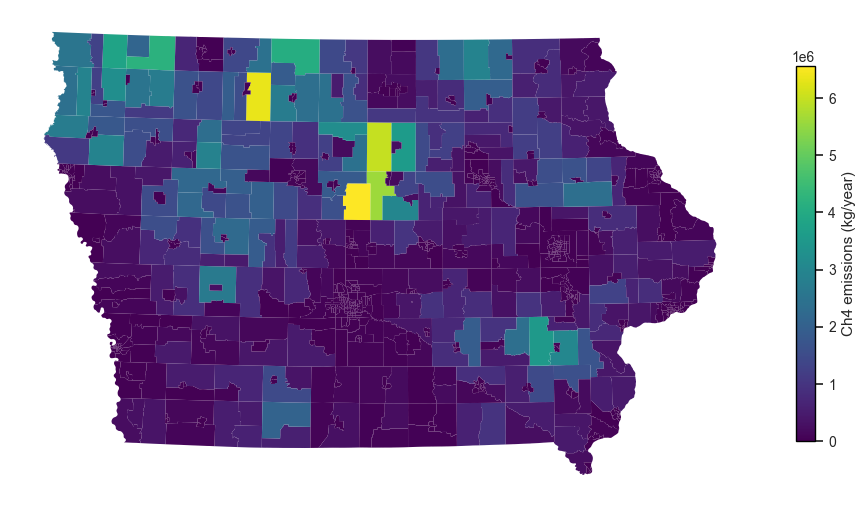

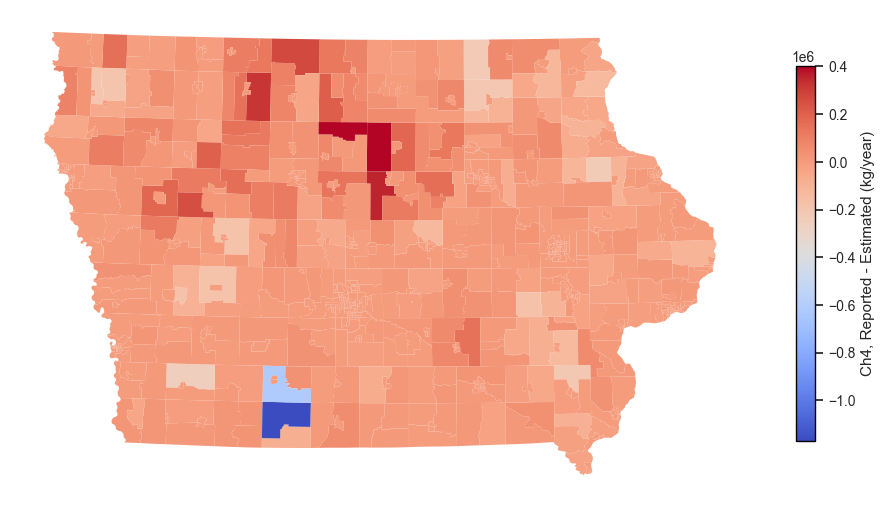

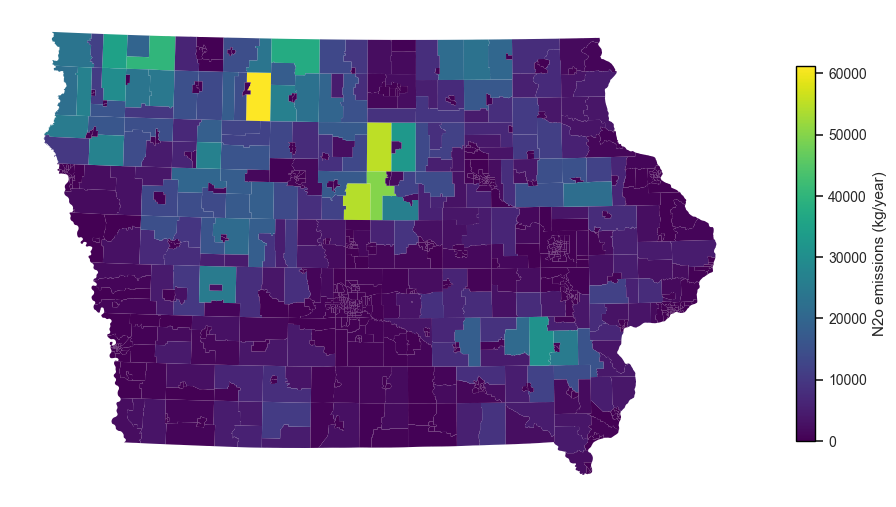

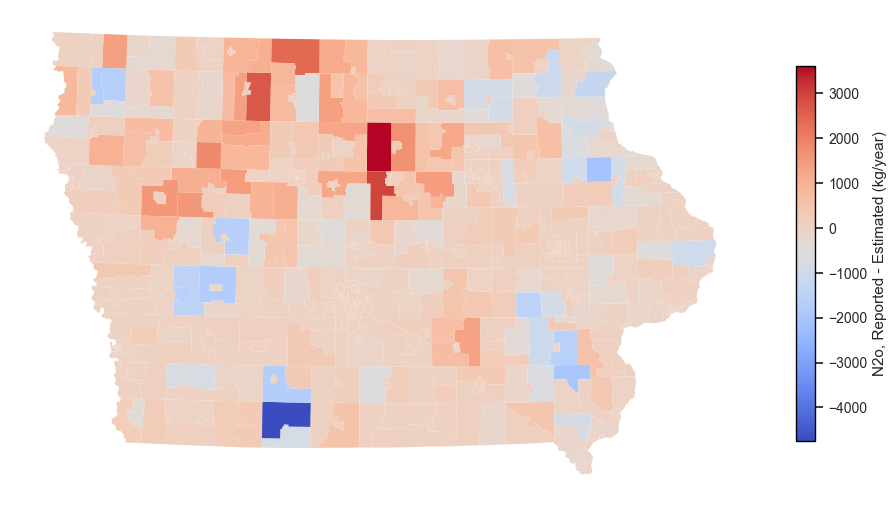

In [ ]:
# Plot emissions and differences
for p in ["ch4", "n2o"]:
    fig, ax = plt.subplots(figsize=(10, 7))
    tract_emissions.plot(
        ax=ax,
        column=f"estimated_{p}_total",
        cmap="viridis",
        edgecolor="none",
        legend=True,
        legend_kwds={
            "label": f"{p.capitalize()} emissions (kg/year)",
            "shrink": 0.6,
        },  # Adjust shrink factor
    )
    ax.axis("off")
    plt.tight_layout()
    plt.savefig(f"output/plots/{p}_emissions.png", dpi=300)
    plt.show()

    fig, ax = plt.subplots(figsize=(10, 7))
    tract_emissions.plot(
        ax=ax,
        column=f"{p}_difference",
        cmap="coolwarm",
        edgecolor="none",
        legend=True,
        legend_kwds={
            "label": f"{p.capitalize()}, Reported - Estimated (kg/year)",
            "shrink": 0.6,
        },  # Adjust shrink factor
    )
    ax.axis("off")
    plt.tight_layout()
    plt.savefig(f"output/plots/{p}_difference.png", dpi=300)
    plt.show()

# Alternative figures

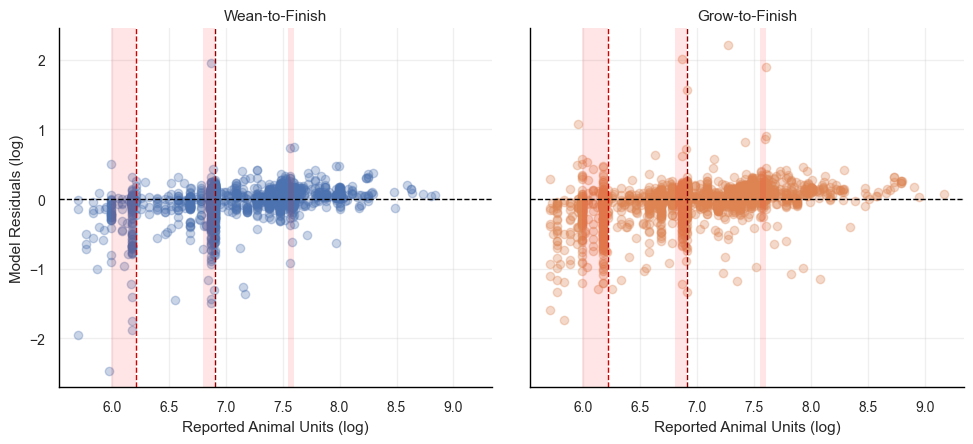

In [ ]:
# Residual plot, facetted by swine category
g = sns.lmplot(
    data=facilities_swine,
    x="log_reported_animal_units",
    y="log_residuals",
    col="swine_cat_combined_label",
    hue="swine_cat_combined_label",
    col_wrap=3,
    height=5,
    scatter_kws={"alpha": 0.3},
    fit_reg=False,  # Disable regression line.
)

# Add vertical line at 0 for each facet.
for ax in g.axes.flat:
    ax.axhline(0, color="black", linestyle="--", lw=1)

# Add shading for the excluded areas on each facet.
for ax in g.axes.flat:
    for i, (low, high) in enumerate(exclusion_aus):
        # Add label only for the first shaded region to avoid duplicate legend entries.
        label = "Excluded Training Range" if i == 0 else None
        ax.axvspan(
            np.log(low),
            np.log(high),
            facecolor="red",
            alpha=0.1,
            edgecolor="none",
            label=label,
        )

# Add vertical threshold lines with labels on each facet.
# (Assuming 'thresholds' is a dictionary, e.g., {500: "Threshold A", 1000: "Threshold B", ...})
for ax in g.axes.flat:
    for threshold, (label, color) in thresholds.items():
        ax.axvline(np.log(threshold), color=color, linestyle="--", lw=1)

# Set the titles for each facet.
g.set_titles(col_template="{col_name}")

# Set axis labels.
g.set_axis_labels("Reported Animal Units (log)", "Model Residuals (log)")

# Adjust layout and save the figure.
plt.tight_layout()
plt.savefig("output/plots/facetted_model_residuals_log.png", dpi=300)
plt.show()

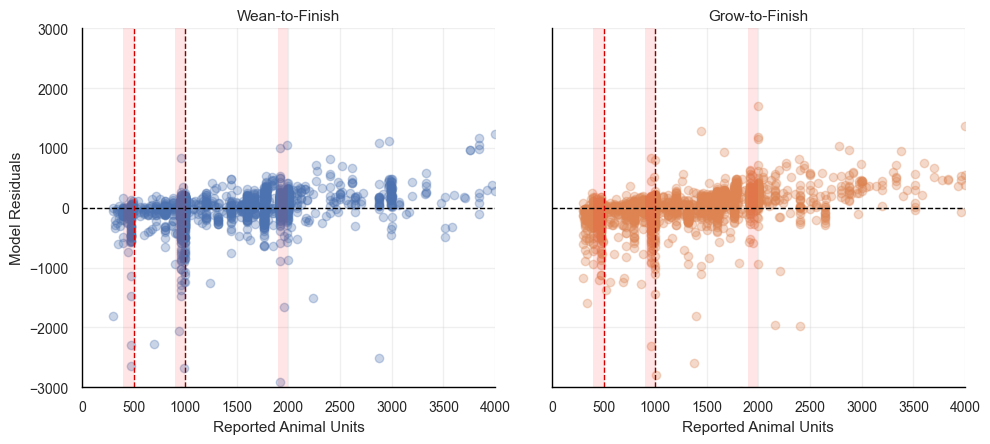

In [ ]:
# Residual plot, facetted by swine category, absolute difference
g = sns.lmplot(
    data=facilities_swine,
    x="reported_animal_units",
    y="residuals",
    col="swine_cat_combined_label",
    hue="swine_cat_combined_label",
    col_wrap=3,
    height=5,
    scatter_kws={"alpha": 0.3},
    fit_reg=False,  # Disable regression line.
)

# Add vertical line at 0 for each facet.
for ax in g.axes.flat:
    ax.axhline(0, color="black", linestyle="--", lw=1)

# Add shading for the excluded areas on each facet.
for ax in g.axes.flat:
    for i, (low, high) in enumerate(exclusion_aus):
        # Add label only for the first shaded region to avoid duplicate legend entries.
        label = "Excluded Training Range" if i == 0 else None
        ax.axvspan(low, high, facecolor="red", alpha=0.1, edgecolor="none", label=label)

# Add vertical threshold lines with labels on each facet.
# (Assuming 'thresholds' is a dictionary, e.g., {500: "Threshold A", 1000: "Threshold B", ...})
for ax in g.axes.flat:
    for threshold, (label, color) in thresholds.items():
        ax.axvline(threshold, color=color, linestyle="--", lw=1)

# Set the titles for each facet.
g.set_titles(col_template="{col_name}")

# Set axis labels.
g.set_axis_labels("Reported Animal Units", "Model Residuals")

# change axis limits
for ax in g.axes.flat:
    ax.set_xlim(0, 4000)
    ax.set_ylim(-3000, 3000)

# Adjust layout and save the figure.
plt.tight_layout()
plt.savefig("output/plots/facetted_model_residuals.png", dpi=300)
plt.show()

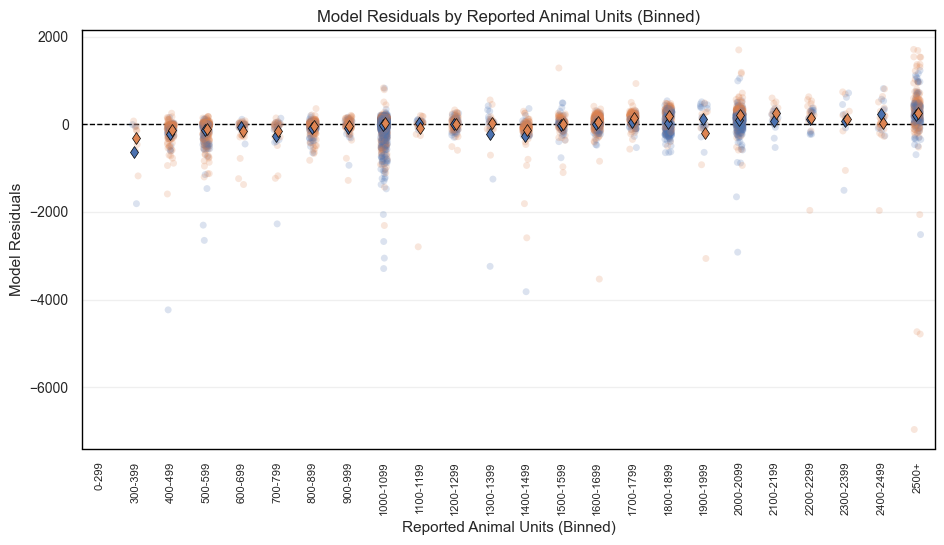

In [ ]:
# Model residuals by reported animal units (binned)
plt.figure(figsize=(10, 6))

# Scatter plot (stripplot) for individual data points
sns.stripplot(
    data=facilities_swine,
    x="reported_animal_units_bin",
    y="residuals",
    hue="swine_cat_combined_label",
    alpha=0.2,
    jitter=True,
    legend=False,  # Remove legend from hue
)

# Overlay the mean markers (pointplot) at the same x position
sns.pointplot(
    data=facilities_swine,
    x="reported_animal_units_bin",
    y="residuals",
    hue="swine_cat_combined_label",
    errorbar=None,
    markers="d",
    markersize=6,
    markeredgecolor="black",
    markeredgewidth=0.5,
    linestyle="none",
    dodge=True,
    zorder=3,
    legend=False,  # Remove legend from hue
)

# Add horizontal and vertical reference lines
plt.axhline(0, color="black", linestyle="--", linewidth=1, zorder=2)

# Labels and title
plt.xlabel("Reported Animal Units (Binned)")
plt.ylabel("Model Residuals")
plt.title("Model Residuals by Reported Animal Units (Binned)")

# Rotate x-axis labels for clarity
plt.xticks(rotation=90, fontsize=8)


# Adjust layout
plt.tight_layout()

# Save plot
plt.savefig("output/plots/model_residuals_binned.png", dpi=300)

# Show plot
plt.show()

/Users/eacook/eacook/cafo-iowa-public/.venv/lib/python3.12/site-packages/seaborn/axisgrid.py:718: UserWarning: Using the stripplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)
/Users/eacook/eacook/cafo-iowa-public/.venv/lib/python3.12/site-packages/seaborn/axisgrid.py:718: UserWarning: Using the pointplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


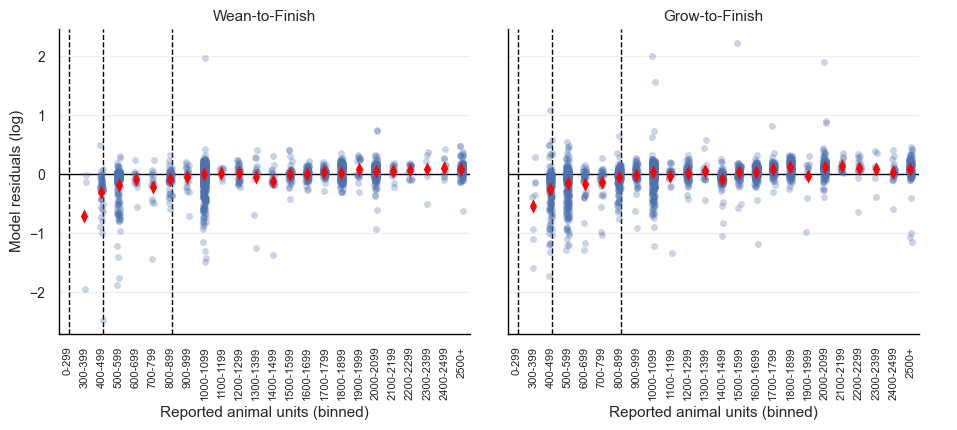

In [ ]:
g = sns.FacetGrid(
    facilities_swine,
    col="swine_cat_combined_label",
    col_wrap=2,
    sharex=True,
    sharey=True,
    # increase the height of each plot
    height=5,
)

# First, plot the scatter points (stripplot) in the background
g.map(sns.stripplot, "reported_animal_units_bin", "log_residuals", alpha=0.3)

# Then, overlay the mean markers (pointplot) so they appear in the front
g.map(
    sns.pointplot,
    "reported_animal_units_bin",
    "log_residuals",
    errorbar=None,
    markers="d",
    markersize=4,
    linestyle="none",
    color="red",
    zorder=3,  # Ensure it's plotted above other elements
)

g.set_titles(col_template="{col_name}")

# Remove individual axis labels
for ax in g.axes.flat:
    ax.set_xlabel("Reported animal units (binned)")
    ax.set_ylabel("Model residuals (log)")

# Add horizontal and vertical reference lines
for ax in g.axes.flat:
    ax.axhline(
        0, color="black", linestyle="-", linewidth=1, zorder=2
    )  # Horizontal line at 0
    ax.axvline(0.1, color="black", linestyle="dashed", linewidth=1, zorder=2)
    ax.axvline(2.1, color="black", linestyle="dashed", linewidth=1, zorder=2)
    ax.axvline(6.1, color="black", linestyle="dashed", linewidth=1, zorder=2)

# Rotate x-axis labels
for ax in g.axes.flat:
    for label in ax.get_xticklabels():
        label.set_rotation(90)
        label.set_fontsize(8)

# Add legend
g.add_legend()

# Adjust layout to fit the shared labels properly
plt.tight_layout(rect=[0.03, 0.03, 1, 1])

# Show plot
plt.show()